# Summary

- There are 1303 records in the `input.csv`. 
- There are 2 records which have no twitter account:
    - Evercore Inc
    - FuelCell Energy Inc
- There are some records with same date and twitter account: 
    - ('@blackrock', '6/3/17') 7
    - ('@blackrock', '2/9/16') 7
    - ('@CaterpillarInc', '1/8/14') 2 (same record)
    - ('@RoyceFunds', '2/3/16') 3
    - ('@veritoneinc', '27/1/17') 2 (same record)
- There are 1285 results.
- There are 634 results which have larger than 100 tweets

In [3]:
import os, csv, datetime
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# part = 3
# input_file = 'input_part' + str(part) + '.csv'
input_file = 'input.csv'
output_file = 'output.csv'
res_dict = 'res/'
BEFORE_TIME_DELTA = datetime.timedelta(days=-60)
AFTER_TIME_DELTA = datetime.timedelta(days=5)

In [25]:
# find the max tweets result.

def get_max_tweets(res_dict):
    max_line = 0
    max_file = None
    for filename in os.listdir(res_dict):
        if filename[-3:] == 'csv':
            with open('res/'+filename, encoding="utf8") as f:
                lines = sum(1 for line in f)
                if lines > max_line:
                    max_line = lines
                    max_file = filename
    return max_line, max_file

max_line, max_file = get_max_tweets(res_dict)
print(max_line, max_file)

554906 Etsy_20150304.csv


In [ ]:
# count the number of records in input.csv

def count_records(input_file):
    count = 0
    with open(input_file, encoding = "ISO-8859-1") as f:
        reader = csv.DictReader(f)
        for row in reader:
            date = row['eventDate']
            account_name = row['twitter_account_name']
            count += 1
    return count

In [ ]:
# check the number of files

def get_length_dict(res_dict):
    return len(os.listdir(res_dict))

In [ ]:
# check if all account start with '@'

def check_valid_format(input_file):
    with open(input_file, encoding = "ISO-8859-1") as f:
        reader = csv.DictReader(f)
        for row in reader:
            date = row['eventDate']
            account_name = row['twitter_account_name']
            if account_name and account_name[0] != '@':
                return False
        return True

# check all empty account

def get_empty_account(input_file):
    with open(input_file, encoding = "ISO-8859-1") as f:
        reader = csv.DictReader(f)
        for row in reader:
            date = row['eventDate']
            account_name = row['twitter_account_name'][1:]
            if account_name == '':
                print(date)

In [ ]:
# split input csv

def split_csv(split_length=300, input_file):
    outputBase = 'input_part'
    lines = open(input_file, 'r', encoding = "ISO-8859-1").read().split('\n')
    at = 1
    for i in range(1, len(lines), split_length):
        outputData = []
        outputData.append(lines[0])
        outputData.extend(lines[i:i + split_length])
        output = open(outputBase + str(at) + '.csv', 'w')
        output.write('\n'.join(outputData))
        output.close()
        at += 1

In [13]:
# check the difference between input.csv and res

def check_difference():
    result_set1 = set()
    with open(input_file, encoding = "ISO-8859-1") as f:
        reader = csv.DictReader(f)
        for row in reader:
            date = row['eventDate']
            account_name = row['twitter_account_name'][1:]
            if account_name == '':
                continue
            day, month, year = map(int, date.split('/'))
            year += 2000
            event_date = datetime.date(year, month, day)
            result_file_name = '{}{}_{}.csv'.format(res_dict, account_name, event_date.strftime('%Y%m%d'))
            result_set1.add(result_file_name)
    result_set2 = set([res_dict + filename for filename in os.listdir(res_dict) if filename[-1] == 'v'])
    if not result_set2.difference(result_set1) and not result_set1.difference(result_set2):
        return True
    else:
        return False
    
check_difference()

True

In [ ]:
# check the same account and date

def check_same_account_and_date(input_file):
    count = dict()
    with open(input_file, encoding = "ISO-8859-1") as f:
        reader = csv.DictReader(f)
        for row in reader:
            date = row['eventDate']
            account_name = row['twitter_account_name']

            if (account_name, date) in count.keys():
                count[(account_name, date)] += 1
            else:
                count[(account_name, date)] = 1
    for k, v in count.items():
        if v > 1:
            print(k, v)

In [ ]:
# find the results that have no tweet

def get_empty_results(input_file):
    count = 0
    with open(input_file, encoding = "ISO-8859-1") as f:
        reader = csv.DictReader(f)
        for row in reader:
            date = row['eventDate']
            account_name = row['twitter_account_name'][1:]
            day, month, year = map(int, date.split('/'))
            year += 2000
            event_date = datetime.date(year, month, day)
            result_file_name = 'res/{}_{}.csv'.format(account_name, event_date.strftime('%Y%m%d'))
            if os.path.isfile(result_file_name):
                with open(result_file_name) as result_f:
                    len_lines = sum(1 for line in result_f)
                    if len_lines == 1:
                        print(result_file_name)
                        count+=1
    return count

# Find suspicious results

def get_suspicious_results(input_file):
    count = 0
    with open(input_file, encoding = "ISO-8859-1") as f:
        reader = csv.DictReader(f)
        for row in reader:
            date = row['eventDate']
            account_name = row['twitter_account_name'][1:]
            day, month, year = map(int, date.split('/'))
            year += 2000
            event_date = datetime.date(year, month, day)
            result_file_name = 'res/{}_{}.csv'.format(account_name, event_date.strftime('%Y%m%d'))
            if os.path.isfile(result_file_name):
                with open(result_file_name) as result_f:
                    len_lines = sum(1 for line in result_f)
                    if len_lines != 1 and len_lines % 100 == 1:
                        print(result_file_name, len_lines)
                        count+=1
    return count

In [5]:
def get_output(input_file, output_file):
    count = dict()
    count_company = dict()
    count_other = dict()
    x = range(65)

    with open(input_file, encoding = "ISO-8859-1") as f, open(output_file, 'w') as output_file:
        output_file.write('event_date,company_twitter_account,code,' +
                          'daily_tweet_-60_-1_by_comany,daily_tweet_-60_-1_by_others,' +
                          'daily_tweet_0_3_by_comany,daily_tweet_0_3_by_others,' +
                          'daily_tweet_0_5_by_comany,daily_tweet_0_5_by_others\n')
        reader = csv.DictReader(f)
        for row in reader:
            date = row['eventDate']
            account_name = row['twitter_account_name'][1:]
            code = row['code']
            if not account_name:
                continue
            day, month, year = map(int, date.split('/'))
            year += 2000
            event_date = datetime.date(year, month, day)
            start_date = event_date + BEFORE_TIME_DELTA
            end_date = event_date + AFTER_TIME_DELTA
            print('account_name:', account_name, 'event_date:', event_date)
            print('start_date:', start_date, 'end_date:', end_date)
            result_file_name = 'res/{}_{}.csv'.format(account_name, event_date.strftime('%Y%m%d'))
            for i in x:
                cur_delta = datetime.timedelta(days=i)
                count[cur_delta] = 0
                count_company[cur_delta] = 0
                count_other[cur_delta] = 0
            with open(result_file_name) as result_f:
                next(result_f)
                for line in result_f:
                    words = line.split(',')
                    time, username = words[0], words[1]
                    date = time.split()[0]
                    year, month, day = map(int, date.split('-'))
                    cur_date = datetime.date(year, month, day)
                    cur_delta = cur_date - start_date
                    count[cur_delta] += 1
                    if username == account_name:
                        count_company[cur_delta] += 1
                    else:
                        count_other[cur_delta] += 1
            print('Sum of tweets:', sum(count.values()))
    #         if sum(count.values()) < 100:
    #             continue
            y = [count[datetime.timedelta(days=i)] for i in x]
            y_company = [count_company[datetime.timedelta(days=i)] for i in x]
            y_other = [count_other[datetime.timedelta(days=i)] for i in x]
            output_file.write('{},{},{},{},{},{},{},{},{}\n'.format(event_date.strftime('%Y-%m-%d'),
                                                                 account_name,
                                                                 code,
                                                                 sum(y_company[:60]) / 60,
                                                                 sum(y_other[:60]) / 60,
                                                                 sum(y_company[60:63]) / 3,
                                                                 sum(y_other[60:63]) / 3,
                                                                 sum(y_company[60:65]) / 5,
                                                                 sum(y_other[60:65]) / 5))
    #         plt.plot(x, y)
    #         plt.title('Daily tweets from -60 days to 5 days')
    #         plt.xlabel('days')
    #         plt.ylabel('Number of tweets')
    #         plt.show()
get_output(input_file, output_file)

account_name: SantanderMx event_date: 2017-04-28
start_date: 2017-02-27 end_date: 2017-05-03
Sum of tweets: 9728
account_name: 3M event_date: 2017-01-24
start_date: 2016-11-25 end_date: 2017-01-29
Sum of tweets: 2573
account_name: 3M event_date: 2014-02-13
start_date: 2013-12-15 end_date: 2014-02-18
Sum of tweets: 420
account_name: AARCORP event_date: 2015-07-15
start_date: 2015-05-16 end_date: 2015-07-20
Sum of tweets: 234
account_name: AbaxisVetScan event_date: 2016-02-09
start_date: 2015-12-11 end_date: 2016-02-14
Sum of tweets: 18
account_name: abiomedimpella event_date: 2014-05-28
start_date: 2014-03-29 end_date: 2014-06-02
Sum of tweets: 3
account_name: Acacia_Research event_date: 2013-11-07
start_date: 2013-09-08 end_date: 2013-11-12
Sum of tweets: 1
account_name: Accenture event_date: 2013-10-29
start_date: 2013-08-30 end_date: 2013-11-03
Sum of tweets: 4396
account_name: Adaptimmune event_date: 2016-11-10
start_date: 2016-09-11 end_date: 2016-11-15
Sum of tweets: 128
account_n

account_name: SantanderMx event_date: 2017-04-28
start_date: 2017-02-27 end_date: 2017-05-03
Sum of tweets: 9728


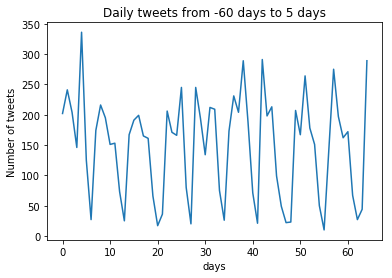





account_name: 3M event_date: 2017-01-24
start_date: 2016-11-25 end_date: 2017-01-29
Sum of tweets: 2573


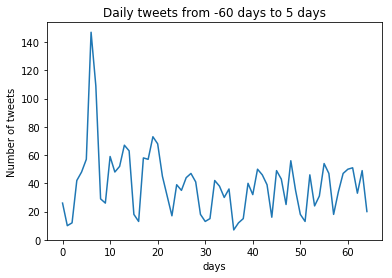





account_name: 3M event_date: 2014-02-13
start_date: 2013-12-15 end_date: 2014-02-18
Sum of tweets: 420


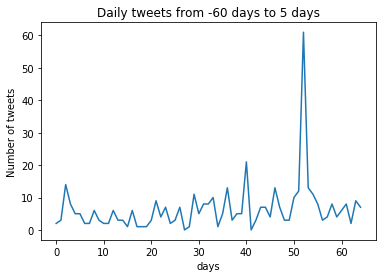





account_name: AARCORP event_date: 2015-07-15
start_date: 2015-05-16 end_date: 2015-07-20
Sum of tweets: 234


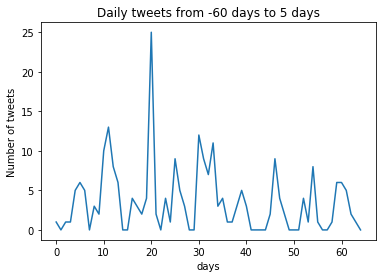





account_name: AbaxisVetScan event_date: 2016-02-09
start_date: 2015-12-11 end_date: 2016-02-14
Sum of tweets: 18
account_name: abiomedimpella event_date: 2014-05-28
start_date: 2014-03-29 end_date: 2014-06-02
Sum of tweets: 3
account_name: Acacia_Research event_date: 2013-11-07
start_date: 2013-09-08 end_date: 2013-11-12
Sum of tweets: 1
account_name: Accenture event_date: 2013-10-29
start_date: 2013-08-30 end_date: 2013-11-03
Sum of tweets: 4396


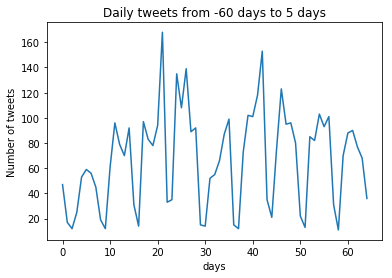





account_name: Adaptimmune event_date: 2016-11-10
start_date: 2016-09-11 end_date: 2016-11-15
Sum of tweets: 128


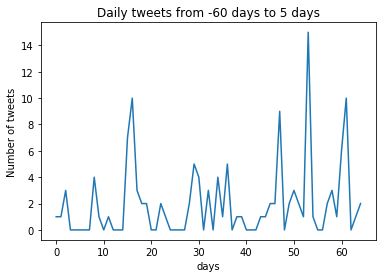





account_name: Adaptimmune event_date: 2015-04-06
start_date: 2015-02-05 end_date: 2015-04-11
Sum of tweets: 0
account_name: Adient event_date: 2017-11-02
start_date: 2017-09-03 end_date: 2017-11-07
Sum of tweets: 292


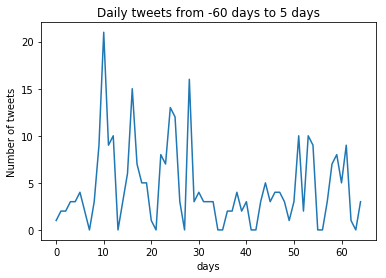





account_name: Adient event_date: 2016-11-29
start_date: 2016-09-30 end_date: 2016-12-04
Sum of tweets: 195


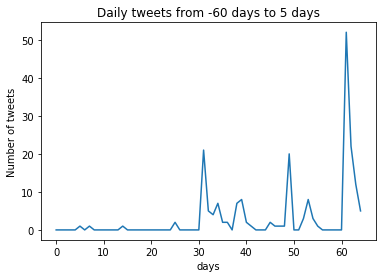





account_name: ADTRAN event_date: 2014-02-27
start_date: 2013-12-29 end_date: 2014-03-04
Sum of tweets: 687


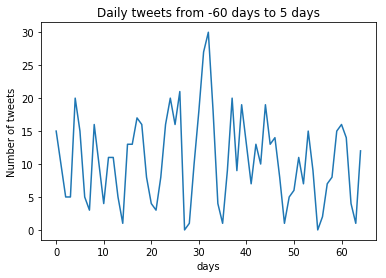





account_name: ADS__Inc event_date: 2016-11-29
start_date: 2016-09-30 end_date: 2016-12-04
Sum of tweets: 55
account_name: ADS__Inc event_date: 2016-09-15
start_date: 2016-07-17 end_date: 2016-09-20
Sum of tweets: 25
account_name: ADS__Inc event_date: 2015-06-30
start_date: 2015-05-01 end_date: 2015-07-05
Sum of tweets: 43
account_name: ADAESInc event_date: 2014-03-18
start_date: 2014-01-17 end_date: 2014-03-23
Sum of tweets: 6
account_name: AdvEnergy event_date: 2014-03-03
start_date: 2014-01-02 end_date: 2014-03-08
Sum of tweets: 267


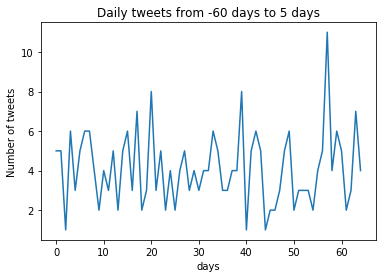





account_name: AdvisoryBd event_date: 2016-03-11
start_date: 2016-01-11 end_date: 2016-03-16
Sum of tweets: 359


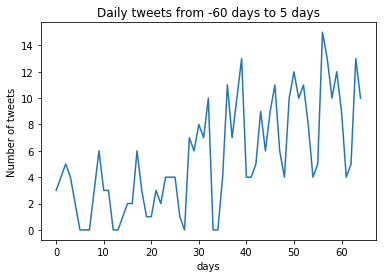





account_name: AdvisoryBd event_date: 2014-02-10
start_date: 2013-12-12 end_date: 2014-02-15
Sum of tweets: 18
account_name: AdvisoryBd event_date: 2013-05-30
start_date: 2013-03-31 end_date: 2013-06-04
Sum of tweets: 31
account_name: AdvisoryBd event_date: 2013-08-09
start_date: 2013-06-10 end_date: 2013-08-14
Sum of tweets: 27
account_name: AerojetRdyne event_date: 2016-02-01
start_date: 2015-12-03 end_date: 2016-02-06
Sum of tweets: 343


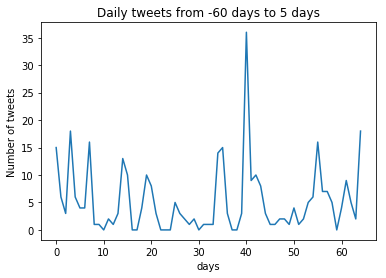





account_name: AerojetRdyne event_date: 2015-01-30
start_date: 2014-12-01 end_date: 2015-02-04
Sum of tweets: 593


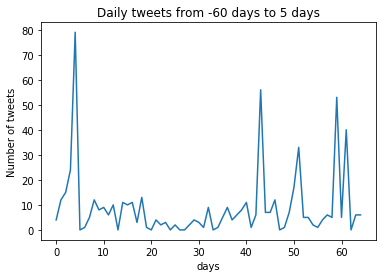





account_name: AerojetRdyne event_date: 2014-10-10
start_date: 2014-08-11 end_date: 2014-10-15
Sum of tweets: 255


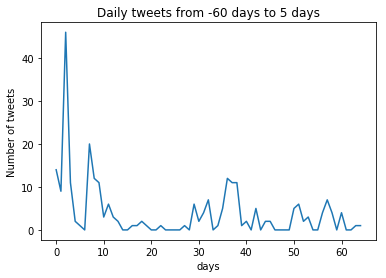





account_name: aerovironment event_date: 2015-07-01
start_date: 2015-05-02 end_date: 2015-07-06
Sum of tweets: 181


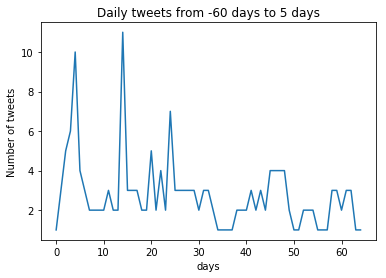





account_name: TheAESCorp event_date: 2014-02-26
start_date: 2013-12-28 end_date: 2014-03-03
Sum of tweets: 0
account_name: Agilent event_date: 2015-12-21
start_date: 2015-10-22 end_date: 2015-12-26
Sum of tweets: 202


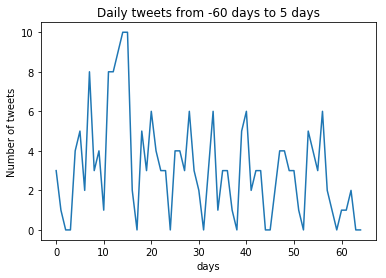





account_name: Agilent event_date: 2013-03-06
start_date: 2013-01-05 end_date: 2013-03-11
Sum of tweets: 355


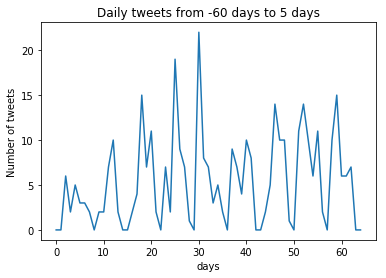





account_name: agilysys event_date: 2013-08-02
start_date: 2013-06-03 end_date: 2013-08-07
Sum of tweets: 80
account_name: AirMethodsCorp event_date: 2016-11-03
start_date: 2016-09-04 end_date: 2016-11-08
Sum of tweets: 131


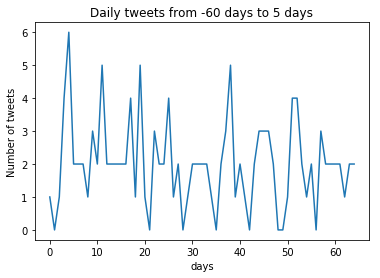





account_name: AirMethodsCorp event_date: 2016-02-26
start_date: 2015-12-28 end_date: 2016-03-02
Sum of tweets: 153


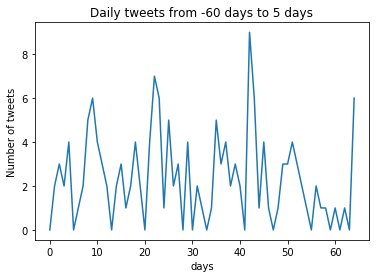





account_name: Akamai event_date: 2013-11-12
start_date: 2013-09-13 end_date: 2013-11-17
Sum of tweets: 1813


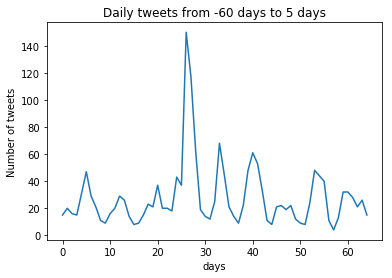





account_name: Akamai event_date: 2013-08-09
start_date: 2013-06-10 end_date: 2013-08-14
Sum of tweets: 1138


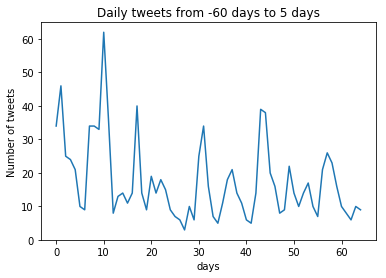





account_name: akebiatx event_date: 2016-03-14
start_date: 2016-01-14 end_date: 2016-03-19
Sum of tweets: 2
account_name: AkoustisInc event_date: 2017-11-14
start_date: 2017-09-15 end_date: 2017-11-19
Sum of tweets: 1
account_name: AlarmDotCom event_date: 2016-02-29
start_date: 2015-12-31 end_date: 2016-03-05
Sum of tweets: 912


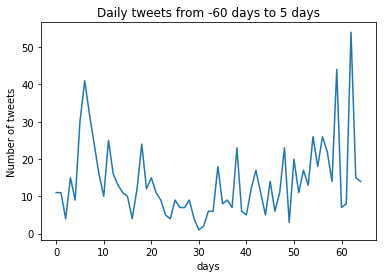





account_name: AlaskaComm event_date: 2014-02-20
start_date: 2013-12-22 end_date: 2014-02-25
Sum of tweets: 36
account_name: albint_corp event_date: 2015-02-27
start_date: 2014-12-29 end_date: 2015-03-04
Sum of tweets: 1
account_name: amriglobal event_date: 2014-08-11
start_date: 2014-06-12 end_date: 2014-08-16
Sum of tweets: 23
account_name: Alcoa event_date: 2017-03-15
start_date: 2017-01-14 end_date: 2017-03-20
Sum of tweets: 416


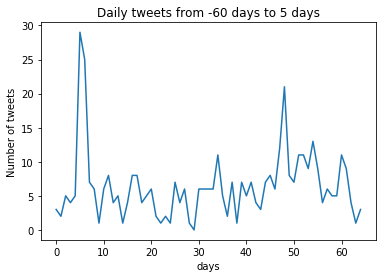





account_name: Alcoa event_date: 2016-12-01
start_date: 2016-10-02 end_date: 2016-12-06
Sum of tweets: 417


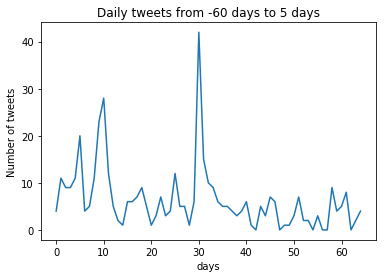





account_name: AlicoInc event_date: 2016-05-05
start_date: 2016-03-06 end_date: 2016-05-10
Sum of tweets: 1
account_name: AllegionPlc event_date: 2014-07-30
start_date: 2014-05-31 end_date: 2014-08-04
Sum of tweets: 28
account_name: AllegionPlc event_date: 2014-04-30
start_date: 2014-03-01 end_date: 2014-05-05
Sum of tweets: 29
account_name: Allergan event_date: 2015-05-11
start_date: 2015-03-12 end_date: 2015-05-16
Sum of tweets: 364


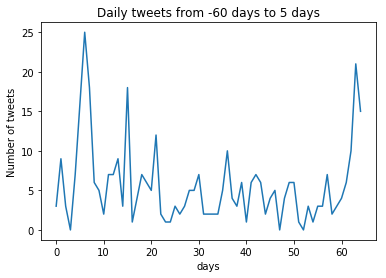





account_name: AIQ event_date: 2016-04-29
start_date: 2016-02-29 end_date: 2016-05-04
Sum of tweets: 11
account_name: AB_insights event_date: 2016-10-26
start_date: 2016-08-27 end_date: 2016-10-31
Sum of tweets: 318


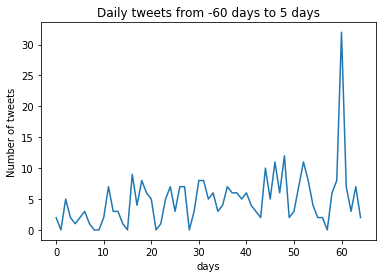





account_name: alliedmotion1 event_date: 2017-03-13
start_date: 2017-01-12 end_date: 2017-03-18
Sum of tweets: 30
account_name: AllisonTrans event_date: 2016-04-26
start_date: 2016-02-26 end_date: 2016-05-01
Sum of tweets: 35
account_name: AlphaOmega_Semi event_date: 2016-05-10
start_date: 2016-03-11 end_date: 2016-05-15
Sum of tweets: 9
account_name: Alphabetlnc event_date: 2016-11-03
start_date: 2016-09-04 end_date: 2016-11-08
Sum of tweets: 0
account_name: Alphabetlnc event_date: 2015-10-29
start_date: 2015-08-30 end_date: 2015-11-03
Sum of tweets: 2
account_name: alteryx event_date: 2017-02-24
start_date: 2016-12-26 end_date: 2017-03-01
Sum of tweets: 986


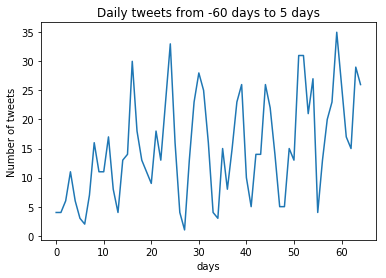





account_name: Altisource event_date: 2014-07-29
start_date: 2014-05-30 end_date: 2014-08-03
Sum of tweets: 4
account_name: AmedicaCorp event_date: 2017-12-11
start_date: 2017-10-12 end_date: 2017-12-16
Sum of tweets: 10
account_name: AmedicaCorp event_date: 2017-04-19
start_date: 2017-02-18 end_date: 2017-04-24
Sum of tweets: 13
account_name: Ameresco event_date: 2017-03-02
start_date: 2017-01-01 end_date: 2017-03-07
Sum of tweets: 55
account_name: Ameresco event_date: 2014-03-17
start_date: 2014-01-16 end_date: 2014-03-22
Sum of tweets: 13
account_name: Ameresco event_date: 2013-02-28
start_date: 2012-12-30 end_date: 2013-03-05
Sum of tweets: 24
account_name: AmericanAxle event_date: 2015-02-23
start_date: 2014-12-25 end_date: 2015-02-28
Sum of tweets: 1
account_name: AmericanEquity event_date: 2014-03-03
start_date: 2014-01-02 end_date: 2014-03-08
Sum of tweets: 1
account_name: AmericanEquity event_date: 2013-03-07
start_date: 2013-01-06 end_date: 2013-03-12
Sum of tweets: 2
acco

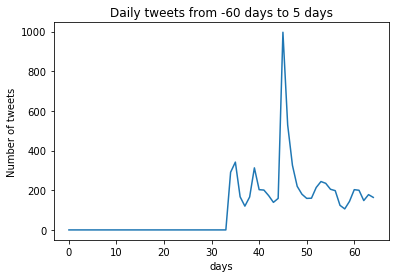





account_name: AmericanExpress event_date: 2015-02-24
start_date: 2014-12-26 end_date: 2015-03-01
Sum of tweets: 24802


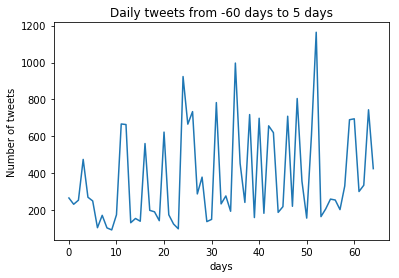





account_name: AmericanExpress event_date: 2015-04-29
start_date: 2015-02-28 end_date: 2015-05-04
Sum of tweets: 30456


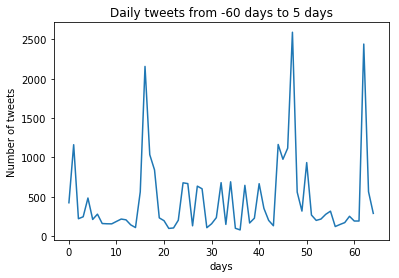





account_name: AmericanExpress event_date: 2013-02-22
start_date: 2012-12-24 end_date: 2013-02-27
Sum of tweets: 11721


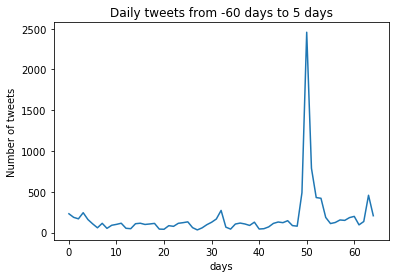





account_name: AIGinsurance event_date: 2014-11-03
start_date: 2014-09-04 end_date: 2014-11-08
Sum of tweets: 1150


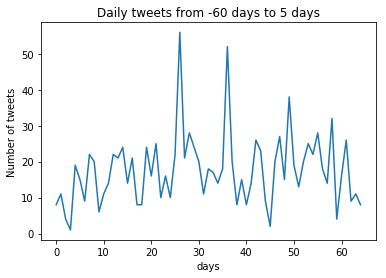





account_name: AMIDCareers event_date: 2016-03-07
start_date: 2016-01-07 end_date: 2016-03-12
Sum of tweets: 1
account_name: AMIDCareers event_date: 2014-05-12
start_date: 2014-03-13 end_date: 2014-05-17
Sum of tweets: 0
account_name: AmeriGas event_date: 2014-11-26
start_date: 2014-09-27 end_date: 2014-12-01
Sum of tweets: 143


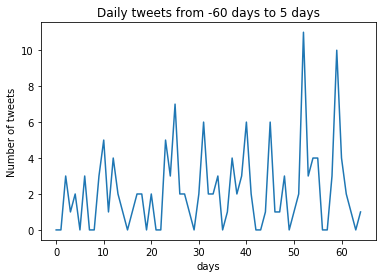





account_name: ameriprise event_date: 2017-02-23
start_date: 2016-12-25 end_date: 2017-02-28
Sum of tweets: 176


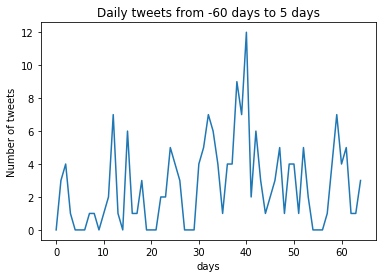





account_name: Healthcare_ABC event_date: 2016-11-22
start_date: 2016-09-23 end_date: 2016-11-27
Sum of tweets: 242


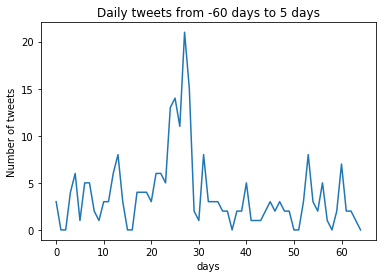





account_name: AmkorTechnology event_date: 2016-08-01
start_date: 2016-06-02 end_date: 2016-08-06
Sum of tweets: 76
account_name: AmpioPharmaInc event_date: 2014-08-08
start_date: 2014-06-09 end_date: 2014-08-13
Sum of tweets: 0
account_name: AmpliPhiBio event_date: 2016-03-29
start_date: 2016-01-29 end_date: 2016-04-03
Sum of tweets: 7
account_name: AmpliPhiBio event_date: 2015-03-09
start_date: 2015-01-08 end_date: 2015-03-14
Sum of tweets: 17
account_name: AmpliPhiBio event_date: 2014-08-15
start_date: 2014-06-16 end_date: 2014-08-20
Sum of tweets: 11
account_name: AmpliPhiBio event_date: 2014-03-31
start_date: 2014-01-30 end_date: 2014-04-05
Sum of tweets: 3
account_name: AmpliPhiBio event_date: 2014-02-04
start_date: 2013-12-06 end_date: 2014-02-09
Sum of tweets: 0
account_name: AmTrustInsured event_date: 2017-02-27
start_date: 2016-12-29 end_date: 2017-03-04
Sum of tweets: 102


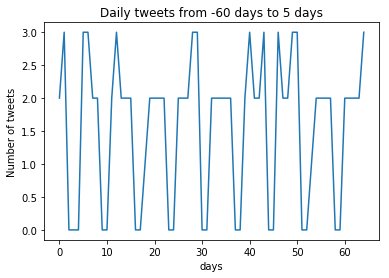





account_name: AmTrustInsured event_date: 2016-05-10
start_date: 2016-03-11 end_date: 2016-05-15
Sum of tweets: 98
account_name: AmTrustInsured event_date: 2014-03-03
start_date: 2014-01-02 end_date: 2014-03-08
Sum of tweets: 24
account_name: AnarenInc event_date: 2013-10-29
start_date: 2013-08-30 end_date: 2013-11-03
Sum of tweets: 45
account_name: AnavexLifeSci event_date: 2015-12-29
start_date: 2015-10-30 end_date: 2016-01-03
Sum of tweets: 11
account_name: angiodynamics event_date: 2016-08-01
start_date: 2016-06-02 end_date: 2016-08-06
Sum of tweets: 4
account_name: angiodynamics event_date: 2014-10-09
start_date: 2014-08-10 end_date: 2014-10-14
Sum of tweets: 10
account_name: angiodynamics event_date: 2014-08-14
start_date: 2014-06-15 end_date: 2014-08-19
Sum of tweets: 7
account_name: AnnTaylor event_date: 2014-03-14
start_date: 2014-01-13 end_date: 2014-03-19
Sum of tweets: 2154


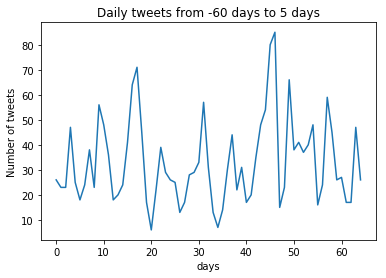





account_name: AnnTaylor event_date: 2013-03-08
start_date: 2013-01-07 end_date: 2013-03-13
Sum of tweets: 2685


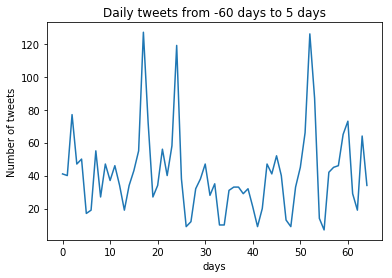





account_name: Aon_plc event_date: 2017-02-10
start_date: 2016-12-12 end_date: 2017-02-15
Sum of tweets: 724


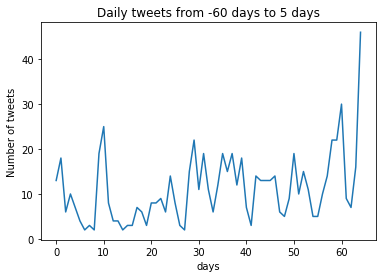





account_name: ApacheCorp event_date: 2017-02-24
start_date: 2016-12-26 end_date: 2017-03-01
Sum of tweets: 71
account_name: ApellisPharma event_date: 2017-12-20
start_date: 2017-10-21 end_date: 2017-12-25
Sum of tweets: 48
account_name: apitechnologies event_date: 2015-02-10
start_date: 2014-12-12 end_date: 2015-02-15
Sum of tweets: 82
account_name: apitechnologies event_date: 2014-02-12
start_date: 2013-12-14 end_date: 2014-02-17
Sum of tweets: 105


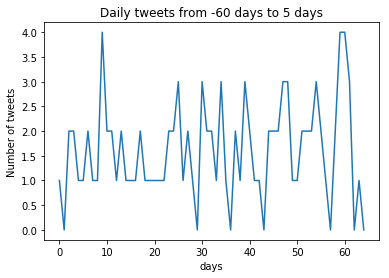





account_name: AGTC_ event_date: 2017-11-07
start_date: 2017-09-08 end_date: 2017-11-12
Sum of tweets: 76
account_name: aptar event_date: 2017-08-02
start_date: 2017-06-03 end_date: 2017-08-07
Sum of tweets: 23
account_name: aptar event_date: 2017-02-27
start_date: 2016-12-29 end_date: 2017-03-04
Sum of tweets: 21
account_name: aptar event_date: 2015-11-05
start_date: 2015-09-06 end_date: 2015-11-10
Sum of tweets: 2
account_name: AratanaRx event_date: 2015-03-12
start_date: 2015-01-11 end_date: 2015-03-17
Sum of tweets: 7
account_name: arbor1 event_date: 2016-02-26
start_date: 2015-12-28 end_date: 2016-03-02
Sum of tweets: 6
account_name: ARCDocSolutions event_date: 2017-05-05
start_date: 2017-03-06 end_date: 2017-05-10
Sum of tweets: 20
account_name: AristaNetworks event_date: 2015-05-14
start_date: 2015-03-15 end_date: 2015-05-19
Sum of tweets: 375


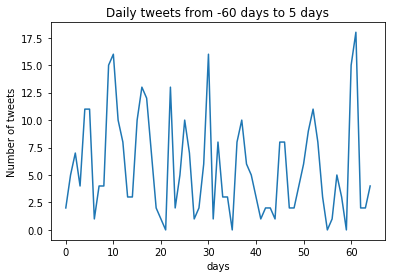





account_name: AristaNetworks event_date: 2014-03-31
start_date: 2014-01-30 end_date: 2014-04-05
Sum of tweets: 322


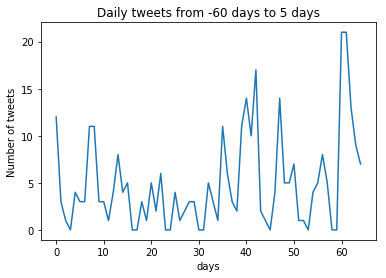





account_name: GallagherGlobal event_date: 2015-07-31
start_date: 2015-06-01 end_date: 2015-08-05
Sum of tweets: 32
account_name: AshlandInc event_date: 2016-11-21
start_date: 2016-09-22 end_date: 2016-11-26
Sum of tweets: 102


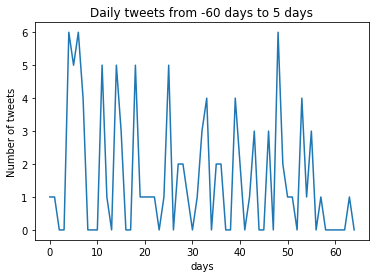





account_name: AssemblyBio event_date: 2015-03-16
start_date: 2015-01-15 end_date: 2015-03-21
Sum of tweets: 0
account_name: AsteaService event_date: 2015-05-15
start_date: 2015-03-16 end_date: 2015-05-20
Sum of tweets: 10
account_name: astecindustries event_date: 2016-02-29
start_date: 2015-12-31 end_date: 2016-03-05
Sum of tweets: 5
account_name: astecindustries event_date: 2013-10-22
start_date: 2013-08-23 end_date: 2013-10-27
Sum of tweets: 5
account_name: AtlasFin event_date: 2017-08-07
start_date: 2017-06-08 end_date: 2017-08-12
Sum of tweets: 9
account_name: AtlasFin event_date: 2014-11-10
start_date: 2014-09-11 end_date: 2014-11-15
Sum of tweets: 1
account_name: atmosenergy event_date: 2016-11-14
start_date: 2016-09-15 end_date: 2016-11-19
Sum of tweets: 186


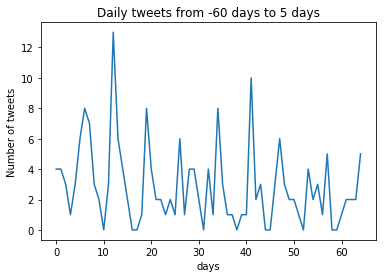





account_name: AtossaGenetics event_date: 2017-03-21
start_date: 2017-01-20 end_date: 2017-03-26
Sum of tweets: 0
account_name: autodesk event_date: 2015-11-19
start_date: 2015-09-20 end_date: 2015-11-24
Sum of tweets: 7928


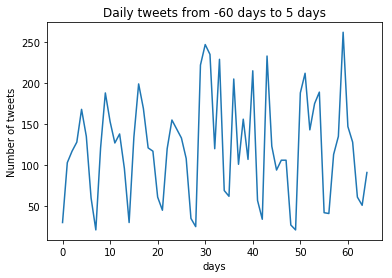





account_name: AVANGRID event_date: 2016-04-01
start_date: 2016-02-01 end_date: 2016-04-06
Sum of tweets: 34
account_name: AVEOoncology event_date: 2013-03-11
start_date: 2013-01-10 end_date: 2013-03-16
Sum of tweets: 9
account_name: AveryDennison event_date: 2016-11-01
start_date: 2016-09-02 end_date: 2016-11-06
Sum of tweets: 538


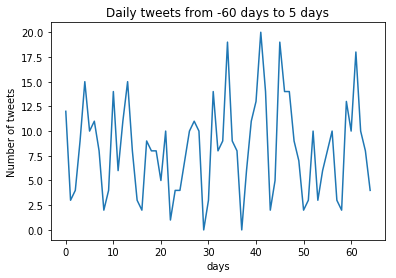





account_name: AveryDennison event_date: 2015-11-03
start_date: 2015-09-04 end_date: 2015-11-08
Sum of tweets: 524


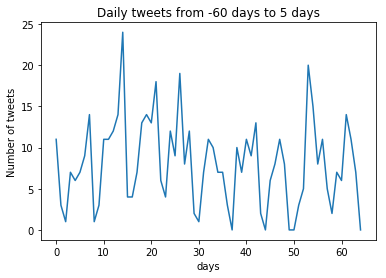





account_name: AveryDennison event_date: 2014-07-31
start_date: 2014-06-01 end_date: 2014-08-05
Sum of tweets: 455


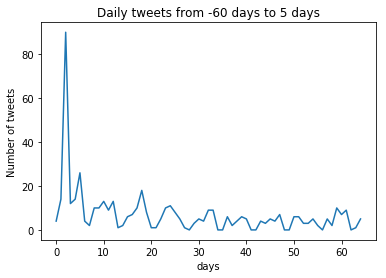





account_name: AviatNetworks event_date: 2016-02-10
start_date: 2015-12-12 end_date: 2016-02-15
Sum of tweets: 113


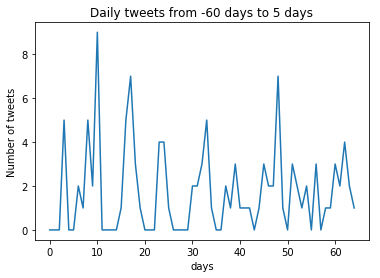





account_name: AviatNetworks event_date: 2015-10-01
start_date: 2015-08-02 end_date: 2015-10-06
Sum of tweets: 80
account_name: AviatNetworks event_date: 2015-05-13
start_date: 2015-03-14 end_date: 2015-05-18
Sum of tweets: 101


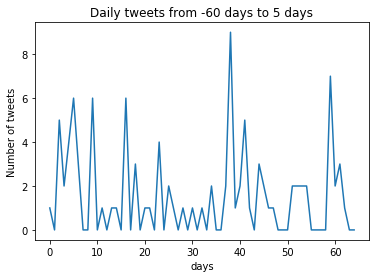





account_name: Avid event_date: 2013-03-19
start_date: 2013-01-18 end_date: 2013-03-24
Sum of tweets: 1922


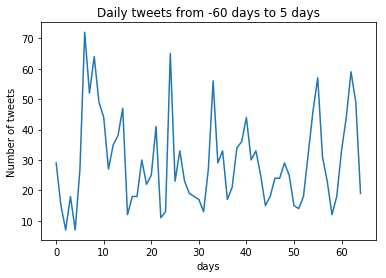





account_name: AvistaUtilities event_date: 2013-02-26
start_date: 2012-12-28 end_date: 2013-03-03
Sum of tweets: 100


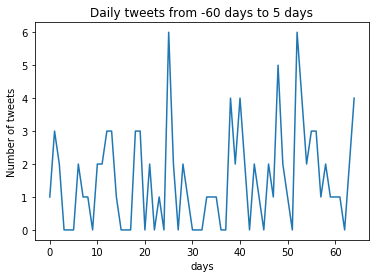





account_name: avivaplc event_date: 2013-03-25
start_date: 2013-01-24 end_date: 2013-03-30
Sum of tweets: 406


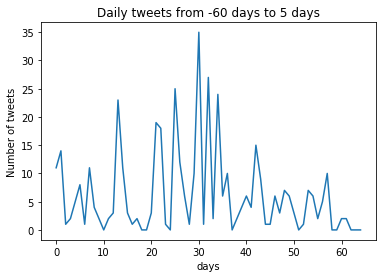





account_name: AvonInsider event_date: 2017-05-04
start_date: 2017-03-05 end_date: 2017-05-09
Sum of tweets: 19285


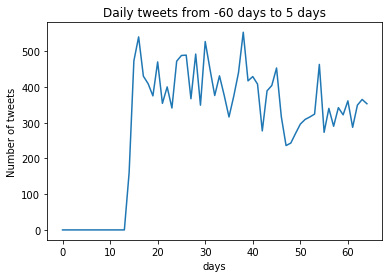





account_name: AvonInsider event_date: 2015-04-30
start_date: 2015-03-01 end_date: 2015-05-05
Sum of tweets: 19923


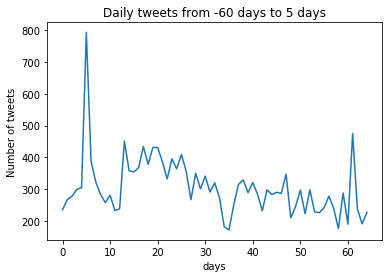





account_name: AvonInsider event_date: 2014-05-01
start_date: 2014-03-02 end_date: 2014-05-06
Sum of tweets: 4082


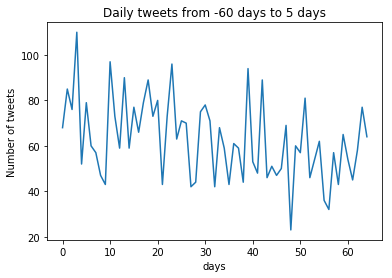





account_name: Axalta event_date: 2017-08-03
start_date: 2017-06-04 end_date: 2017-08-08
Sum of tweets: 1041


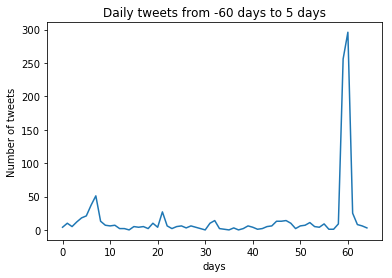





account_name: Axalta event_date: 2014-10-14
start_date: 2014-08-15 end_date: 2014-10-19
Sum of tweets: 84
account_name: AxcelisNews event_date: 2016-08-02
start_date: 2016-06-03 end_date: 2016-08-07
Sum of tweets: 10
account_name: WESTLAKECHEM event_date: 2014-05-08
start_date: 2014-03-09 end_date: 2014-05-13
Sum of tweets: 14
account_name: WESTLAKECHEM event_date: 2014-02-28
start_date: 2013-12-30 end_date: 2014-03-05
Sum of tweets: 23
account_name: axovant event_date: 2016-06-06
start_date: 2016-04-07 end_date: 2016-06-11
Sum of tweets: 16
account_name: azurrx event_date: 2016-06-16
start_date: 2016-04-17 end_date: 2016-06-21
Sum of tweets: 0
account_name: BallCorpHQ event_date: 2017-03-02
start_date: 2017-01-01 end_date: 2017-03-07
Sum of tweets: 123


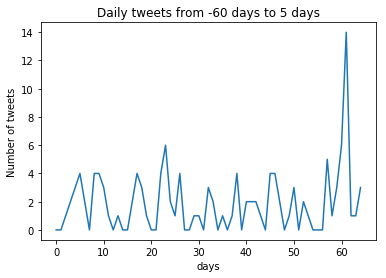





account_name: BallCorpHQ event_date: 2014-08-11
start_date: 2014-06-12 end_date: 2014-08-16
Sum of tweets: 166


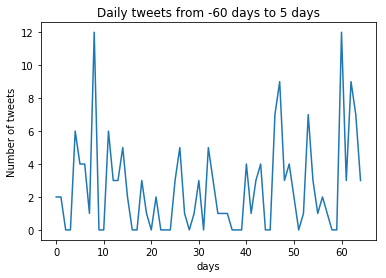





account_name: thebancorp event_date: 2015-03-16
start_date: 2015-01-15 end_date: 2015-03-21
Sum of tweets: 46
account_name: BankofAmerica event_date: 2015-10-30
start_date: 2015-08-31 end_date: 2015-11-04
Sum of tweets: 7436


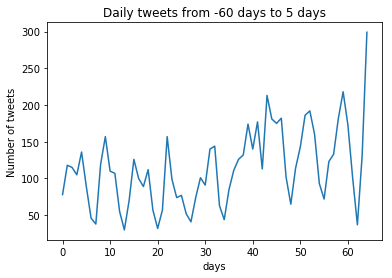





account_name: BankofHawaii event_date: 2017-02-27
start_date: 2016-12-29 end_date: 2017-03-04
Sum of tweets: 179


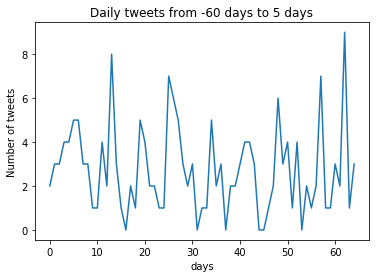





account_name: Bankrate event_date: 2015-08-07
start_date: 2015-06-08 end_date: 2015-08-12
Sum of tweets: 3196


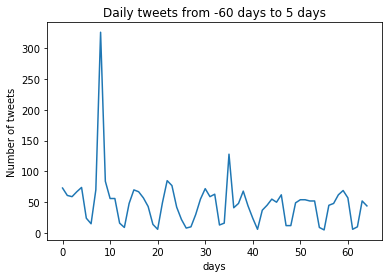





account_name: Bankrate event_date: 2014-09-15
start_date: 2014-07-17 end_date: 2014-09-20
Sum of tweets: 3698


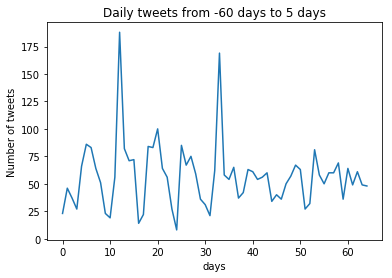





account_name: BNBuzz event_date: 2013-06-25
start_date: 2013-04-26 end_date: 2013-06-30
Sum of tweets: 8417


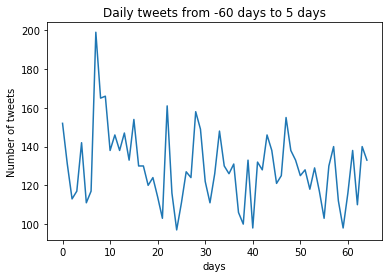





account_name: baxter_intl event_date: 2015-02-26
start_date: 2014-12-28 end_date: 2015-03-03
Sum of tweets: 204


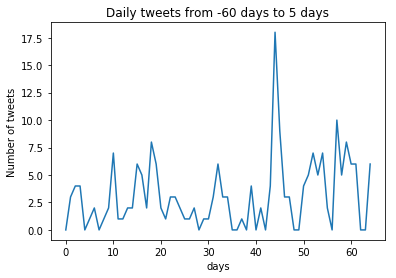





account_name: Bazaarvoice event_date: 2015-06-25
start_date: 2015-04-26 end_date: 2015-06-30
Sum of tweets: 852


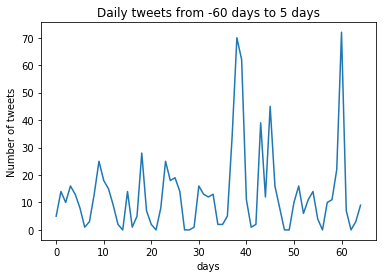





account_name: BBT event_date: 2017-10-27
start_date: 2017-08-28 end_date: 2017-11-01
Sum of tweets: 206


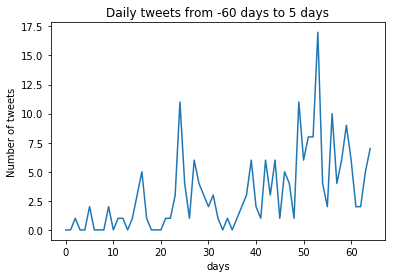





account_name: beamsuntory event_date: 2013-08-08
start_date: 2013-06-09 end_date: 2013-08-13
Sum of tweets: 64
account_name: BDandCo event_date: 2017-02-02
start_date: 2016-12-04 end_date: 2017-02-07
Sum of tweets: 196


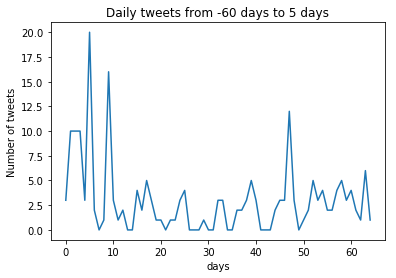





account_name: belmond event_date: 2017-05-09
start_date: 2017-03-10 end_date: 2017-05-14
Sum of tweets: 644


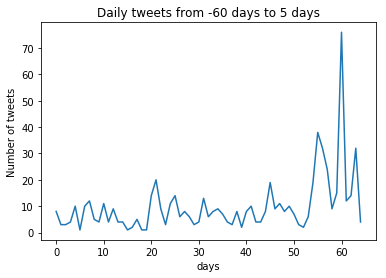





account_name: belmond event_date: 2013-02-26
start_date: 2012-12-28 end_date: 2013-03-03
Sum of tweets: 79
account_name: BenchElec event_date: 2015-10-22
start_date: 2015-08-23 end_date: 2015-10-27
Sum of tweets: 7
account_name: Benefitfocus event_date: 2014-03-06
start_date: 2014-01-05 end_date: 2014-03-11
Sum of tweets: 649


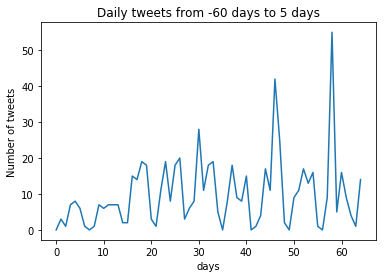





account_name: BerkshireBank event_date: 2013-03-18
start_date: 2013-01-17 end_date: 2013-03-23
Sum of tweets: 81
account_name: BioAmber event_date: 2015-11-09
start_date: 2015-09-10 end_date: 2015-11-14
Sum of tweets: 40
account_name: BioAmber event_date: 2014-03-28
start_date: 2014-01-27 end_date: 2014-04-02
Sum of tweets: 35
account_name: BASi_news event_date: 2013-08-14
start_date: 2013-06-15 end_date: 2013-08-19
Sum of tweets: 31
account_name: BioRadLifeSci event_date: 2014-05-08
start_date: 2014-03-09 end_date: 2014-05-13
Sum of tweets: 379


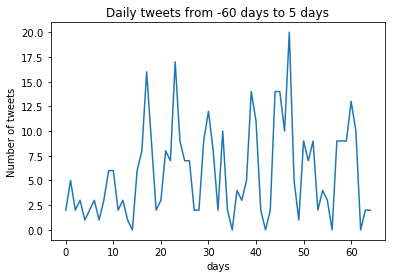





account_name: BioRadLifeSci event_date: 2014-11-07
start_date: 2014-09-08 end_date: 2014-11-12
Sum of tweets: 413


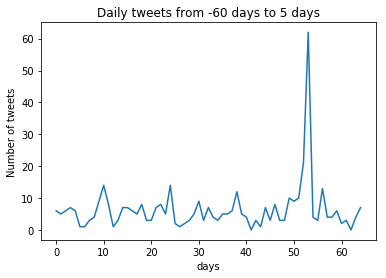





account_name: BioRadLifeSci event_date: 2013-11-12
start_date: 2013-09-13 end_date: 2013-11-17
Sum of tweets: 225


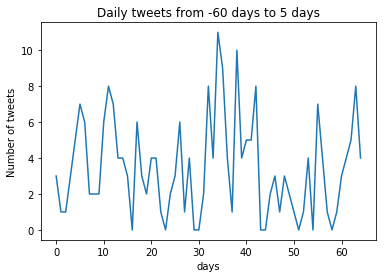





account_name: BioRadLifeSci event_date: 2013-05-10
start_date: 2013-03-11 end_date: 2013-05-15
Sum of tweets: 349


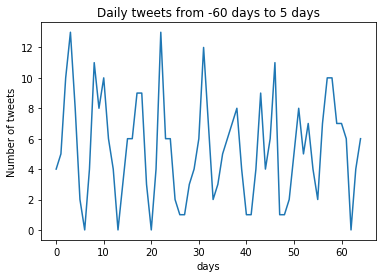





account_name: blackhillscorp event_date: 2017-05-05
start_date: 2017-03-06 end_date: 2017-05-10
Sum of tweets: 28
account_name: blackhillscorp event_date: 2015-08-04
start_date: 2015-06-05 end_date: 2015-08-09
Sum of tweets: 65
account_name: Blackhawk event_date: 2014-03-17
start_date: 2014-01-16 end_date: 2014-03-22
Sum of tweets: 24
account_name: blackrock event_date: 2017-03-06
start_date: 2017-01-05 end_date: 2017-03-11
Sum of tweets: 2556


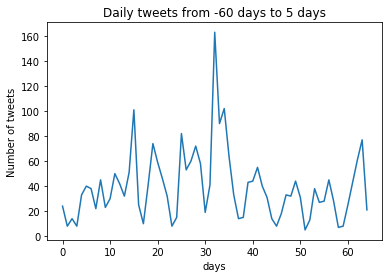





account_name: blackrock event_date: 2016-09-02
start_date: 2016-07-04 end_date: 2016-09-07
Sum of tweets: 2002


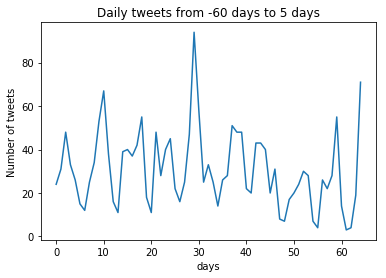





account_name: blackrock event_date: 2017-03-06
start_date: 2017-01-05 end_date: 2017-03-11
Sum of tweets: 2556


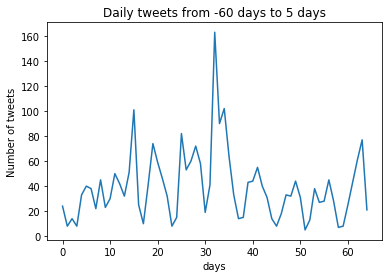





account_name: blackrock event_date: 2016-09-02
start_date: 2016-07-04 end_date: 2016-09-07
Sum of tweets: 2002


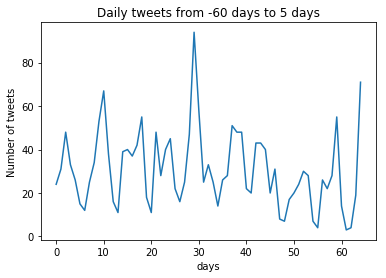





account_name: blackrock event_date: 2017-03-06
start_date: 2017-01-05 end_date: 2017-03-11
Sum of tweets: 2556


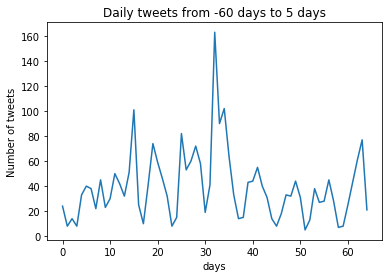





account_name: blackrock event_date: 2016-09-02
start_date: 2016-07-04 end_date: 2016-09-07
Sum of tweets: 2002


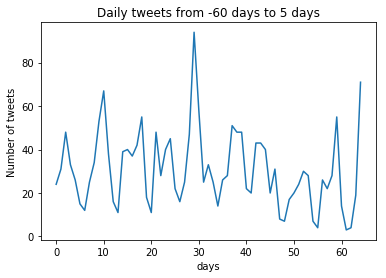





account_name: blackrock event_date: 2017-03-06
start_date: 2017-01-05 end_date: 2017-03-11
Sum of tweets: 2556


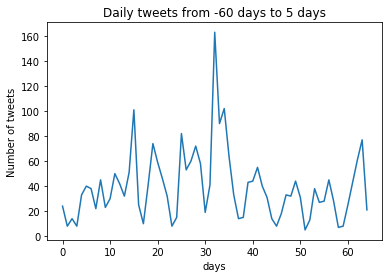





account_name: blackrock event_date: 2016-09-02
start_date: 2016-07-04 end_date: 2016-09-07
Sum of tweets: 2002


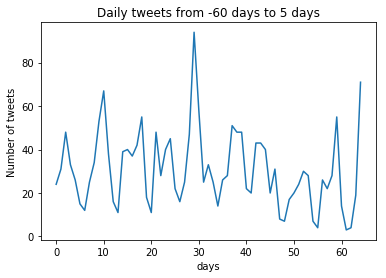





account_name: blackrock event_date: 2017-03-06
start_date: 2017-01-05 end_date: 2017-03-11
Sum of tweets: 2556


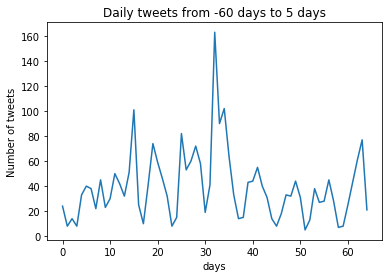





account_name: blackrock event_date: 2016-09-02
start_date: 2016-07-04 end_date: 2016-09-07
Sum of tweets: 2002


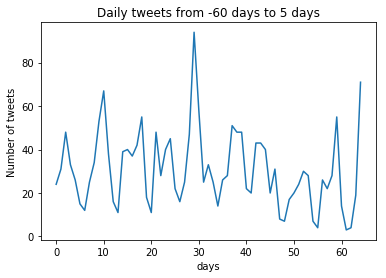





account_name: blackrock event_date: 2016-04-01
start_date: 2016-02-01 end_date: 2016-04-06
Sum of tweets: 2634


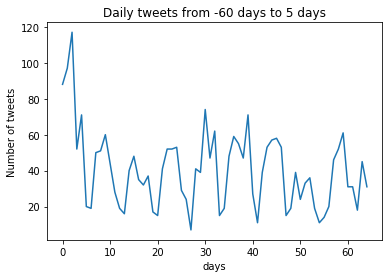





account_name: blackrock event_date: 2017-03-06
start_date: 2017-01-05 end_date: 2017-03-11
Sum of tweets: 2556


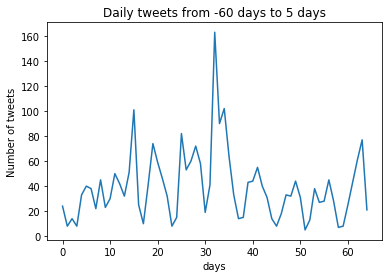





account_name: blackrock event_date: 2016-09-02
start_date: 2016-07-04 end_date: 2016-09-07
Sum of tweets: 2002


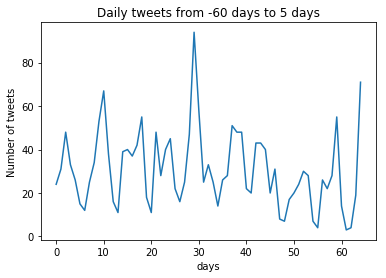





account_name: blackrock event_date: 2017-03-06
start_date: 2017-01-05 end_date: 2017-03-11
Sum of tweets: 2556


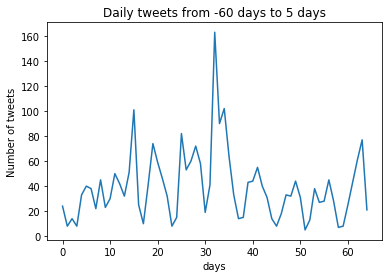





account_name: blackrock event_date: 2016-09-02
start_date: 2016-07-04 end_date: 2016-09-07
Sum of tweets: 2002


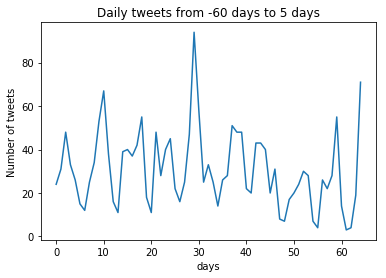





account_name: HRBlock event_date: 2015-06-17
start_date: 2015-04-18 end_date: 2015-06-22
Sum of tweets: 4669


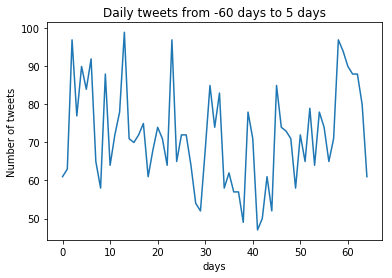





account_name: HRBlock event_date: 2014-06-19
start_date: 2014-04-20 end_date: 2014-06-24
Sum of tweets: 2938


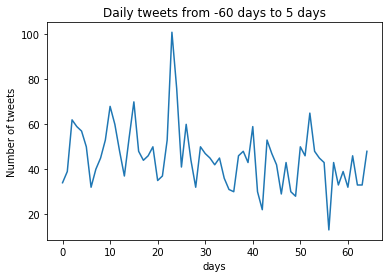





account_name: Blucora event_date: 2016-10-27
start_date: 2016-08-28 end_date: 2016-11-01
Sum of tweets: 3
account_name: BlueBirdBuses event_date: 2016-05-23
start_date: 2016-03-24 end_date: 2016-05-28
Sum of tweets: 57
account_name: BlueBirdBuses event_date: 2015-12-15
start_date: 2015-10-16 end_date: 2015-12-20
Sum of tweets: 49
account_name: BobEvansFarms event_date: 2015-06-19
start_date: 2015-04-20 end_date: 2015-06-24
Sum of tweets: 724


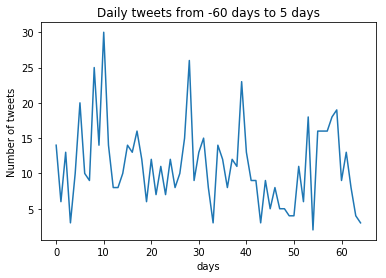





account_name: BobEvansFarms event_date: 2015-12-02
start_date: 2015-10-03 end_date: 2015-12-07
Sum of tweets: 1071


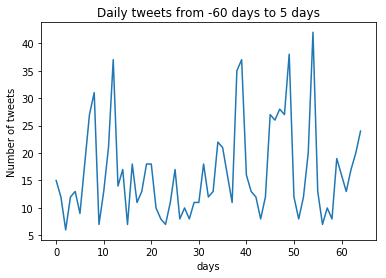





account_name: BobEvansFarms event_date: 2014-12-03
start_date: 2014-10-04 end_date: 2014-12-08
Sum of tweets: 825


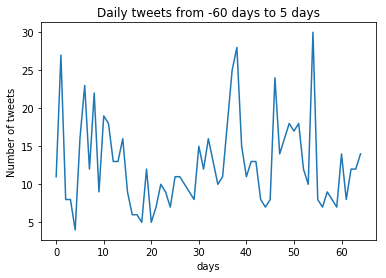





account_name: BobEvansFarms event_date: 2013-06-21
start_date: 2013-04-22 end_date: 2013-06-26
Sum of tweets: 544


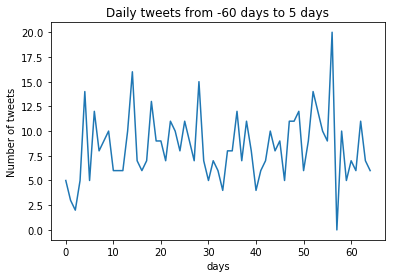





account_name: BobEvansFarms event_date: 2013-05-01
start_date: 2013-03-02 end_date: 2013-05-06
Sum of tweets: 552


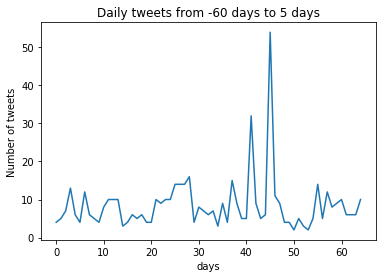





account_name: BobEvansFarms event_date: 2013-12-05
start_date: 2013-10-06 end_date: 2013-12-10
Sum of tweets: 820


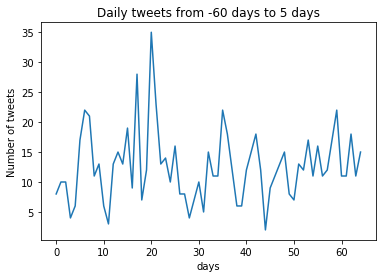





account_name: boingo event_date: 2014-03-17
start_date: 2014-01-16 end_date: 2014-03-22
Sum of tweets: 1009


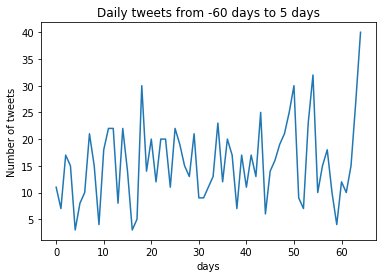





account_name: BOKFinancial event_date: 2017-02-28
start_date: 2016-12-30 end_date: 2017-03-05
Sum of tweets: 44
account_name: bootbarn event_date: 2015-05-29
start_date: 2015-03-30 end_date: 2015-06-03
Sum of tweets: 878


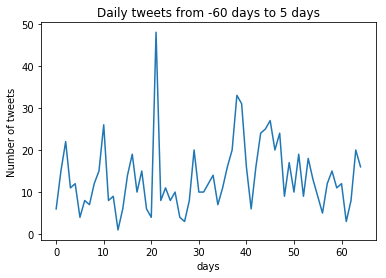





account_name: ShopBorderfree event_date: 2014-05-09
start_date: 2014-03-10 end_date: 2014-05-14
Sum of tweets: 19
account_name: BovieMed event_date: 2014-05-08
start_date: 2014-03-09 end_date: 2014-05-13
Sum of tweets: 89
account_name: BovieMed event_date: 2013-09-25
start_date: 2013-07-27 end_date: 2013-09-30
Sum of tweets: 91
account_name: boydgaming event_date: 2014-05-09
start_date: 2014-03-10 end_date: 2014-05-14
Sum of tweets: 83
account_name: boydgaming event_date: 2013-05-10
start_date: 2013-03-11 end_date: 2013-05-15
Sum of tweets: 99
account_name: Bridgepoint_Ed event_date: 2014-05-12
start_date: 2014-03-13 end_date: 2014-05-17
Sum of tweets: 8
account_name: Bridgepoint_Ed event_date: 2013-05-10
start_date: 2013-03-11 end_date: 2013-05-15
Sum of tweets: 20
account_name: Brinks event_date: 2016-07-28
start_date: 2016-05-29 end_date: 2016-08-02
Sum of tweets: 76
account_name: BroadSoftNews event_date: 2014-02-28
start_date: 2013-12-30 end_date: 2014-03-05
Sum of tweets: 195

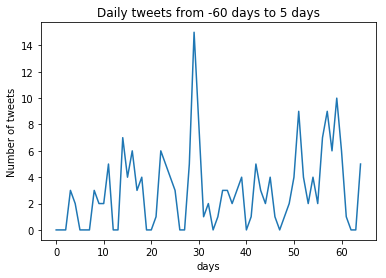





account_name: Broadwind event_date: 2014-02-06
start_date: 2013-12-08 end_date: 2014-02-11
Sum of tweets: 19
account_name: BrooksGlobal event_date: 2016-07-28
start_date: 2016-05-29 end_date: 2016-08-02
Sum of tweets: 4
account_name: buildabear event_date: 2016-11-10
start_date: 2016-09-11 end_date: 2016-11-15
Sum of tweets: 5598


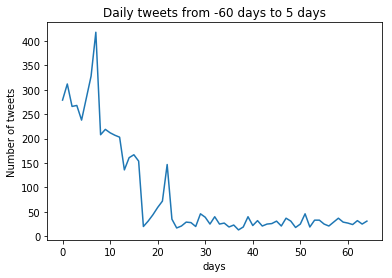





account_name: Burlington event_date: 2015-06-09
start_date: 2015-04-10 end_date: 2015-06-14
Sum of tweets: 1324


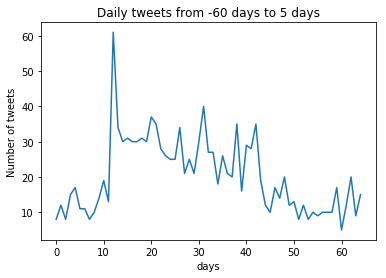





account_name: CabotMicroCorp event_date: 2014-07-24
start_date: 2014-05-25 end_date: 2014-07-29
Sum of tweets: 32
account_name: Cadiz_Inc event_date: 2013-08-08
start_date: 2013-06-09 end_date: 2013-08-13
Sum of tweets: 0
account_name: CaesarsEnt event_date: 2014-03-17
start_date: 2014-01-16 end_date: 2014-03-22
Sum of tweets: 195


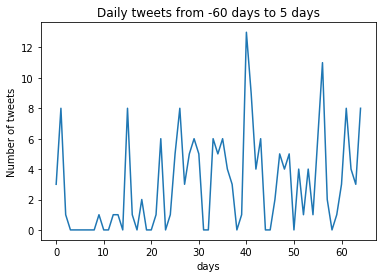





account_name: cafepress event_date: 2017-05-02
start_date: 2017-03-03 end_date: 2017-05-07
Sum of tweets: 3
account_name: cafepress event_date: 2017-03-07
start_date: 2017-01-06 end_date: 2017-03-12
Sum of tweets: 12
account_name: cafepress event_date: 2015-03-31
start_date: 2015-01-30 end_date: 2015-04-05
Sum of tweets: 2479


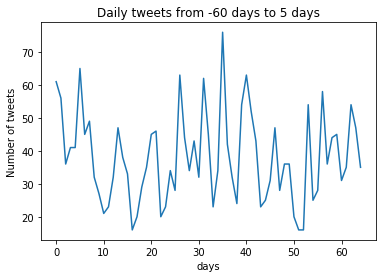





account_name: caimoves event_date: 2017-03-13
start_date: 2017-01-12 end_date: 2017-03-18
Sum of tweets: 41
account_name: calavo event_date: 2015-12-30
start_date: 2015-10-31 end_date: 2016-01-04
Sum of tweets: 7
account_name: calavo event_date: 2015-01-15
start_date: 2014-11-16 end_date: 2015-01-20
Sum of tweets: 16
account_name: calavo event_date: 2014-09-15
start_date: 2014-07-17 end_date: 2014-09-20
Sum of tweets: 10
account_name: CallidusCloud event_date: 2013-11-07
start_date: 2013-09-08 end_date: 2013-11-12
Sum of tweets: 588


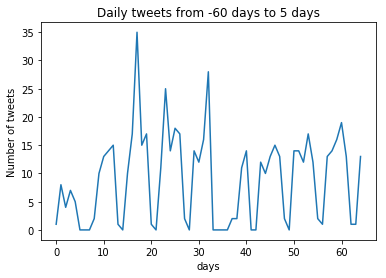





account_name: CardConnect event_date: 2015-03-30
start_date: 2015-01-29 end_date: 2015-04-04
Sum of tweets: 71
account_name: CareDotCom event_date: 2017-03-09
start_date: 2017-01-08 end_date: 2017-03-14
Sum of tweets: 1178


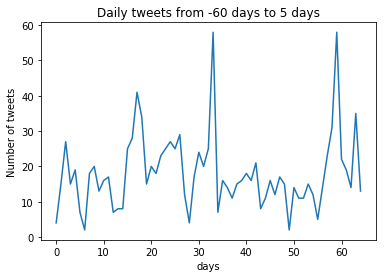





account_name: CareDotCom event_date: 2015-10-29
start_date: 2015-08-30 end_date: 2015-11-03
Sum of tweets: 1434


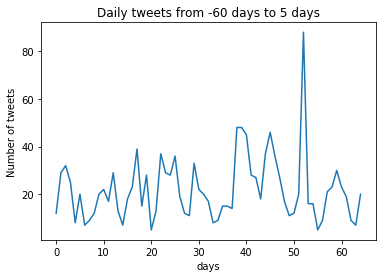





account_name: CarnivalPLC event_date: 2015-03-27
start_date: 2015-01-26 end_date: 2015-04-01
Sum of tweets: 1940


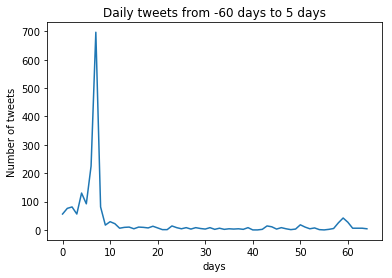





account_name: CarpenterTech event_date: 2015-05-07
start_date: 2015-03-08 end_date: 2015-05-12
Sum of tweets: 23
account_name: CarpenterTech event_date: 2014-05-02
start_date: 2014-03-03 end_date: 2014-05-07
Sum of tweets: 56
account_name: Carters event_date: 2014-10-23
start_date: 2014-08-24 end_date: 2014-10-28
Sum of tweets: 1606


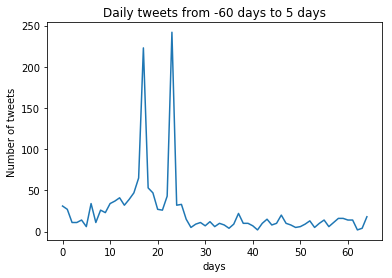





account_name: CarverBankNYC event_date: 2017-07-20
start_date: 2017-05-21 end_date: 2017-07-25
Sum of tweets: 35
account_name: CarverBankNYC event_date: 2017-02-17
start_date: 2016-12-19 end_date: 2017-02-22
Sum of tweets: 65
account_name: CarverBankNYC event_date: 2016-06-30
start_date: 2016-05-01 end_date: 2016-07-05
Sum of tweets: 15
account_name: caseysgenstore event_date: 2014-11-24
start_date: 2014-09-25 end_date: 2014-11-29
Sum of tweets: 1091


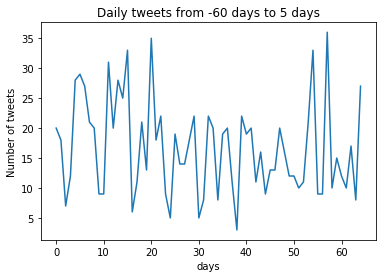





account_name: cashamerica event_date: 2015-03-13
start_date: 2015-01-12 end_date: 2015-03-18
Sum of tweets: 86
account_name: cashamerica event_date: 2014-05-02
start_date: 2014-03-03 end_date: 2014-05-07
Sum of tweets: 85
account_name: CatalentPharma event_date: 2014-09-08
start_date: 2014-07-10 end_date: 2014-09-13
Sum of tweets: 275


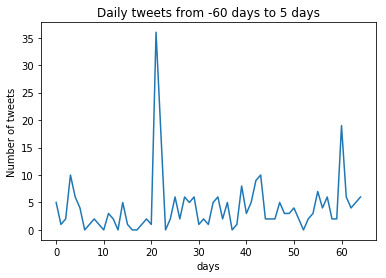





account_name: CaterpillarInc event_date: 2014-08-01
start_date: 2014-06-02 end_date: 2014-08-06
Sum of tweets: 2534


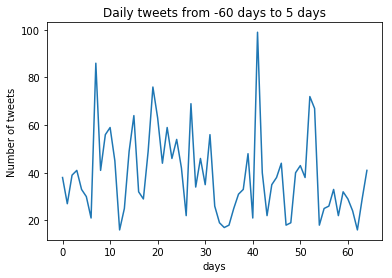





account_name: CaterpillarInc event_date: 2014-08-01
start_date: 2014-06-02 end_date: 2014-08-06
Sum of tweets: 2534


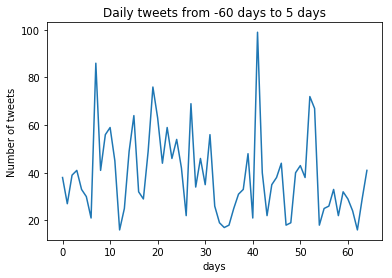





account_name: CaterpillarInc event_date: 2013-05-02
start_date: 2013-03-03 end_date: 2013-05-07
Sum of tweets: 1894


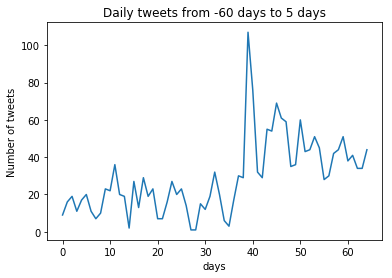





account_name: CatoFashions event_date: 2016-06-03
start_date: 2016-04-04 end_date: 2016-06-08
Sum of tweets: 1234


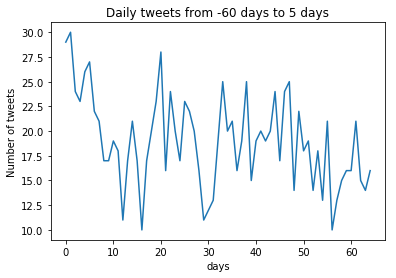





account_name: CatoFashions event_date: 2015-03-30
start_date: 2015-01-29 end_date: 2015-04-04
Sum of tweets: 339


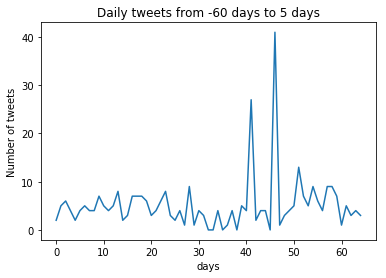





account_name: CDTi_Emissions event_date: 2017-08-14
start_date: 2017-06-15 end_date: 2017-08-19
Sum of tweets: 0
account_name: CelSciCorp event_date: 2017-11-22
start_date: 2017-09-23 end_date: 2017-11-27
Sum of tweets: 4
account_name: CelSciCorp event_date: 2017-08-15
start_date: 2017-06-16 end_date: 2017-08-20
Sum of tweets: 17
account_name: CelyadSA event_date: 2015-03-31
start_date: 2015-01-30 end_date: 2015-04-05
Sum of tweets: 12
account_name: Eletrobras event_date: 2016-10-11
start_date: 2016-08-12 end_date: 2016-10-16
Sum of tweets: 115


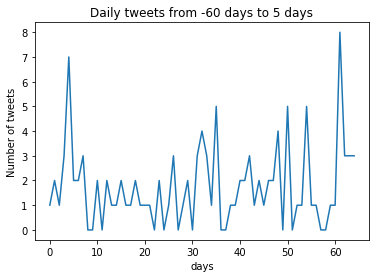





account_name: CenturyLink event_date: 2014-02-27
start_date: 2013-12-29 end_date: 2014-03-04
Sum of tweets: 2667


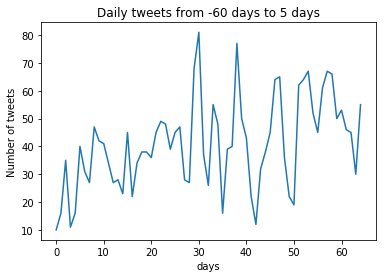





account_name: ChampsOnco event_date: 2016-07-29
start_date: 2016-05-30 end_date: 2016-08-03
Sum of tweets: 3
account_name: CheckpointSys event_date: 2015-11-03
start_date: 2015-09-04 end_date: 2015-11-08
Sum of tweets: 310


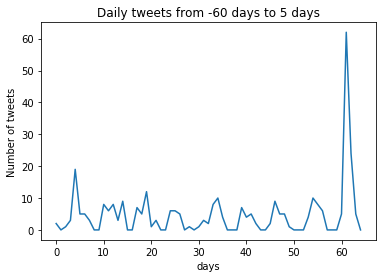





account_name: CheckpointSys event_date: 2014-03-18
start_date: 2014-01-17 end_date: 2014-03-23
Sum of tweets: 161


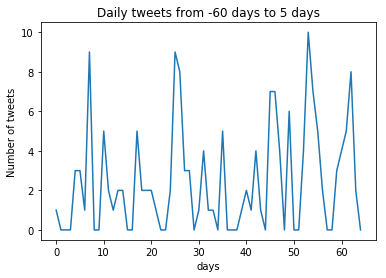





account_name: WhereChefsShop event_date: 2014-03-12
start_date: 2014-01-11 end_date: 2014-03-17
Sum of tweets: 0
account_name: chemours event_date: 2015-06-05
start_date: 2015-04-06 end_date: 2015-06-10
Sum of tweets: 1
account_name: Chesapeake event_date: 2017-03-03
start_date: 2017-01-02 end_date: 2017-03-08
Sum of tweets: 126


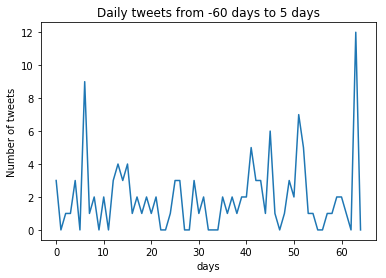





account_name: Chesapeake event_date: 2013-11-06
start_date: 2013-09-07 end_date: 2013-11-11
Sum of tweets: 487


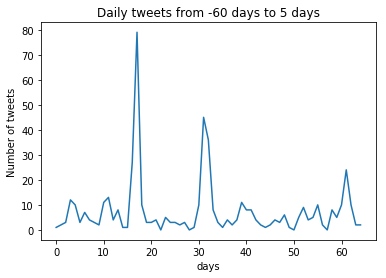





account_name: Chicos event_date: 2016-05-27
start_date: 2016-03-28 end_date: 2016-06-01
Sum of tweets: 1847


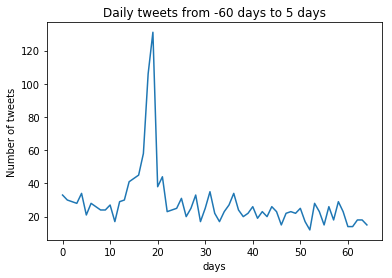





account_name: Chiquita event_date: 2013-03-18
start_date: 2013-01-17 end_date: 2013-03-23
Sum of tweets: 428


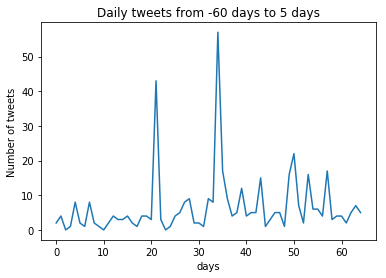





account_name: ChoiceHotels event_date: 2014-08-05
start_date: 2014-06-06 end_date: 2014-08-10
Sum of tweets: 6918


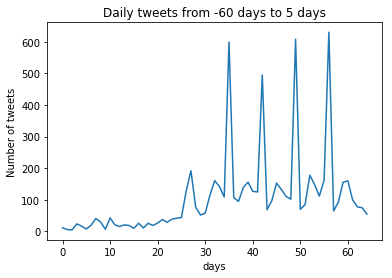





account_name: ChoiceHotels event_date: 2013-07-26
start_date: 2013-05-27 end_date: 2013-07-31
Sum of tweets: 1491


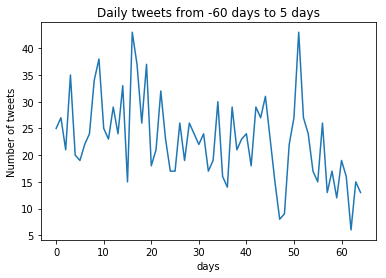





account_name: ChoiceHotels event_date: 2013-05-08
start_date: 2013-03-09 end_date: 2013-05-13
Sum of tweets: 967


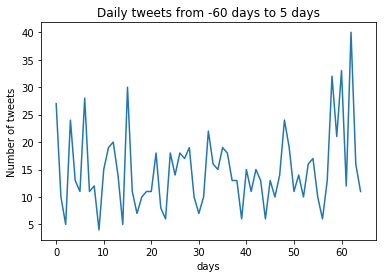





account_name: Chubb event_date: 2013-10-30
start_date: 2013-08-31 end_date: 2013-11-04
Sum of tweets: 42
account_name: Ciena event_date: 2015-12-21
start_date: 2015-10-22 end_date: 2015-12-26
Sum of tweets: 652


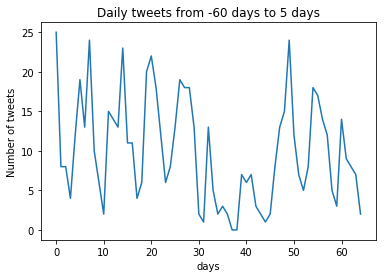





account_name: CIRCORint event_date: 2015-11-09
start_date: 2015-09-10 end_date: 2015-11-14
Sum of tweets: 3
account_name: CIRCORint event_date: 2015-07-29
start_date: 2015-05-30 end_date: 2015-08-03
Sum of tweets: 5
account_name: CITgroup event_date: 2017-03-16
start_date: 2017-01-15 end_date: 2017-03-21
Sum of tweets: 124


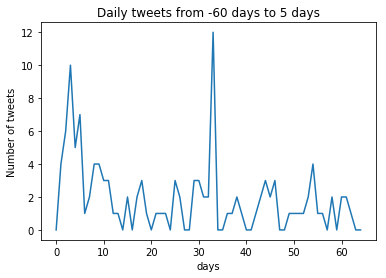





account_name: CITgroup event_date: 2016-08-09
start_date: 2016-06-10 end_date: 2016-08-14
Sum of tweets: 302


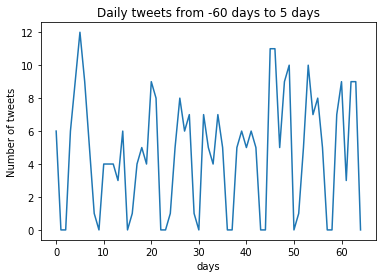





account_name: CITgroup event_date: 2015-05-07
start_date: 2015-03-08 end_date: 2015-05-12
Sum of tweets: 362


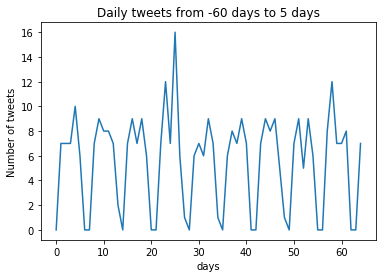





account_name: CITgroup event_date: 2015-11-13
start_date: 2015-09-14 end_date: 2015-11-18
Sum of tweets: 304


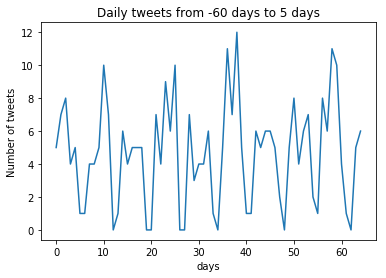





account_name: CITgroup event_date: 2015-02-20
start_date: 2014-12-22 end_date: 2015-02-25
Sum of tweets: 468


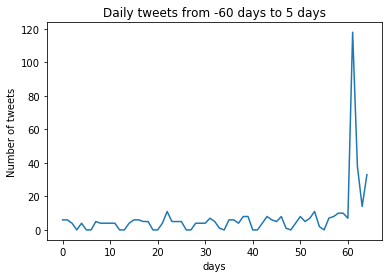





account_name: CITgroup event_date: 2014-05-09
start_date: 2014-03-10 end_date: 2014-05-14
Sum of tweets: 330


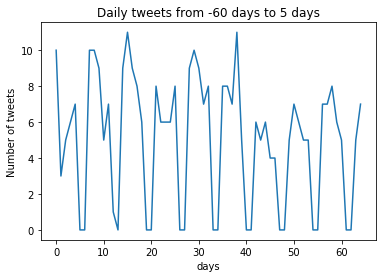





account_name: CITgroup event_date: 2013-03-01
start_date: 2012-12-31 end_date: 2013-03-06
Sum of tweets: 291


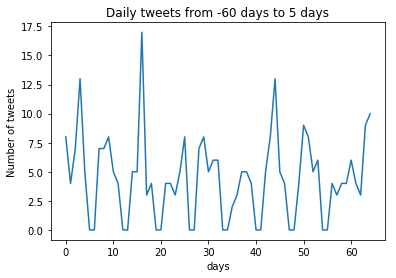





account_name: CITgroup event_date: 2013-11-06
start_date: 2013-09-07 end_date: 2013-11-11
Sum of tweets: 304


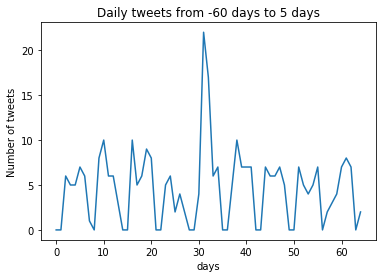





account_name: CityNational event_date: 2014-11-07
start_date: 2014-09-08 end_date: 2014-11-12
Sum of tweets: 167


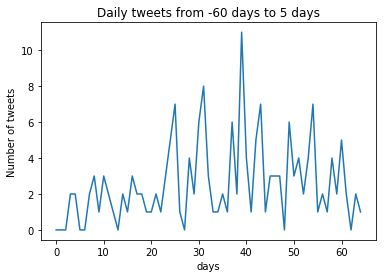





account_name: CleanHarbors event_date: 2015-03-02
start_date: 2015-01-01 end_date: 2015-03-07
Sum of tweets: 11
account_name: CNOFinancial event_date: 2013-02-01
start_date: 2012-12-03 end_date: 2013-02-06
Sum of tweets: 0
account_name: CokeCCBCC event_date: 2013-03-14
start_date: 2013-01-13 end_date: 2013-03-19
Sum of tweets: 130


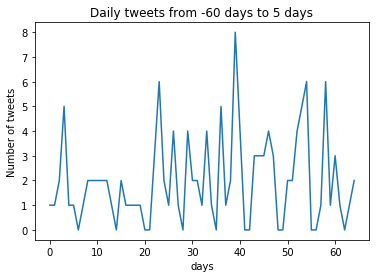





account_name: CoeurMining event_date: 2016-02-10
start_date: 2015-12-12 end_date: 2016-02-15
Sum of tweets: 90
account_name: ColumbiaCXP event_date: 2017-07-27
start_date: 2017-05-28 end_date: 2017-08-01
Sum of tweets: 22
account_name: copel_pr event_date: 2016-04-27
start_date: 2016-02-27 end_date: 2016-05-02
Sum of tweets: 574


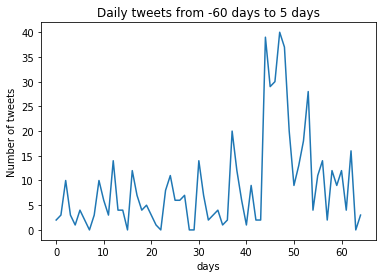





account_name: copel_pr event_date: 2014-09-29
start_date: 2014-07-31 end_date: 2014-10-04
Sum of tweets: 246


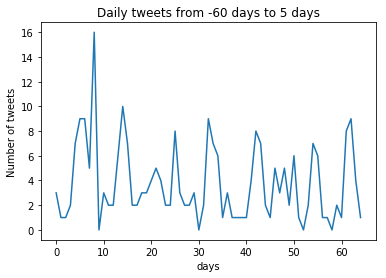





account_name: comScoreAPAC event_date: 2016-02-29
start_date: 2015-12-31 end_date: 2016-03-05
Sum of tweets: 81
account_name: comScoreAPAC event_date: 2013-02-20
start_date: 2012-12-22 end_date: 2013-02-25
Sum of tweets: 0
account_name: ConagraBrands event_date: 2014-12-29
start_date: 2014-10-30 end_date: 2015-01-03
Sum of tweets: 185


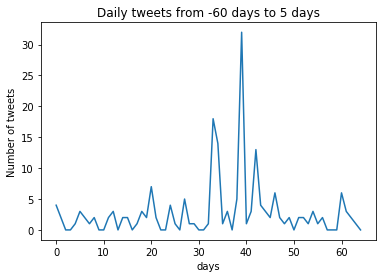





account_name: SAPConcur event_date: 2014-02-06
start_date: 2013-12-08 end_date: 2014-02-11
Sum of tweets: 713


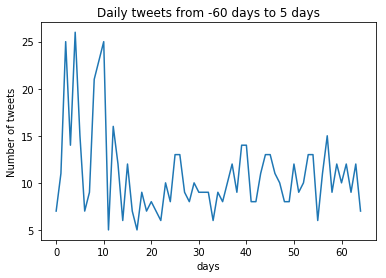





account_name: Conduent event_date: 2017-05-12
start_date: 2017-03-13 end_date: 2017-05-17
Sum of tweets: 530


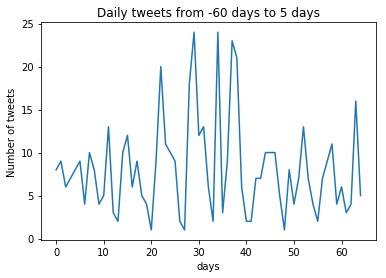





account_name: Conduent event_date: 2017-03-10
start_date: 2017-01-09 end_date: 2017-03-15
Sum of tweets: 504


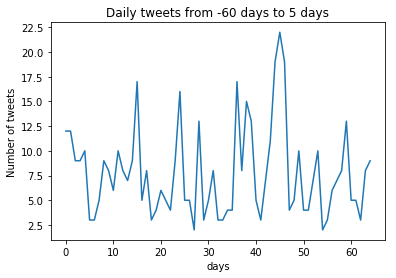





account_name: conformis event_date: 2016-08-11
start_date: 2016-06-12 end_date: 2016-08-16
Sum of tweets: 3
account_name: ConnectOneBank event_date: 2013-01-11
start_date: 2012-11-12 end_date: 2013-01-16
Sum of tweets: 87
account_name: ConnsInc event_date: 2015-04-01
start_date: 2015-01-31 end_date: 2015-04-06
Sum of tweets: 83
account_name: conocophillips event_date: 2016-05-03
start_date: 2016-03-04 end_date: 2016-05-08
Sum of tweets: 584


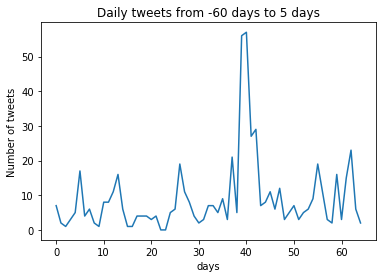





account_name: ConstantContact event_date: 2014-01-30
start_date: 2013-12-01 end_date: 2014-02-04
Sum of tweets: 5219


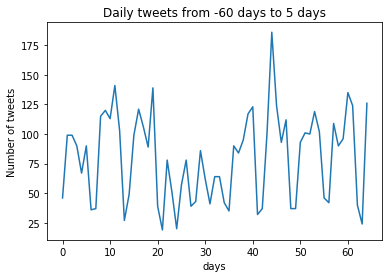





account_name: Control4 event_date: 2015-07-31
start_date: 2015-06-01 end_date: 2015-08-05
Sum of tweets: 912


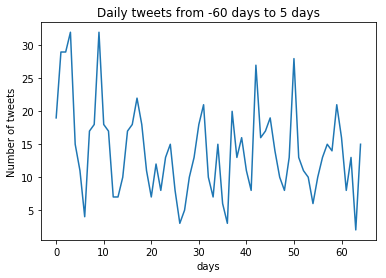





account_name: convergys event_date: 2014-11-05
start_date: 2014-09-06 end_date: 2014-11-10
Sum of tweets: 264


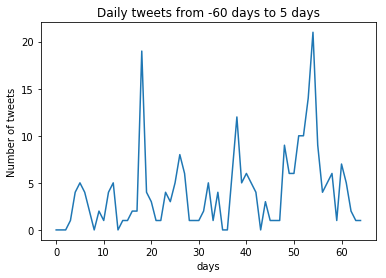





account_name: CoreMarkHQ event_date: 2016-11-07
start_date: 2016-09-08 end_date: 2016-11-12
Sum of tweets: 49
account_name: CoreLogicInc event_date: 2014-02-27
start_date: 2013-12-29 end_date: 2014-03-04
Sum of tweets: 190


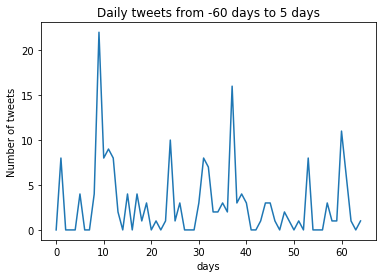





account_name: CoreLogicInc event_date: 2013-02-25
start_date: 2012-12-27 end_date: 2013-03-02
Sum of tweets: 281


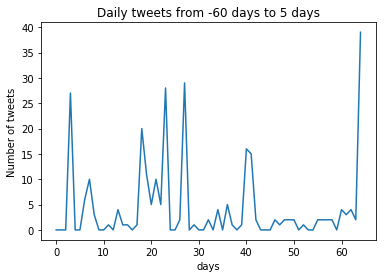





account_name: Corning event_date: 2016-02-12
start_date: 2015-12-14 end_date: 2016-02-17
Sum of tweets: 828


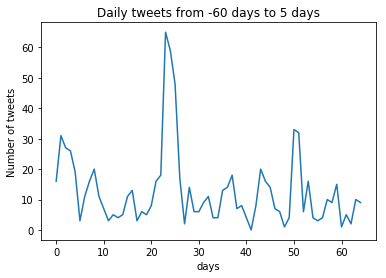





account_name: Corning event_date: 2015-02-13
start_date: 2014-12-15 end_date: 2015-02-18
Sum of tweets: 885


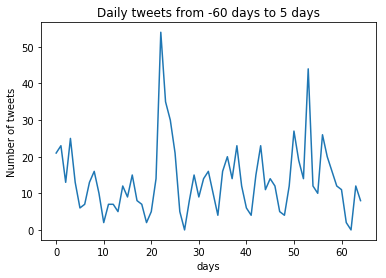





account_name: Corning event_date: 2013-02-13
start_date: 2012-12-15 end_date: 2013-02-18
Sum of tweets: 446


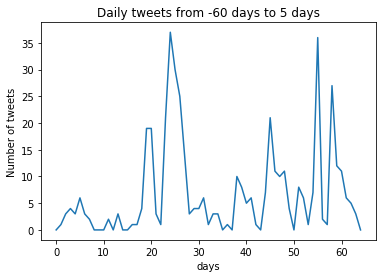





account_name: COPTOnline event_date: 2013-02-12
start_date: 2012-12-14 end_date: 2013-02-17
Sum of tweets: 0
account_name: CosanBrasil event_date: 2017-04-26
start_date: 2017-02-25 end_date: 2017-05-01
Sum of tweets: 11
account_name: CosanBrasil event_date: 2015-04-30
start_date: 2015-03-01 end_date: 2015-05-05
Sum of tweets: 53
account_name: CosanBrasil event_date: 2014-04-30
start_date: 2014-03-01 end_date: 2014-05-05
Sum of tweets: 24
account_name: get_cosi event_date: 2015-09-04
start_date: 2015-07-06 end_date: 2015-09-09
Sum of tweets: 511


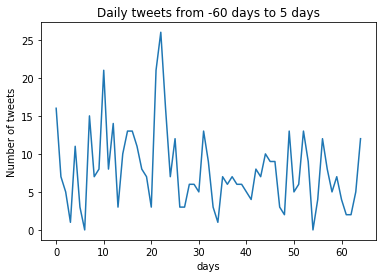





account_name: Covanta event_date: 2015-03-02
start_date: 2015-01-01 end_date: 2015-03-07
Sum of tweets: 193


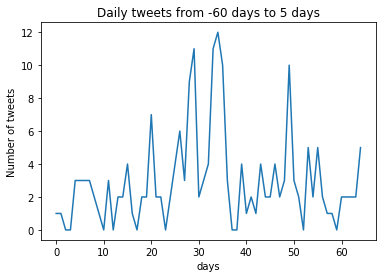





account_name: cpflenergia event_date: 2014-04-04
start_date: 2014-02-03 end_date: 2014-04-09
Sum of tweets: 268


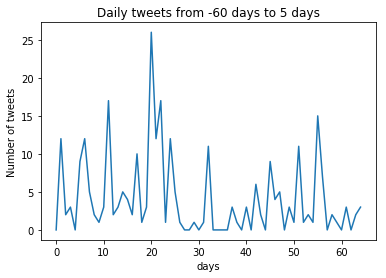





account_name: CPICardGroup event_date: 2016-03-24
start_date: 2016-01-24 end_date: 2016-03-29
Sum of tweets: 110


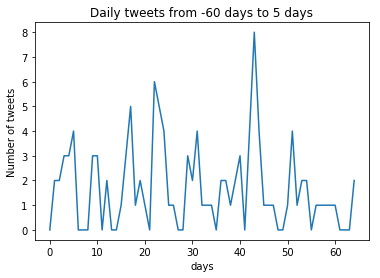





account_name: CPICardGroup event_date: 2015-07-08
start_date: 2015-05-09 end_date: 2015-07-13
Sum of tweets: 0
account_name: News_CRA event_date: 2014-08-01
start_date: 2014-06-02 end_date: 2014-08-06
Sum of tweets: 18
account_name: News_CRA event_date: 2013-05-09
start_date: 2013-03-10 end_date: 2013-05-14
Sum of tweets: 0
account_name: Cree event_date: 2016-04-26
start_date: 2016-02-26 end_date: 2016-05-01
Sum of tweets: 1033


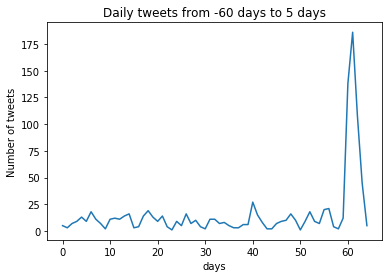





account_name: C_C_Healthcare event_date: 2014-03-18
start_date: 2014-01-17 end_date: 2014-03-23
Sum of tweets: 0
account_name: C_C_Healthcare event_date: 2013-03-18
start_date: 2013-01-17 end_date: 2013-03-23
Sum of tweets: 0
account_name: CrumbsBakeShop event_date: 2013-02-13
start_date: 2012-12-15 end_date: 2013-02-18
Sum of tweets: 954


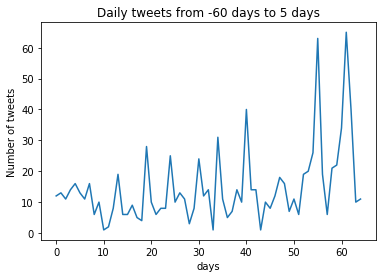





account_name: csg_i event_date: 2016-02-29
start_date: 2015-12-31 end_date: 2016-03-05
Sum of tweets: 216


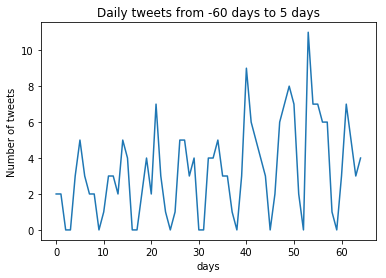





account_name: CSX event_date: 2014-01-15
start_date: 2013-11-16 end_date: 2014-01-20
Sum of tweets: 661


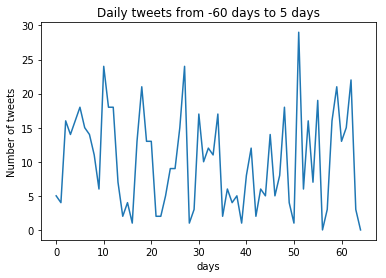





account_name: CTPartnersNews event_date: 2013-03-21
start_date: 2013-01-20 end_date: 2013-03-26
Sum of tweets: 86
account_name: CtripEnglish event_date: 2017-04-13
start_date: 2017-02-12 end_date: 2017-04-18
Sum of tweets: 187


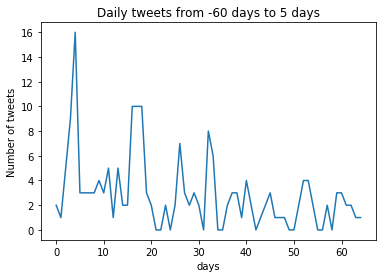





account_name: CubeSmart event_date: 2013-08-09
start_date: 2013-06-10 end_date: 2013-08-14
Sum of tweets: 275


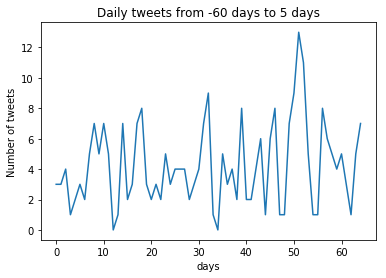





account_name: CubicCorp event_date: 2014-02-10
start_date: 2013-12-12 end_date: 2014-02-15
Sum of tweets: 43
account_name: CUI_Global event_date: 2017-05-10
start_date: 2017-03-11 end_date: 2017-05-15
Sum of tweets: 24
account_name: CUI_Global event_date: 2016-05-09
start_date: 2016-03-10 end_date: 2016-05-14
Sum of tweets: 13
account_name: CUI_Global event_date: 2015-03-16
start_date: 2015-01-15 end_date: 2015-03-21
Sum of tweets: 8
account_name: CUI_Global event_date: 2014-05-12
start_date: 2014-03-13 end_date: 2014-05-17
Sum of tweets: 11
account_name: Cyrusone event_date: 2016-02-26
start_date: 2015-12-28 end_date: 2016-03-02
Sum of tweets: 143


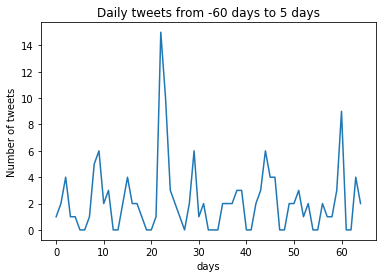





account_name: Cyrusone event_date: 2014-11-07
start_date: 2014-09-08 end_date: 2014-11-12
Sum of tweets: 255


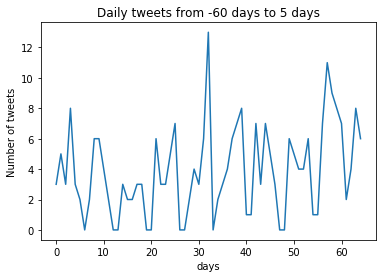





account_name: SolvayGroup event_date: 2014-04-23
start_date: 2014-02-22 end_date: 2014-04-28
Sum of tweets: 275


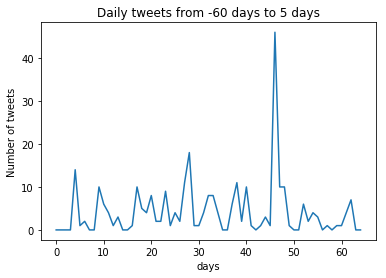





account_name: Cytokinetics event_date: 2016-12-12
start_date: 2016-10-13 end_date: 2016-12-17
Sum of tweets: 68
account_name: DRHorton event_date: 2014-04-24
start_date: 2014-02-23 end_date: 2014-04-29
Sum of tweets: 144


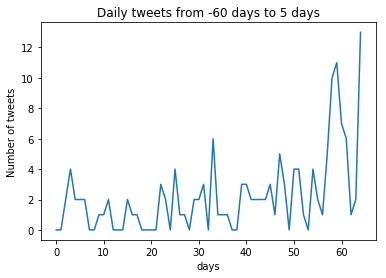





account_name: DRHorton event_date: 2013-01-29
start_date: 2012-11-30 end_date: 2013-02-03
Sum of tweets: 48
account_name: LADailyJournal event_date: 2014-12-30
start_date: 2014-10-31 end_date: 2015-01-04
Sum of tweets: 1
account_name: LADailyJournal event_date: 2013-08-20
start_date: 2013-06-21 end_date: 2013-08-25
Sum of tweets: 0
account_name: LADailyJournal event_date: 2013-02-15
start_date: 2012-12-17 end_date: 2013-02-20
Sum of tweets: 0
account_name: Daktronics event_date: 2016-06-21
start_date: 2016-04-22 end_date: 2016-06-26
Sum of tweets: 402


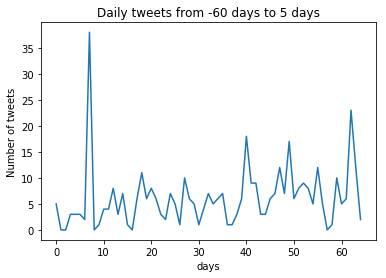





account_name: DanaInc_ event_date: 2016-10-20
start_date: 2016-08-21 end_date: 2016-10-25
Sum of tweets: 48
account_name: DanaInc_ event_date: 2015-04-23
start_date: 2015-02-22 end_date: 2015-04-28
Sum of tweets: 48
account_name: DASANZhone event_date: 2017-03-22
start_date: 2017-01-21 end_date: 2017-03-27
Sum of tweets: 15
account_name: DASANZhone event_date: 2017-02-24
start_date: 2016-12-26 end_date: 2017-03-01
Sum of tweets: 11
account_name: DASANZhone event_date: 2016-09-07
start_date: 2016-07-09 end_date: 2016-09-12
Sum of tweets: 4
account_name: DelTaco event_date: 2014-08-14
start_date: 2014-06-15 end_date: 2014-08-19
Sum of tweets: 2635


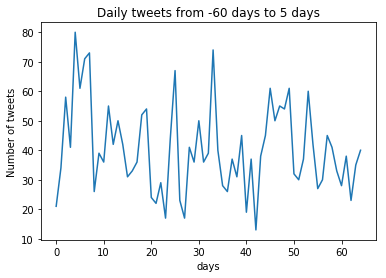





account_name: deluxecorp event_date: 2016-08-05
start_date: 2016-06-06 end_date: 2016-08-10
Sum of tweets: 322


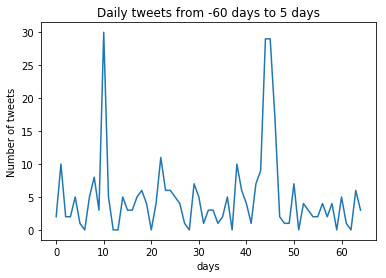





account_name: CommerceCloud event_date: 2015-02-19
start_date: 2014-12-21 end_date: 2015-02-24
Sum of tweets: 70
account_name: DentsplySirona event_date: 2017-08-09
start_date: 2017-06-10 end_date: 2017-08-14
Sum of tweets: 129


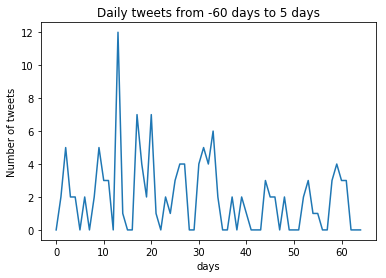





account_name: DescartesSG event_date: 2014-03-13
start_date: 2014-01-12 end_date: 2014-03-18
Sum of tweets: 27
account_name: Dialogic event_date: 2013-07-31
start_date: 2013-06-01 end_date: 2013-08-05
Sum of tweets: 258


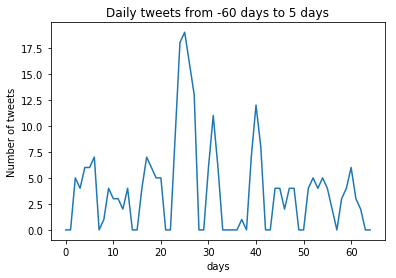





account_name: DiamondNuts event_date: 2013-12-09
start_date: 2013-10-10 end_date: 2013-12-14
Sum of tweets: 19
account_name: DiamondNuts event_date: 2013-06-10
start_date: 2013-04-11 end_date: 2013-06-15
Sum of tweets: 0
account_name: DieboldNixdorf event_date: 2013-08-06
start_date: 2013-06-07 end_date: 2013-08-11
Sum of tweets: 119


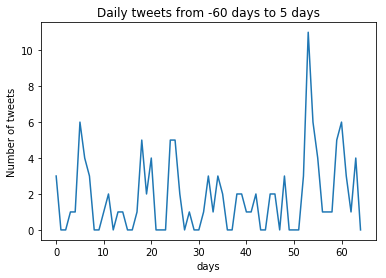





account_name: digidotcom event_date: 2014-12-11
start_date: 2014-10-12 end_date: 2014-12-16
Sum of tweets: 198


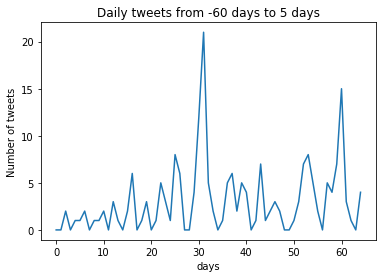





account_name: digidotcom event_date: 2014-08-04
start_date: 2014-06-05 end_date: 2014-08-09
Sum of tweets: 86
account_name: digitalrealty event_date: 2015-11-06
start_date: 2015-09-07 end_date: 2015-11-11
Sum of tweets: 349


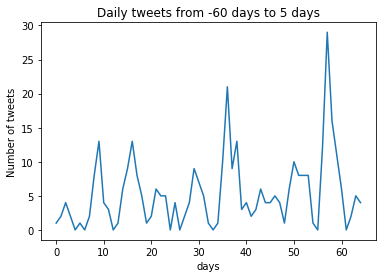





account_name: DigitalGlobe event_date: 2014-05-01
start_date: 2014-03-02 end_date: 2014-05-06
Sum of tweets: 2042


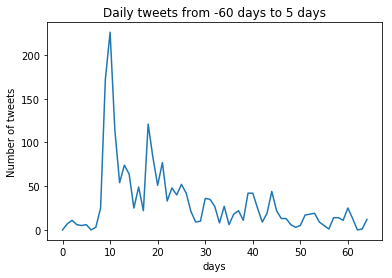





account_name: DIRECTV event_date: 2014-06-30
start_date: 2014-05-01 end_date: 2014-07-05
Sum of tweets: 49974


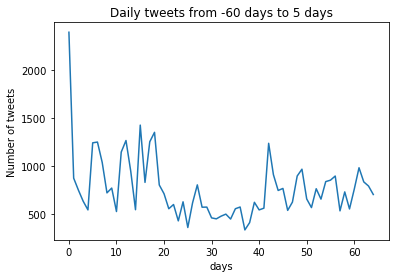





account_name: DoverSaddleryUS event_date: 2013-05-15
start_date: 2013-03-16 end_date: 2013-05-20
Sum of tweets: 330


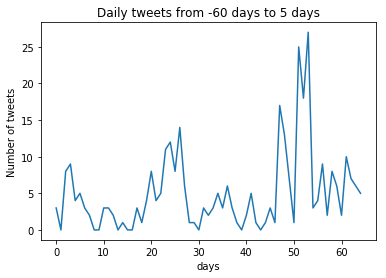





account_name: DWAnimation event_date: 2014-10-31
start_date: 2014-09-01 end_date: 2014-11-05
Sum of tweets: 12351


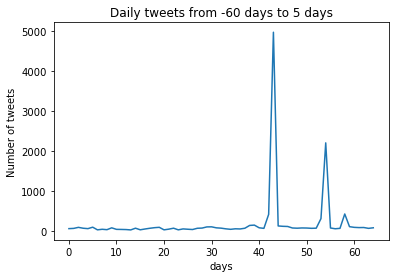





account_name: DWAnimation event_date: 2013-02-27
start_date: 2012-12-29 end_date: 2013-03-04
Sum of tweets: 2181


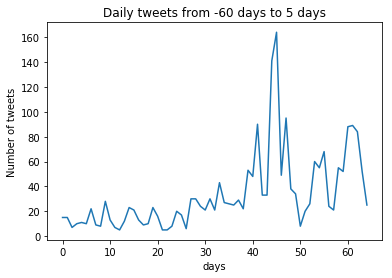





account_name: dts event_date: 2015-03-02
start_date: 2015-01-01 end_date: 2015-03-07
Sum of tweets: 170


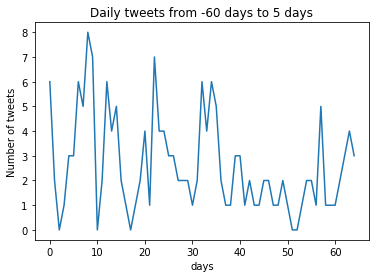





account_name: DXCTechnology event_date: 2017-11-08
start_date: 2017-09-09 end_date: 2017-11-13
Sum of tweets: 3957


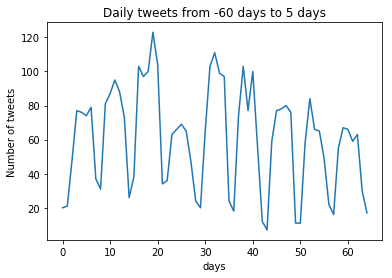





account_name: DuPont_News event_date: 2015-10-27
start_date: 2015-08-28 end_date: 2015-11-01
Sum of tweets: 1430


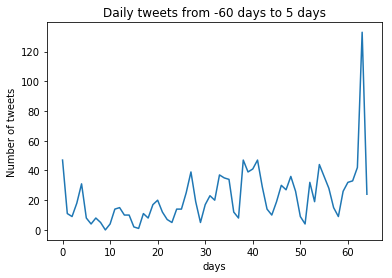





account_name: E2open event_date: 2013-04-30
start_date: 2013-03-01 end_date: 2013-05-05
Sum of tweets: 122


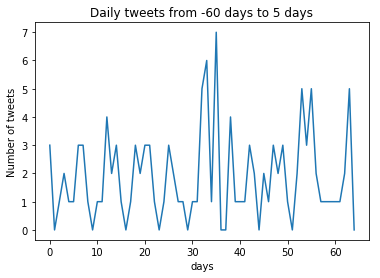





account_name: EagleBulk event_date: 2017-03-31
start_date: 2017-01-30 end_date: 2017-04-05
Sum of tweets: 0
account_name: EastmanChemCo event_date: 2015-02-27
start_date: 2014-12-29 end_date: 2015-03-04
Sum of tweets: 93
account_name: EchoLogistics event_date: 2013-02-07
start_date: 2012-12-09 end_date: 2013-02-12
Sum of tweets: 14
account_name: eclipserescorp event_date: 2017-05-09
start_date: 2017-03-10 end_date: 2017-05-14
Sum of tweets: 0
account_name: Ecolab event_date: 2015-02-27
start_date: 2014-12-29 end_date: 2015-03-04
Sum of tweets: 459


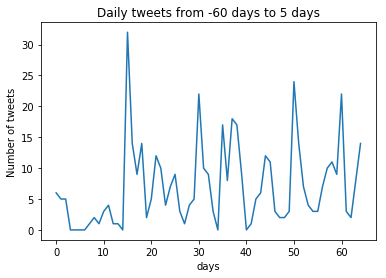





account_name: EFIPrint event_date: 2017-11-27
start_date: 2017-09-28 end_date: 2017-12-02
Sum of tweets: 342


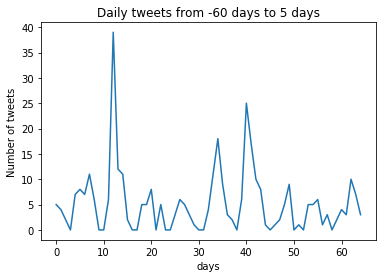





account_name: ESIsensors event_date: 2017-03-29
start_date: 2017-01-28 end_date: 2017-04-03
Sum of tweets: 11
account_name: ElevateCredit event_date: 2017-05-18
start_date: 2017-03-19 end_date: 2017-05-23
Sum of tweets: 75
account_name: EllieMaeInc event_date: 2015-03-02
start_date: 2015-01-01 end_date: 2015-03-07
Sum of tweets: 109


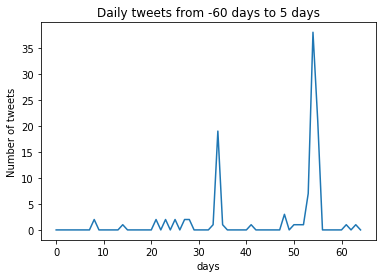





account_name: EmpresasICA event_date: 2015-04-30
start_date: 2015-03-01 end_date: 2015-05-05
Sum of tweets: 75
account_name: encompasshlth event_date: 2015-05-01
start_date: 2015-03-02 end_date: 2015-05-06
Sum of tweets: 0
account_name: encompasshlth event_date: 2013-04-26
start_date: 2013-02-25 end_date: 2013-05-01
Sum of tweets: 0
account_name: Enel_Chile event_date: 2016-02-25
start_date: 2015-12-27 end_date: 2016-03-01
Sum of tweets: 29
account_name: enova event_date: 2015-03-20
start_date: 2015-01-19 end_date: 2015-03-25
Sum of tweets: 137


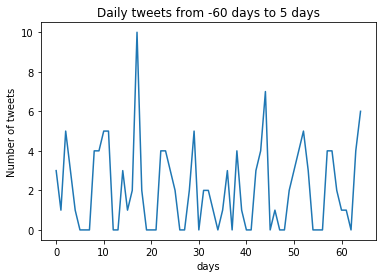





account_name: Entercom event_date: 2017-08-04
start_date: 2017-06-05 end_date: 2017-08-09
Sum of tweets: 363


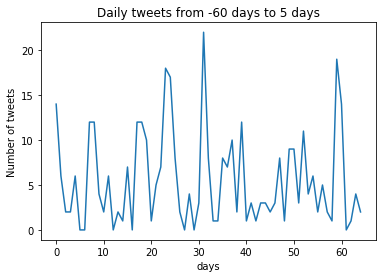





account_name: Entercom event_date: 2015-03-02
start_date: 2015-01-01 end_date: 2015-03-07
Sum of tweets: 225


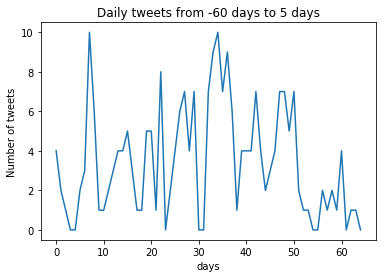





account_name: Entercom event_date: 2014-03-03
start_date: 2014-01-02 end_date: 2014-03-08
Sum of tweets: 151


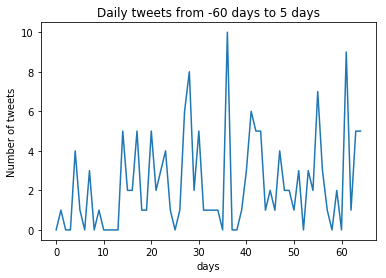





account_name: Entercom event_date: 2013-02-08
start_date: 2012-12-10 end_date: 2013-02-13
Sum of tweets: 76
account_name: Equinix event_date: 2013-11-12
start_date: 2013-09-13 end_date: 2013-11-17
Sum of tweets: 369


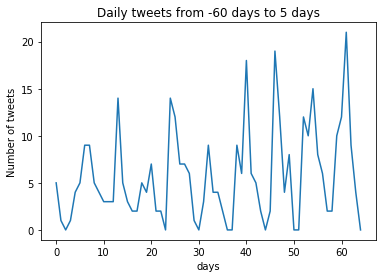





account_name: Etsy event_date: 2015-03-04
start_date: 2015-01-03 end_date: 2015-03-09
Sum of tweets: 554905


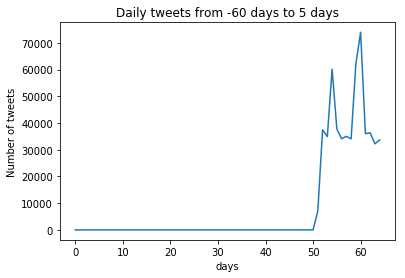





account_name: EvansBankWNY event_date: 2015-03-09
start_date: 2015-01-08 end_date: 2015-03-14
Sum of tweets: 16
account_name: EvansBankWNY event_date: 2013-05-03
start_date: 2013-03-04 end_date: 2013-05-08
Sum of tweets: 25
account_name: EverestIns event_date: 2014-03-03
start_date: 2014-01-02 end_date: 2014-03-08
Sum of tweets: 0
account_name: Evertec_Inc event_date: 2016-02-29
start_date: 2015-12-31 end_date: 2016-03-05
Sum of tweets: 327


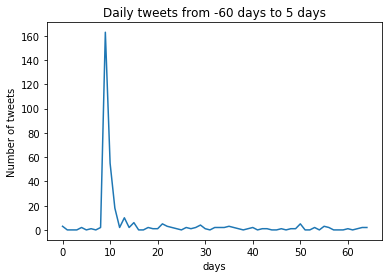





account_name: EvolentHealth event_date: 2017-11-09
start_date: 2017-09-10 end_date: 2017-11-14
Sum of tweets: 44
account_name: EvolentHealth event_date: 2017-03-03
start_date: 2017-01-02 end_date: 2017-03-08
Sum of tweets: 35
account_name: ExaCorp event_date: 2013-04-09
start_date: 2013-02-08 end_date: 2013-04-14
Sum of tweets: 0
account_name: ExarCorp event_date: 2015-06-05
start_date: 2015-04-06 end_date: 2015-06-10
Sum of tweets: 6
account_name: ExelixisInc event_date: 2016-11-03
start_date: 2016-09-04 end_date: 2016-11-08
Sum of tweets: 76
account_name: Exelon event_date: 2016-10-26
start_date: 2016-08-27 end_date: 2016-10-31
Sum of tweets: 670


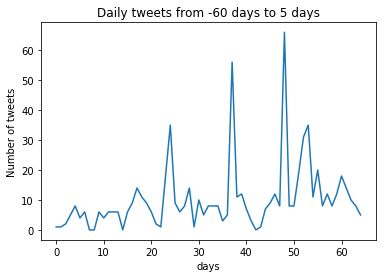





account_name: Exelon event_date: 2016-08-09
start_date: 2016-06-10 end_date: 2016-08-14
Sum of tweets: 755


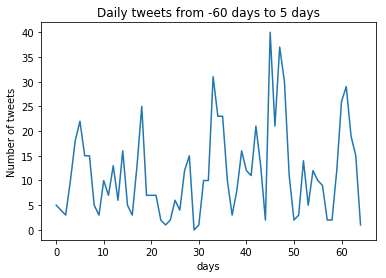





account_name: EXFO event_date: 2017-01-10
start_date: 2016-11-11 end_date: 2017-01-15
Sum of tweets: 64
account_name: express event_date: 2014-04-01
start_date: 2014-01-31 end_date: 2014-04-06
Sum of tweets: 1154


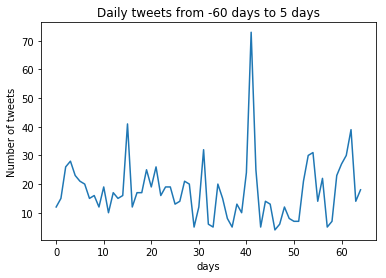





account_name: ExpressScripts event_date: 2015-02-23
start_date: 2014-12-25 end_date: 2015-02-28
Sum of tweets: 608


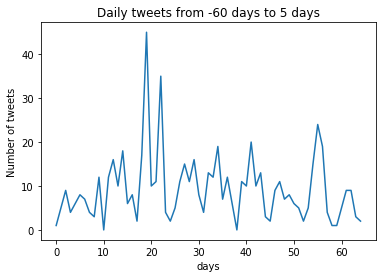





account_name: ExpressScripts event_date: 2014-04-29
start_date: 2014-02-28 end_date: 2014-05-04
Sum of tweets: 869


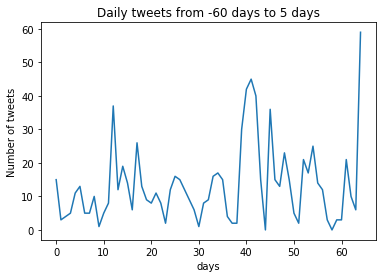





account_name: F5Networks event_date: 2016-07-27
start_date: 2016-05-28 end_date: 2016-08-01
Sum of tweets: 1445


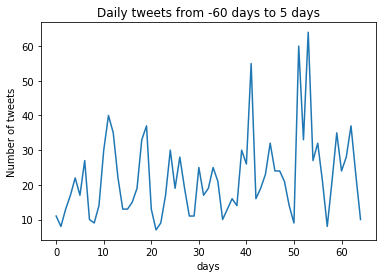





account_name: Farmer_Brothers event_date: 2014-02-10
start_date: 2013-12-12 end_date: 2014-02-15
Sum of tweets: 19
account_name: Farmer_Brothers event_date: 2013-09-11
start_date: 2013-07-13 end_date: 2013-09-16
Sum of tweets: 16
account_name: FedNatTeam event_date: 2017-08-09
start_date: 2017-06-10 end_date: 2017-08-14
Sum of tweets: 1
account_name: fibrocell event_date: 2014-05-12
start_date: 2014-03-13 end_date: 2014-05-17
Sum of tweets: 0
account_name: fibrocell event_date: 2013-04-01
start_date: 2013-01-31 end_date: 2013-04-06
Sum of tweets: 0
account_name: fg_life event_date: 2014-11-19
start_date: 2014-09-20 end_date: 2014-11-24
Sum of tweets: 95
account_name: FifthStreetFSC event_date: 2016-11-14
start_date: 2016-09-15 end_date: 2016-11-19
Sum of tweets: 0
account_name: FifthStreetFSC event_date: 2015-11-23
start_date: 2015-09-24 end_date: 2015-11-28
Sum of tweets: 0
account_name: FifthStreetFSC event_date: 2014-10-28
start_date: 2014-08-29 end_date: 2014-11-02
Sum of tweet

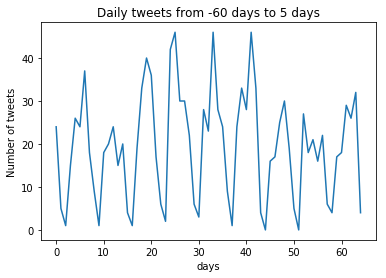





account_name: FirstData event_date: 2015-07-20
start_date: 2015-05-21 end_date: 2015-07-25
Sum of tweets: 1338


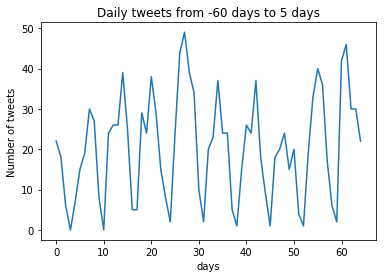





account_name: FirstData event_date: 2015-02-27
start_date: 2014-12-29 end_date: 2015-03-04
Sum of tweets: 1346


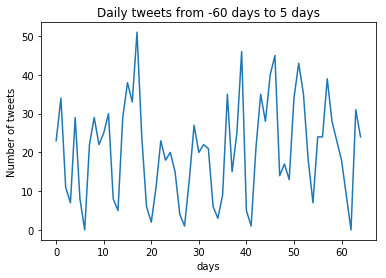





account_name: keybank event_date: 2015-02-24
start_date: 2014-12-26 end_date: 2015-03-01
Sum of tweets: 882


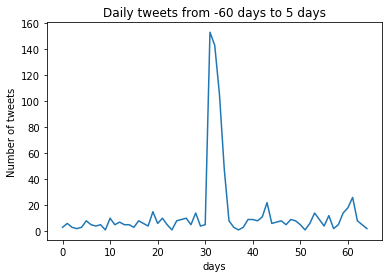





account_name: FirstSolar event_date: 2015-11-09
start_date: 2015-09-10 end_date: 2015-11-14
Sum of tweets: 348


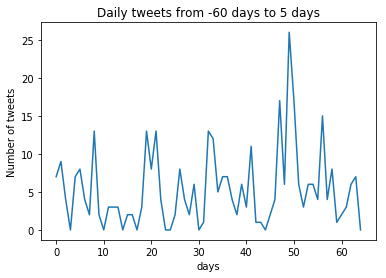





account_name: MyBank event_date: 2016-12-19
start_date: 2016-10-20 end_date: 2016-12-24
Sum of tweets: 83
account_name: MyBank event_date: 2015-03-09
start_date: 2015-01-08 end_date: 2015-03-14
Sum of tweets: 56
account_name: flagstar event_date: 2015-03-16
start_date: 2015-01-15 end_date: 2015-03-21
Sum of tweets: 708


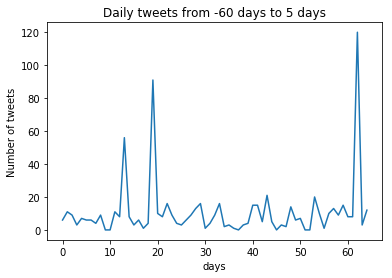





account_name: Flowserve event_date: 2017-07-27
start_date: 2017-05-28 end_date: 2017-08-01
Sum of tweets: 84
account_name: fogorestaurants event_date: 2016-08-10
start_date: 2016-06-11 end_date: 2016-08-15
Sum of tweets: 527


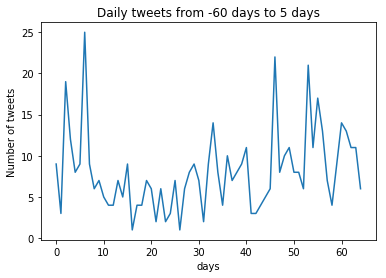





account_name: fogorestaurants event_date: 2016-03-30
start_date: 2016-01-30 end_date: 2016-04-04
Sum of tweets: 611


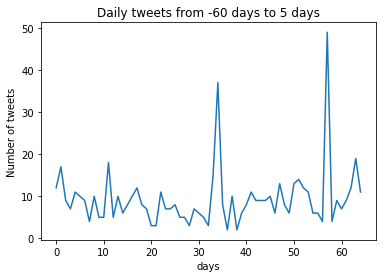





account_name: FormFactorInc event_date: 2014-03-07
start_date: 2014-01-06 end_date: 2014-03-12
Sum of tweets: 4
account_name: forrester event_date: 2014-03-13
start_date: 2014-01-12 end_date: 2014-03-18
Sum of tweets: 7708


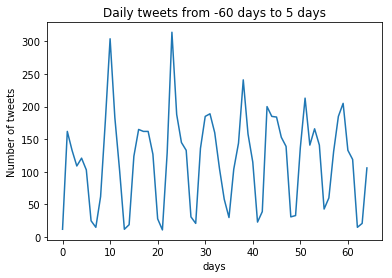





account_name: forrester event_date: 2013-11-12
start_date: 2013-09-13 end_date: 2013-11-17
Sum of tweets: 7351


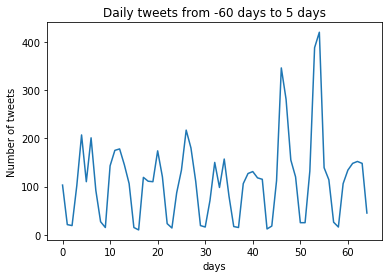





account_name: Fortegra event_date: 2013-03-28
start_date: 2013-01-27 end_date: 2013-04-02
Sum of tweets: 1
account_name: FortiveCorp event_date: 2016-10-27
start_date: 2016-08-28 end_date: 2016-11-01
Sum of tweets: 38
account_name: FredsInc event_date: 2013-09-12
start_date: 2013-07-14 end_date: 2013-09-17
Sum of tweets: 224


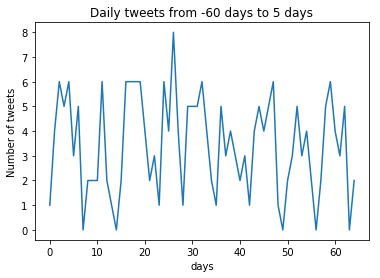





account_name: ftdflowers event_date: 2017-03-14
start_date: 2017-01-13 end_date: 2017-03-19
Sum of tweets: 3124


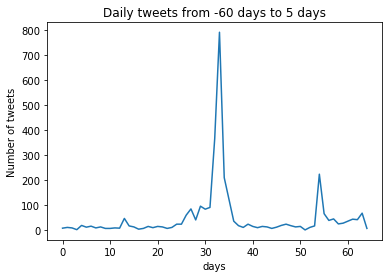





account_name: IrFte event_date: 2017-11-16
start_date: 2017-09-17 end_date: 2017-11-21
Sum of tweets: 9
account_name: GameStop event_date: 2014-04-02
start_date: 2014-02-01 end_date: 2014-04-07
Sum of tweets: 17252


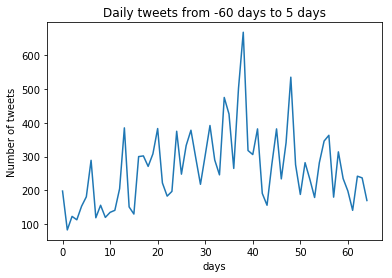





account_name: gcpAppliedTech event_date: 2016-05-11
start_date: 2016-03-12 end_date: 2016-05-16
Sum of tweets: 86
account_name: gcpAppliedTech event_date: 2016-03-30
start_date: 2016-01-30 end_date: 2016-04-04
Sum of tweets: 105


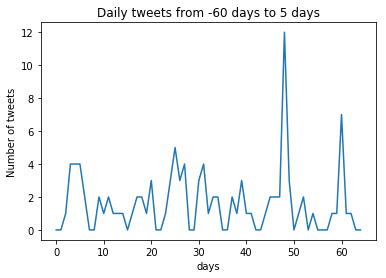





account_name: thinkgeek event_date: 2013-03-01
start_date: 2012-12-31 end_date: 2013-03-06
Sum of tweets: 16577


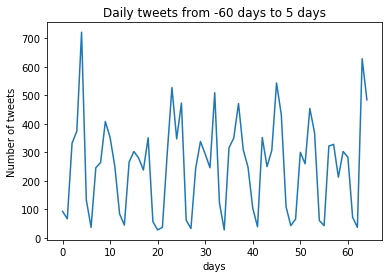





account_name: GeneralCableNA event_date: 2013-08-07
start_date: 2013-06-08 end_date: 2013-08-12
Sum of tweets: 0
account_name: generalelectric event_date: 2017-10-30
start_date: 2017-08-31 end_date: 2017-11-04
Sum of tweets: 9407


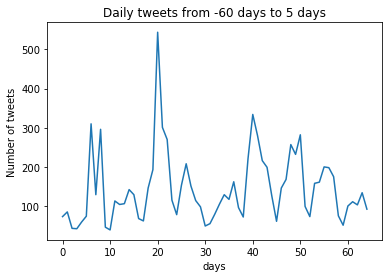





account_name: GeneralMoly_IR event_date: 2016-05-05
start_date: 2016-03-06 end_date: 2016-05-10
Sum of tweets: 2
account_name: GenieEnergy event_date: 2017-11-02
start_date: 2017-09-03 end_date: 2017-11-07
Sum of tweets: 0
account_name: GenieEnergy event_date: 2016-11-09
start_date: 2016-09-10 end_date: 2016-11-14
Sum of tweets: 8
account_name: GNUSBrands event_date: 2016-11-14
start_date: 2016-09-15 end_date: 2016-11-19
Sum of tweets: 18
account_name: NAPAKnowHow event_date: 2013-02-26
start_date: 2012-12-28 end_date: 2013-03-03
Sum of tweets: 1409


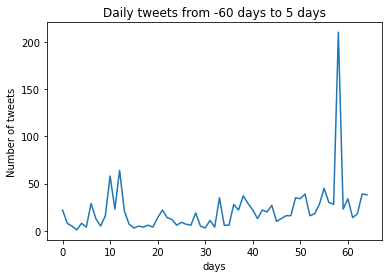





account_name: Genworth event_date: 2015-08-05
start_date: 2015-06-06 end_date: 2015-08-10
Sum of tweets: 364


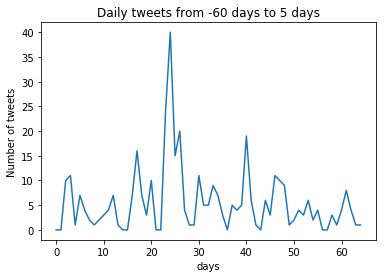





account_name: Genworth event_date: 2013-04-30
start_date: 2013-03-01 end_date: 2013-05-05
Sum of tweets: 388


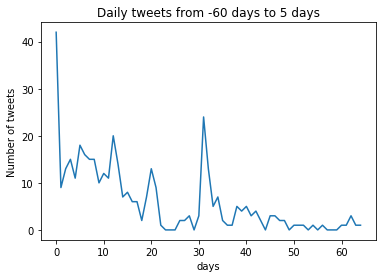





account_name: Gevo_Inc event_date: 2015-11-10
start_date: 2015-09-11 end_date: 2015-11-15
Sum of tweets: 0
account_name: gigamon event_date: 2014-03-13
start_date: 2014-01-12 end_date: 2014-03-18
Sum of tweets: 147


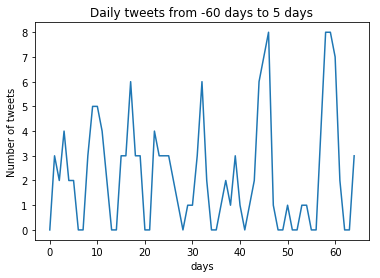





account_name: GladstoneComps event_date: 2013-08-07
start_date: 2013-06-08 end_date: 2013-08-12
Sum of tweets: 24
account_name: Glatfelter event_date: 2015-02-27
start_date: 2014-12-29 end_date: 2015-03-04
Sum of tweets: 46
account_name: GlobalNetLease event_date: 2016-08-08
start_date: 2016-06-09 end_date: 2016-08-13
Sum of tweets: 2
account_name: GlobalNetLease event_date: 2015-04-03
start_date: 2015-02-02 end_date: 2015-04-08
Sum of tweets: 0
account_name: globalscape event_date: 2017-08-07
start_date: 2017-06-08 end_date: 2017-08-12
Sum of tweets: 284


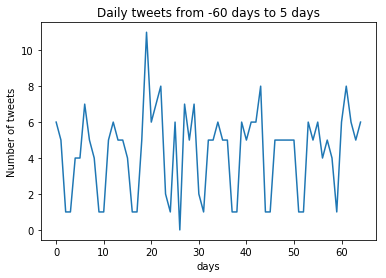





account_name: GlobusMedical event_date: 2013-10-31
start_date: 2013-09-01 end_date: 2013-11-05
Sum of tweets: 1
account_name: glumobile event_date: 2013-08-06
start_date: 2013-06-07 end_date: 2013-08-11
Sum of tweets: 190


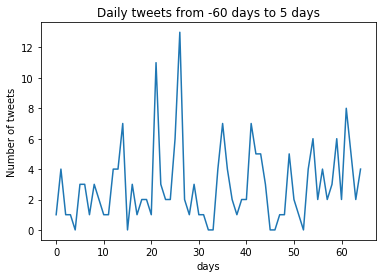





account_name: gmscompanies event_date: 2017-06-30
start_date: 2017-05-01 end_date: 2017-07-05
Sum of tweets: 67
account_name: gmscompanies event_date: 2016-07-12
start_date: 2016-05-13 end_date: 2016-07-17
Sum of tweets: 87
account_name: Gogo event_date: 2016-11-03
start_date: 2016-09-04 end_date: 2016-11-08
Sum of tweets: 5257


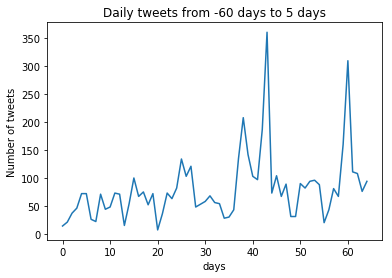





account_name: Gogo event_date: 2016-02-25
start_date: 2015-12-27 end_date: 2016-03-01
Sum of tweets: 11437


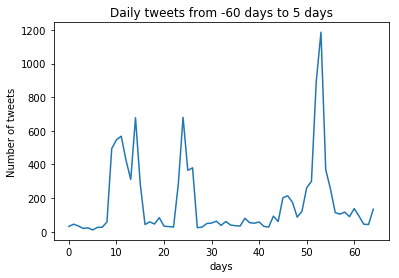





account_name: resource_gold event_date: 2016-03-09
start_date: 2016-01-09 end_date: 2016-03-14
Sum of tweets: 0
account_name: GoodyearBlimp event_date: 2017-04-28
start_date: 2017-02-27 end_date: 2017-05-03
Sum of tweets: 382


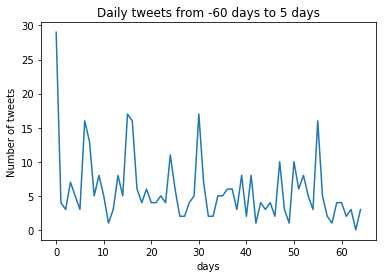





account_name: GoodyearBlimp event_date: 2015-10-29
start_date: 2015-08-30 end_date: 2015-11-03
Sum of tweets: 1211


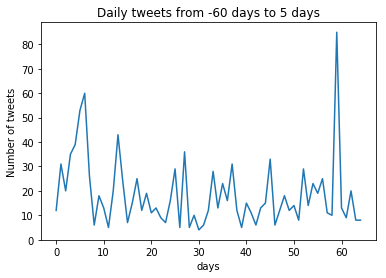





account_name: GoPro event_date: 2014-08-11
start_date: 2014-06-12 end_date: 2014-08-16
Sum of tweets: 37891


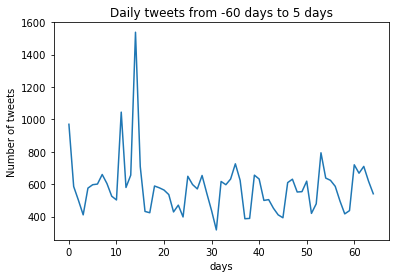





account_name: grahamholdings event_date: 2016-02-26
start_date: 2015-12-28 end_date: 2016-03-02
Sum of tweets: 24
account_name: grahamholdings event_date: 2015-02-27
start_date: 2014-12-29 end_date: 2015-03-04
Sum of tweets: 1
account_name: grahamholdings event_date: 2014-02-28
start_date: 2013-12-30 end_date: 2014-03-05
Sum of tweets: 15
account_name: Granite event_date: 2016-10-28
start_date: 2016-08-29 end_date: 2016-11-02
Sum of tweets: 215


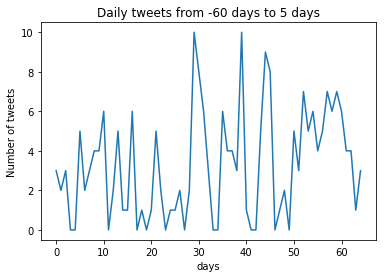





account_name: Granite event_date: 2014-03-03
start_date: 2014-01-02 end_date: 2014-03-08
Sum of tweets: 17
account_name: GreenBrickInc event_date: 2017-03-13
start_date: 2017-01-12 end_date: 2017-03-18
Sum of tweets: 0
account_name: greendotcards event_date: 2013-03-01
start_date: 2012-12-31 end_date: 2013-03-06
Sum of tweets: 157


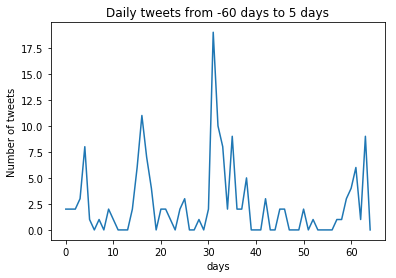





account_name: OMAeropuertos event_date: 2013-04-29
start_date: 2013-02-28 end_date: 2013-05-04
Sum of tweets: 79
account_name: aeropuertosGAP event_date: 2017-04-12
start_date: 2017-02-11 end_date: 2017-04-17
Sum of tweets: 1892


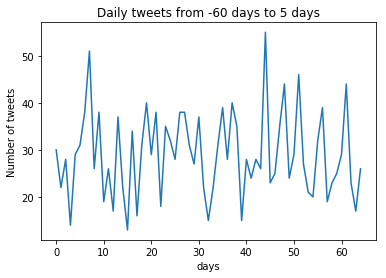





account_name: GSESystems event_date: 2016-03-15
start_date: 2016-01-15 end_date: 2016-03-20
Sum of tweets: 46
account_name: GTTCOMM event_date: 2015-11-06
start_date: 2015-09-07 end_date: 2015-11-11
Sum of tweets: 157


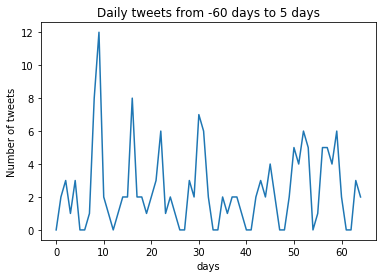





account_name: OpenText event_date: 2014-02-24
start_date: 2013-12-26 end_date: 2014-03-01
Sum of tweets: 694


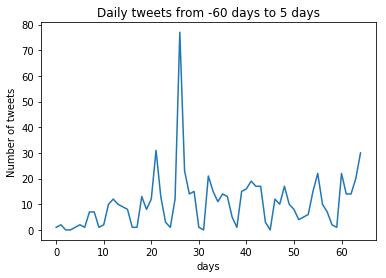





account_name: GWGLife event_date: 2017-03-15
start_date: 2017-01-14 end_date: 2017-03-20
Sum of tweets: 123


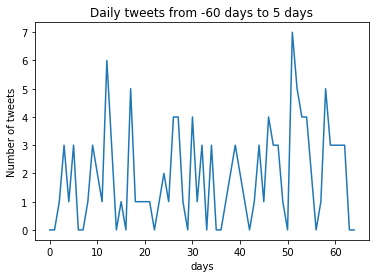





account_name: HangerNews event_date: 2014-11-06
start_date: 2014-09-07 end_date: 2014-11-11
Sum of tweets: 58
account_name: HangerNews event_date: 2013-10-29
start_date: 2013-08-30 end_date: 2013-11-03
Sum of tweets: 50
account_name: HangerNews event_date: 2013-03-04
start_date: 2013-01-03 end_date: 2013-03-09
Sum of tweets: 54
account_name: Harman event_date: 2016-11-03
start_date: 2016-09-04 end_date: 2016-11-08
Sum of tweets: 764


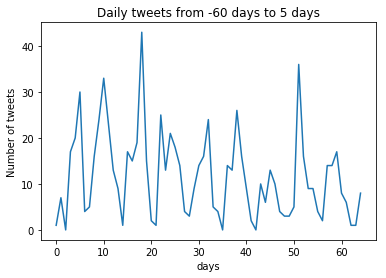





account_name: HarrisCorp event_date: 2015-11-06
start_date: 2015-09-07 end_date: 2015-11-11
Sum of tweets: 462


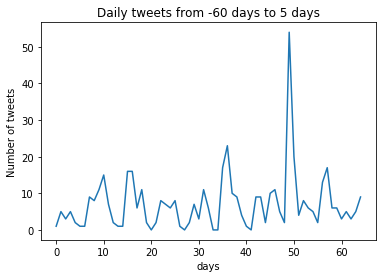





account_name: TheHartford event_date: 2013-03-01
start_date: 2012-12-31 end_date: 2013-03-06
Sum of tweets: 236


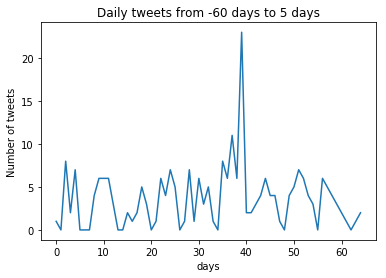





account_name: HealthEquity event_date: 2014-12-11
start_date: 2014-10-12 end_date: 2014-12-16
Sum of tweets: 48
account_name: HealthStream event_date: 2014-07-31
start_date: 2014-06-01 end_date: 2014-08-05
Sum of tweets: 312


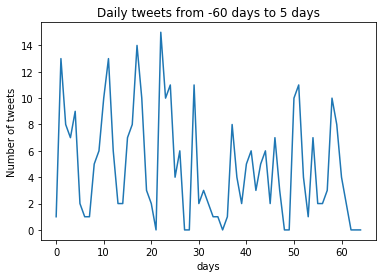





account_name: JackHenryAssoc event_date: 2015-02-09
start_date: 2014-12-11 end_date: 2015-02-14
Sum of tweets: 74
account_name: JackHenryAssoc event_date: 2014-08-27
start_date: 2014-06-28 end_date: 2014-09-01
Sum of tweets: 144


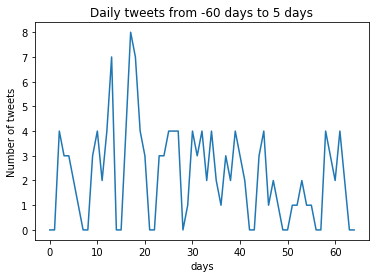





account_name: HercRentalsInc event_date: 2017-08-08
start_date: 2017-06-09 end_date: 2017-08-13
Sum of tweets: 95
account_name: HercRentalsInc event_date: 2017-05-09
start_date: 2017-03-10 end_date: 2017-05-14
Sum of tweets: 70
account_name: HercRentalsInc event_date: 2016-08-09
start_date: 2016-06-10 end_date: 2016-08-14
Sum of tweets: 84
account_name: HercRentalsInc event_date: 2015-11-09
start_date: 2015-09-10 end_date: 2015-11-14
Sum of tweets: 57
account_name: HercRentalsInc event_date: 2014-05-13
start_date: 2014-03-14 end_date: 2014-05-18
Sum of tweets: 127


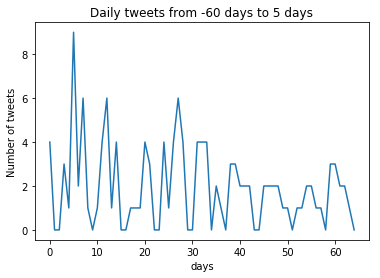





account_name: HercRentalsInc event_date: 2014-03-03
start_date: 2014-01-02 end_date: 2014-03-08
Sum of tweets: 124


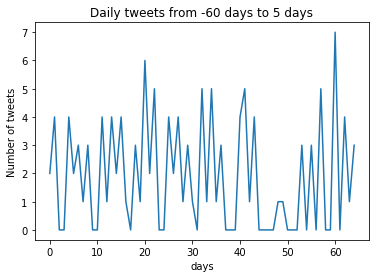





account_name: HermanMiller event_date: 2016-01-06
start_date: 2015-11-07 end_date: 2016-01-11
Sum of tweets: 731


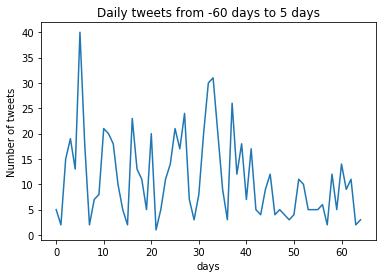





account_name: HersheyCompany event_date: 2016-02-26
start_date: 2015-12-28 end_date: 2016-03-02
Sum of tweets: 1866


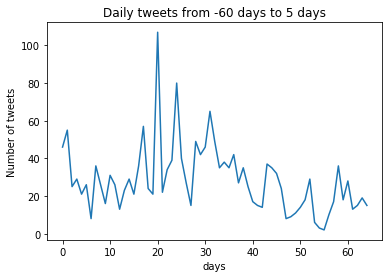





account_name: Hertz event_date: 2017-08-08
start_date: 2017-06-09 end_date: 2017-08-13
Sum of tweets: 20844


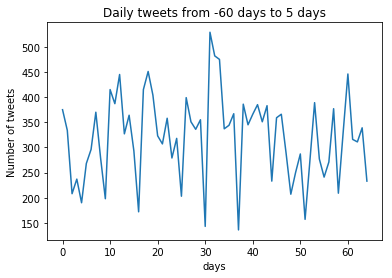





account_name: Hertz event_date: 2017-03-06
start_date: 2017-01-05 end_date: 2017-03-11
Sum of tweets: 16702


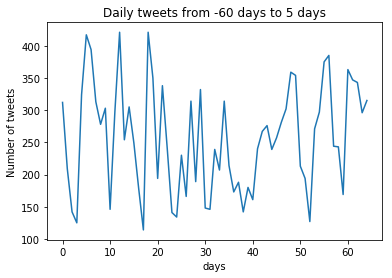





account_name: Hillintl event_date: 2015-10-19
start_date: 2015-08-20 end_date: 2015-10-24
Sum of tweets: 168


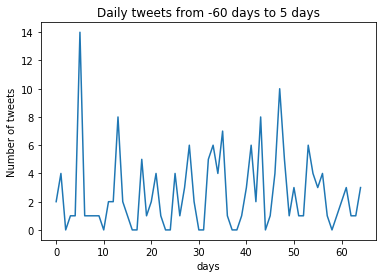





account_name: HillenbrandInc event_date: 2014-02-04
start_date: 2013-12-06 end_date: 2014-02-09
Sum of tweets: 0
account_name: HiltonWorld event_date: 2014-10-31
start_date: 2014-09-01 end_date: 2014-11-05
Sum of tweets: 38
account_name: HomeStreetBank event_date: 2013-03-15
start_date: 2013-01-14 end_date: 2013-03-20
Sum of tweets: 101


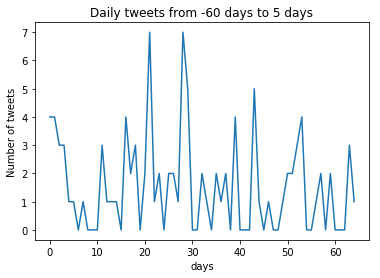





account_name: HomeTrust_Bank event_date: 2017-11-09
start_date: 2017-09-10 end_date: 2017-11-14
Sum of tweets: 35
account_name: HondaJP event_date: 2013-06-25
start_date: 2013-04-26 end_date: 2013-06-30
Sum of tweets: 761


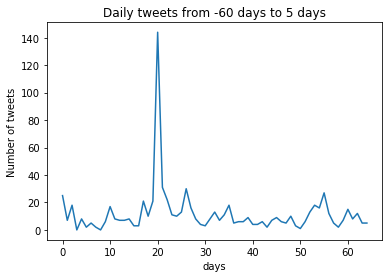





account_name: HZNPplc event_date: 2016-05-09
start_date: 2016-03-10 end_date: 2016-05-14
Sum of tweets: 78
account_name: HZNPplc event_date: 2014-03-13
start_date: 2014-01-12 end_date: 2014-03-18
Sum of tweets: 0
account_name: HubbellCorp event_date: 2016-02-18
start_date: 2015-12-20 end_date: 2016-02-23
Sum of tweets: 20
account_name: HubbellCorp event_date: 2015-02-19
start_date: 2014-12-21 end_date: 2015-02-24
Sum of tweets: 11
account_name: HudBayMinerals event_date: 2017-03-31
start_date: 2017-01-30 end_date: 2017-04-05
Sum of tweets: 4
account_name: HIIndustries event_date: 2014-05-08
start_date: 2014-03-09 end_date: 2014-05-13
Sum of tweets: 482


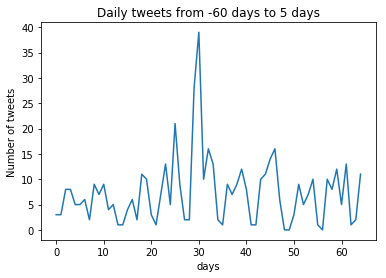





account_name: HIIndustries event_date: 2013-02-27
start_date: 2012-12-29 end_date: 2013-03-04
Sum of tweets: 411


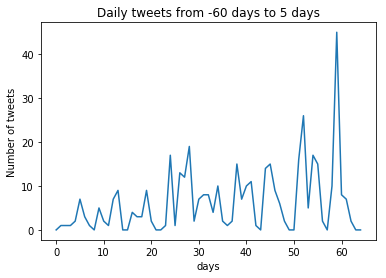





account_name: Huron event_date: 2014-02-26
start_date: 2013-12-28 end_date: 2014-03-03
Sum of tweets: 321


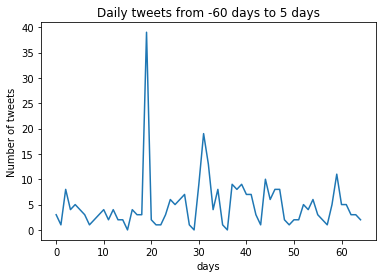





account_name: Huron event_date: 2013-10-30
start_date: 2013-08-31 end_date: 2013-11-04
Sum of tweets: 320


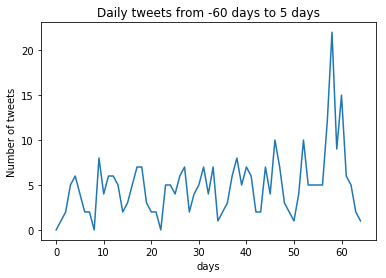





account_name: IBERIABANK event_date: 2015-03-02
start_date: 2015-01-01 end_date: 2015-03-07
Sum of tweets: 81
account_name: IBERIABANK event_date: 2013-03-01
start_date: 2012-12-31 end_date: 2013-03-06
Sum of tweets: 114


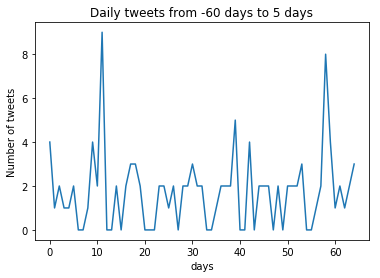





account_name: Iconix event_date: 2016-11-09
start_date: 2016-09-10 end_date: 2016-11-14
Sum of tweets: 15
account_name: Iconix event_date: 2016-02-18
start_date: 2015-12-20 end_date: 2016-02-23
Sum of tweets: 8
account_name: Iconix event_date: 2015-08-10
start_date: 2015-06-11 end_date: 2015-08-15
Sum of tweets: 19
account_name: IdentivInc event_date: 2013-11-13
start_date: 2013-09-14 end_date: 2013-11-18
Sum of tweets: 327


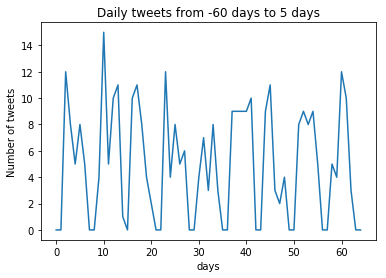





account_name: IdentivInc event_date: 2013-03-19
start_date: 2013-01-18 end_date: 2013-03-24
Sum of tweets: 93
account_name: IECElectronics event_date: 2015-05-07
start_date: 2015-03-08 end_date: 2015-05-12
Sum of tweets: 68
account_name: IECElectronics event_date: 2015-02-09
start_date: 2014-12-11 end_date: 2015-02-14
Sum of tweets: 32
account_name: IECElectronics event_date: 2013-05-01
start_date: 2013-03-02 end_date: 2013-05-06
Sum of tweets: 25
account_name: iiviinc event_date: 2015-08-28
start_date: 2015-06-29 end_date: 2015-09-02
Sum of tweets: 0
account_name: IMAX event_date: 2013-02-21
start_date: 2012-12-23 end_date: 2013-02-26
Sum of tweets: 3673


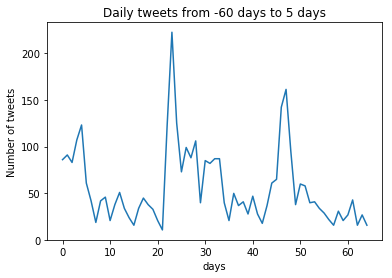





account_name: ImmunePharma event_date: 2016-03-30
start_date: 2016-01-30 end_date: 2016-04-04
Sum of tweets: 16
account_name: Impinj event_date: 2016-11-17
start_date: 2016-09-18 end_date: 2016-11-22
Sum of tweets: 224


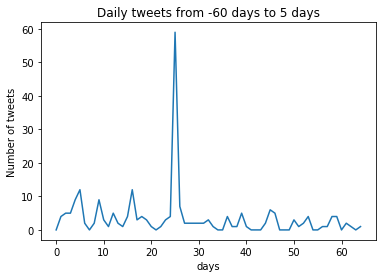





account_name: Impinj event_date: 2016-11-15
start_date: 2016-09-16 end_date: 2016-11-20
Sum of tweets: 226


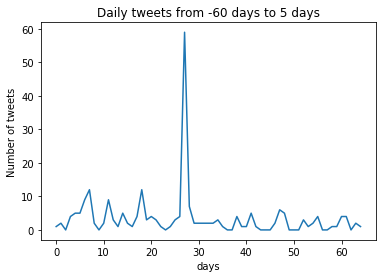





account_name: Impinj event_date: 2016-09-02
start_date: 2016-07-04 end_date: 2016-09-07
Sum of tweets: 197


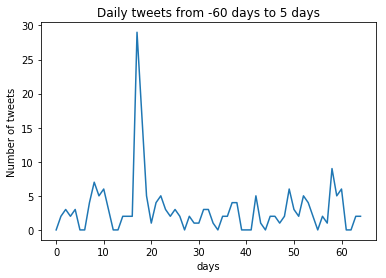





account_name: inContact event_date: 2014-11-14
start_date: 2014-09-15 end_date: 2014-11-19
Sum of tweets: 493


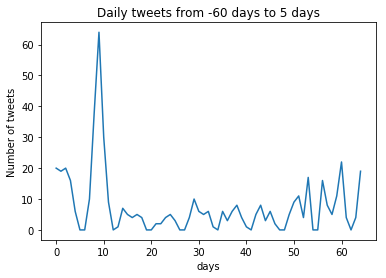





account_name: inContact event_date: 2013-03-18
start_date: 2013-01-17 end_date: 2013-03-23
Sum of tweets: 344


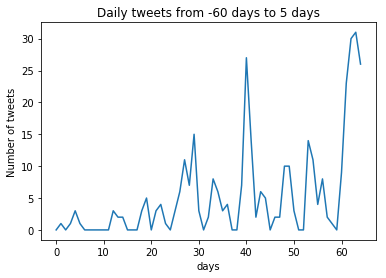





account_name: ICDShaleDriller event_date: 2015-05-11
start_date: 2015-03-12 end_date: 2015-05-16
Sum of tweets: 3
account_name: IGCIR event_date: 2014-07-15
start_date: 2014-05-16 end_date: 2014-07-20
Sum of tweets: 0
account_name: InfinityAuto event_date: 2014-05-08
start_date: 2014-03-09 end_date: 2014-05-13
Sum of tweets: 15
account_name: ING_news event_date: 2016-01-12
start_date: 2015-11-13 end_date: 2016-01-17
Sum of tweets: 325


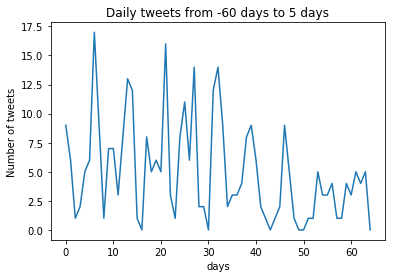





account_name: IngersollRand event_date: 2016-04-26
start_date: 2016-02-26 end_date: 2016-05-01
Sum of tweets: 280


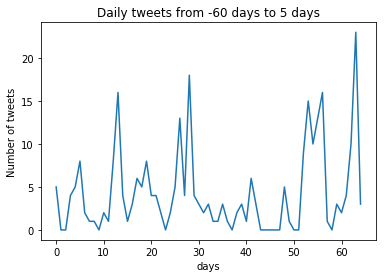





account_name: IngersollRand event_date: 2015-10-27
start_date: 2015-08-28 end_date: 2015-11-01
Sum of tweets: 240


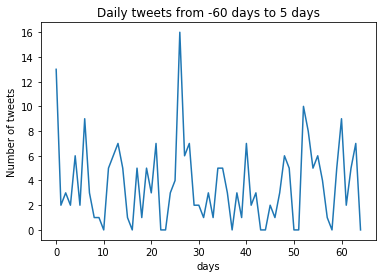





account_name: IngersollRand event_date: 2014-10-22
start_date: 2014-08-23 end_date: 2014-10-27
Sum of tweets: 253


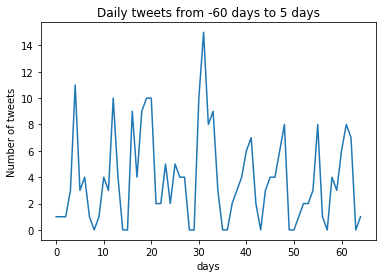





account_name: IngersollRand event_date: 2014-04-23
start_date: 2014-02-22 end_date: 2014-04-28
Sum of tweets: 203


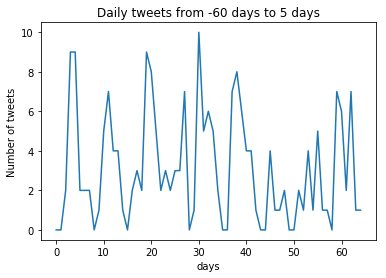





account_name: ingevity event_date: 2017-03-02
start_date: 2017-01-01 end_date: 2017-03-07
Sum of tweets: 31
account_name: INWK_Inc event_date: 2016-08-09
start_date: 2016-06-10 end_date: 2016-08-14
Sum of tweets: 24
account_name: INWK_Inc event_date: 2014-02-18
start_date: 2013-12-20 end_date: 2014-02-23
Sum of tweets: 0
account_name: inseego event_date: 2016-03-15
start_date: 2016-01-15 end_date: 2016-03-20
Sum of tweets: 0
account_name: IBKR event_date: 2014-03-18
start_date: 2014-01-17 end_date: 2014-03-23
Sum of tweets: 311


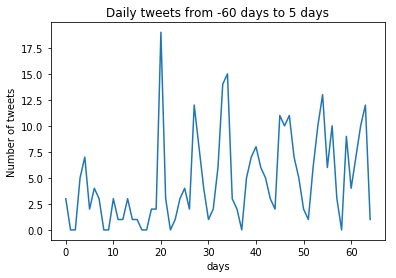





account_name: IBKR event_date: 2013-03-08
start_date: 2013-01-07 end_date: 2013-03-13
Sum of tweets: 51
account_name: InterceptPharma event_date: 2014-08-11
start_date: 2014-06-12 end_date: 2014-08-16
Sum of tweets: 0
account_name: IFF event_date: 2017-05-08
start_date: 2017-03-09 end_date: 2017-05-13
Sum of tweets: 126


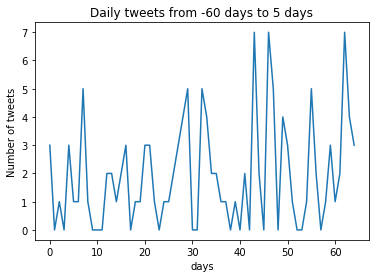





account_name: IFF event_date: 2016-03-01
start_date: 2016-01-01 end_date: 2016-03-06
Sum of tweets: 201


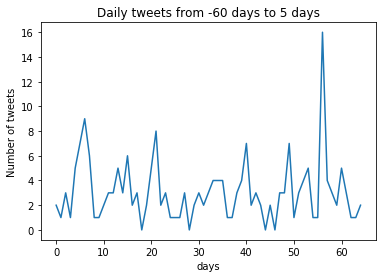





account_name: IFF event_date: 2016-08-08
start_date: 2016-06-09 end_date: 2016-08-13
Sum of tweets: 157


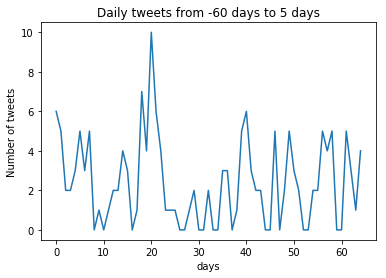





account_name: INTLFCStone event_date: 2013-12-17
start_date: 2013-10-18 end_date: 2013-12-22
Sum of tweets: 218


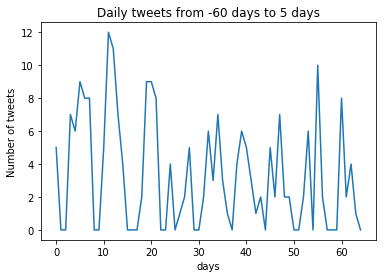





account_name: invtitle event_date: 2017-08-08
start_date: 2017-06-09 end_date: 2017-08-13
Sum of tweets: 2
account_name: invtitle event_date: 2014-05-09
start_date: 2014-03-10 end_date: 2014-05-14
Sum of tweets: 0
account_name: Invitae event_date: 2016-11-07
start_date: 2016-09-08 end_date: 2016-11-12
Sum of tweets: 141


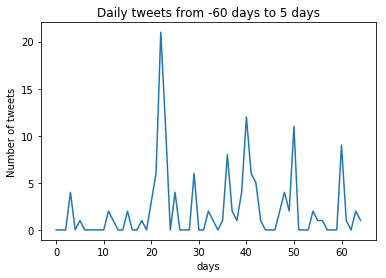





account_name: Invuity event_date: 2015-05-13
start_date: 2015-03-14 end_date: 2015-05-18
Sum of tweets: 4
account_name: iRobot event_date: 2013-05-03
start_date: 2013-03-04 end_date: 2013-05-08
Sum of tweets: 1891


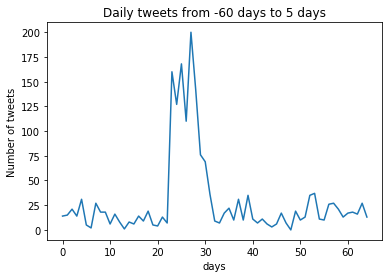





account_name: IronMountain event_date: 2017-02-23
start_date: 2016-12-25 end_date: 2017-02-28
Sum of tweets: 432


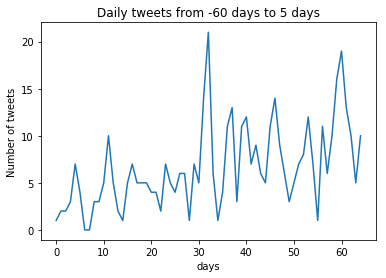





account_name: IronMountain event_date: 2014-07-31
start_date: 2014-06-01 end_date: 2014-08-05
Sum of tweets: 540


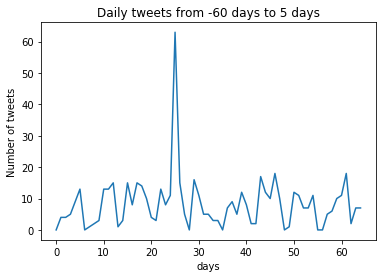





account_name: ItronInc event_date: 2016-03-01
start_date: 2016-01-01 end_date: 2016-03-06
Sum of tweets: 161


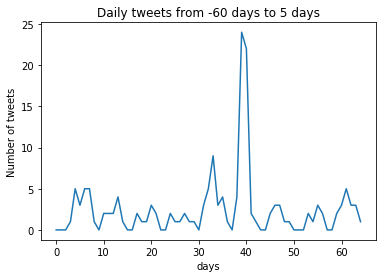





account_name: ITT_Inc event_date: 2013-02-27
start_date: 2012-12-29 end_date: 2013-03-04
Sum of tweets: 7
account_name: IXIAcom event_date: 2014-03-04
start_date: 2014-01-03 end_date: 2014-03-09
Sum of tweets: 305


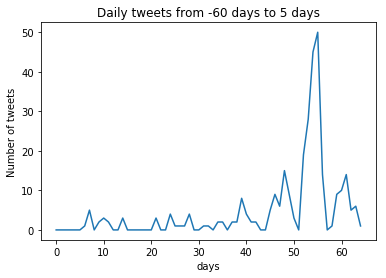





account_name: IXIAcom event_date: 2013-03-19
start_date: 2013-01-18 end_date: 2013-03-24
Sum of tweets: 186


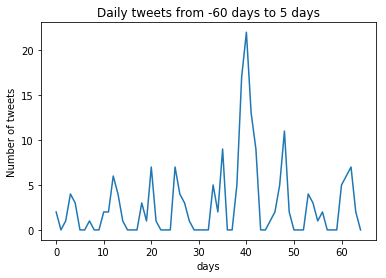





account_name: JambaJuice event_date: 2014-03-10
start_date: 2014-01-09 end_date: 2014-03-15
Sum of tweets: 12025


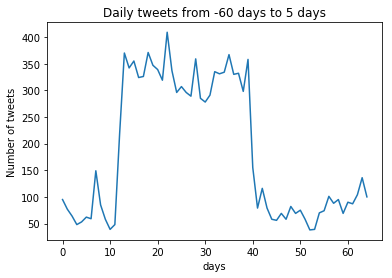





account_name: JD_Corporate event_date: 2017-05-01
start_date: 2017-03-02 end_date: 2017-05-06
Sum of tweets: 120


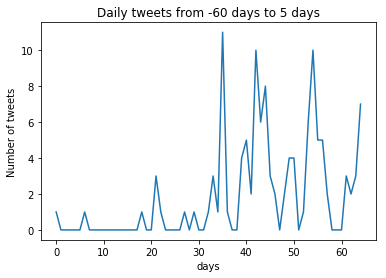





account_name: JELDWEN event_date: 2017-11-08
start_date: 2017-09-09 end_date: 2017-11-13
Sum of tweets: 295


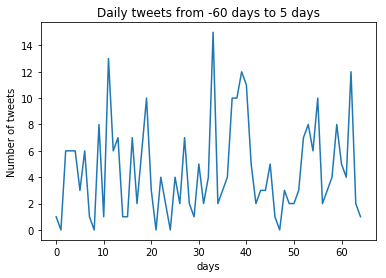





account_name: JELDWEN event_date: 2017-05-09
start_date: 2017-03-10 end_date: 2017-05-14
Sum of tweets: 199


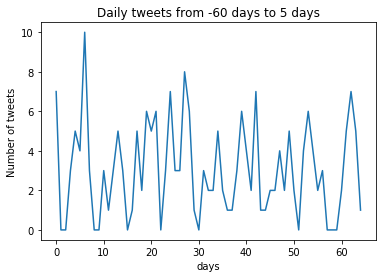





account_name: JELDWEN event_date: 2017-03-03
start_date: 2017-01-02 end_date: 2017-03-08
Sum of tweets: 240


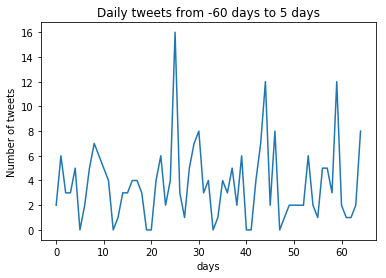





account_name: JELDWEN event_date: 2016-06-01
start_date: 2016-04-02 end_date: 2016-06-06
Sum of tweets: 261


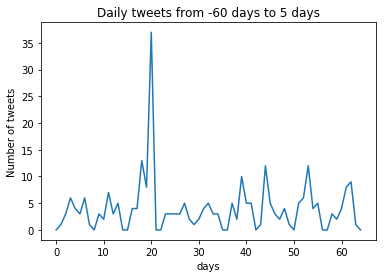





account_name: deanjernigan event_date: 2015-11-12
start_date: 2015-09-13 end_date: 2015-11-17
Sum of tweets: 45
account_name: JinkoSolarCoLtd event_date: 2013-04-30
start_date: 2013-03-01 end_date: 2013-05-05
Sum of tweets: 0
account_name: johnsoncontrols event_date: 2015-11-13
start_date: 2015-09-14 end_date: 2015-11-18
Sum of tweets: 682


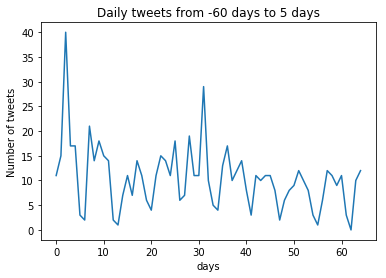





account_name: jonesenergy event_date: 2017-11-08
start_date: 2017-09-09 end_date: 2017-11-13
Sum of tweets: 1
account_name: jonesenergy event_date: 2017-08-07
start_date: 2017-06-08 end_date: 2017-08-12
Sum of tweets: 1
account_name: jonesenergy event_date: 2015-05-08
start_date: 2015-03-09 end_date: 2015-05-13
Sum of tweets: 1
account_name: jonesenergy event_date: 2015-02-25
start_date: 2014-12-27 end_date: 2015-03-02
Sum of tweets: 2
account_name: jonesenergy event_date: 2014-03-14
start_date: 2014-01-13 end_date: 2014-03-19
Sum of tweets: 0
account_name: KansasCityLife event_date: 2013-11-08
start_date: 2013-09-09 end_date: 2013-11-13
Sum of tweets: 136


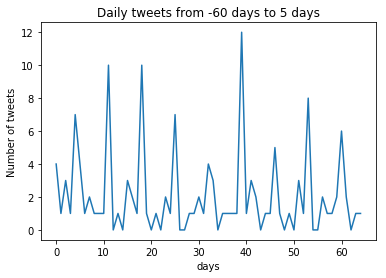





account_name: KBRincorporated event_date: 2014-05-05
start_date: 2014-03-06 end_date: 2014-05-10
Sum of tweets: 0
account_name: KelloggCompany event_date: 2016-05-09
start_date: 2016-03-10 end_date: 2016-05-14
Sum of tweets: 993


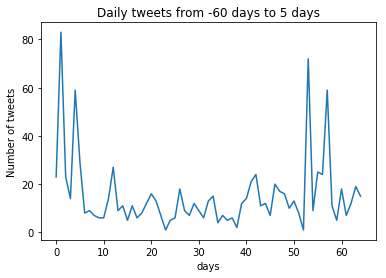





account_name: Kennametal event_date: 2015-02-03
start_date: 2014-12-05 end_date: 2015-02-08
Sum of tweets: 1236


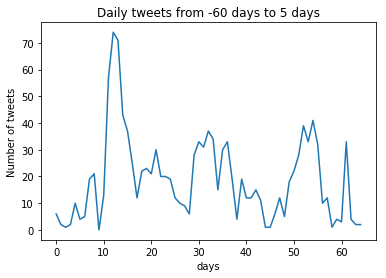





account_name: keywcorp event_date: 2016-02-24
start_date: 2015-12-26 end_date: 2016-02-29
Sum of tweets: 15
account_name: keywcorp event_date: 2015-11-09
start_date: 2015-09-10 end_date: 2015-11-14
Sum of tweets: 51
account_name: keywcorp event_date: 2015-03-09
start_date: 2015-01-08 end_date: 2015-03-14
Sum of tweets: 14
account_name: kindredhealth event_date: 2016-08-05
start_date: 2016-06-06 end_date: 2016-08-10
Sum of tweets: 109


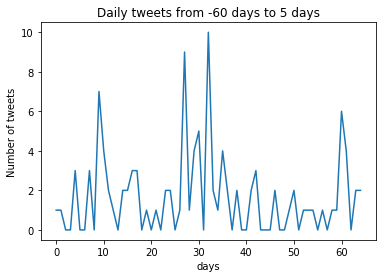





account_name: Knoll_Inc event_date: 2015-03-02
start_date: 2015-01-01 end_date: 2015-03-07
Sum of tweets: 633


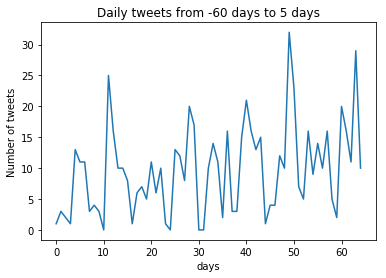





account_name: Kohls event_date: 2015-06-05
start_date: 2015-04-06 end_date: 2015-06-10
Sum of tweets: 16220


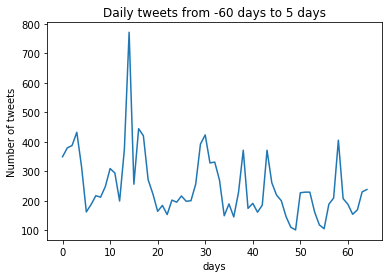





account_name: Kohls event_date: 2013-06-07
start_date: 2013-04-08 end_date: 2013-06-12
Sum of tweets: 18051


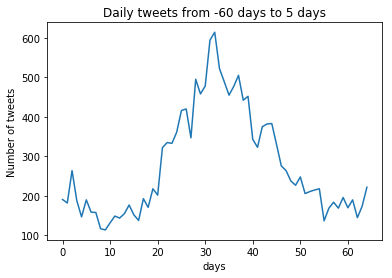





account_name: kopin event_date: 2016-11-04
start_date: 2016-09-05 end_date: 2016-11-09
Sum of tweets: 20
account_name: kopin event_date: 2015-05-11
start_date: 2015-03-12 end_date: 2015-05-16
Sum of tweets: 20
account_name: KosmosEnergy event_date: 2013-01-31
start_date: 2012-12-02 end_date: 2013-02-05
Sum of tweets: 2
account_name: KraftHeinzCo event_date: 2017-11-06
start_date: 2017-09-07 end_date: 2017-11-11
Sum of tweets: 1323


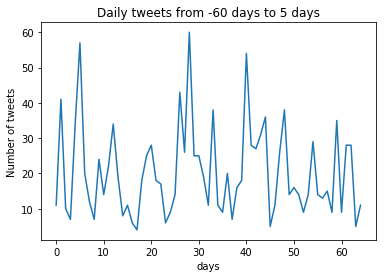





account_name: KraftHeinzCo event_date: 2015-11-06
start_date: 2015-09-07 end_date: 2015-11-11
Sum of tweets: 384


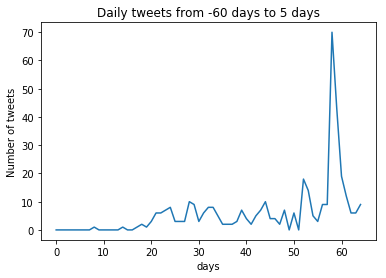





account_name: krispykreme event_date: 2013-04-19
start_date: 2013-02-18 end_date: 2013-04-24
Sum of tweets: 8012


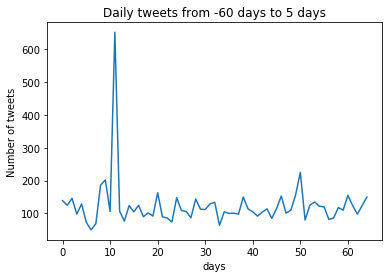





account_name: KytheraBiopharm event_date: 2013-09-25
start_date: 2013-07-27 end_date: 2013-09-30
Sum of tweets: 0
account_name: LABCORP event_date: 2017-02-27
start_date: 2016-12-29 end_date: 2017-03-04
Sum of tweets: 164


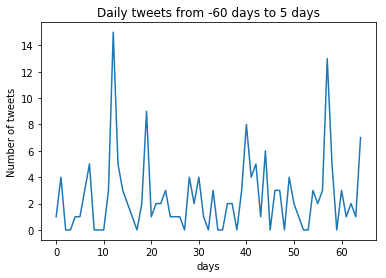





account_name: LadenburgLTS event_date: 2017-03-16
start_date: 2017-01-15 end_date: 2017-03-21
Sum of tweets: 11
account_name: Lakelandind event_date: 2015-05-18
start_date: 2015-03-19 end_date: 2015-05-23
Sum of tweets: 12
account_name: LamarOOH event_date: 2014-02-27
start_date: 2013-12-29 end_date: 2014-03-04
Sum of tweets: 569


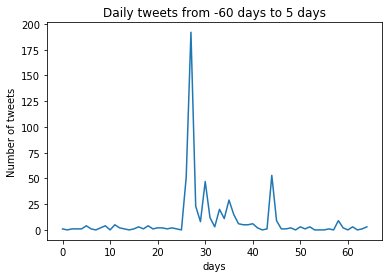





account_name: Leaf_grp event_date: 2015-03-16
start_date: 2015-01-15 end_date: 2015-03-21
Sum of tweets: 72
account_name: LeapFrog event_date: 2014-11-10
start_date: 2014-09-11 end_date: 2014-11-15
Sum of tweets: 3579


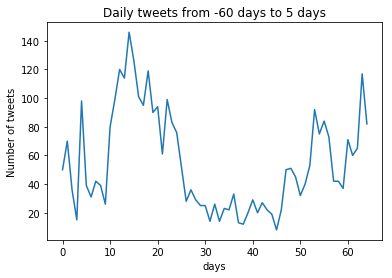





account_name: LeapFrog event_date: 2014-05-07
start_date: 2014-03-08 end_date: 2014-05-12
Sum of tweets: 777


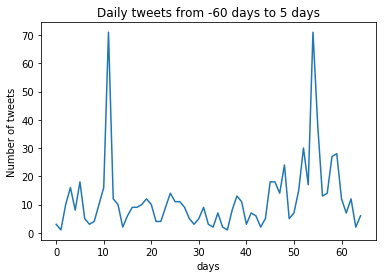





account_name: LegacyTexasBank event_date: 2014-02-26
start_date: 2013-12-28 end_date: 2014-03-03
Sum of tweets: 0
account_name: LendingClub event_date: 2014-03-31
start_date: 2014-01-30 end_date: 2014-04-05
Sum of tweets: 385


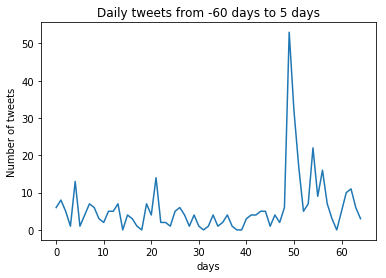





account_name: LendingTree event_date: 2013-05-16
start_date: 2013-03-17 end_date: 2013-05-21
Sum of tweets: 518


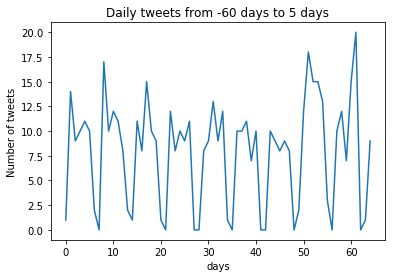





account_name: Lennar event_date: 2013-08-01
start_date: 2013-06-02 end_date: 2013-08-06
Sum of tweets: 2146


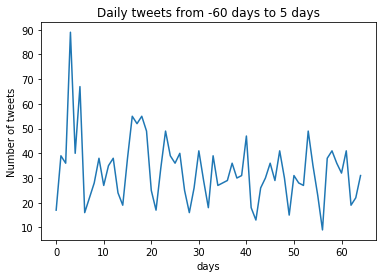





account_name: lxpnyc1993 event_date: 2017-03-01
start_date: 2016-12-31 end_date: 2017-03-06
Sum of tweets: 11
account_name: lexmark event_date: 2015-11-09
start_date: 2015-09-10 end_date: 2015-11-14
Sum of tweets: 427


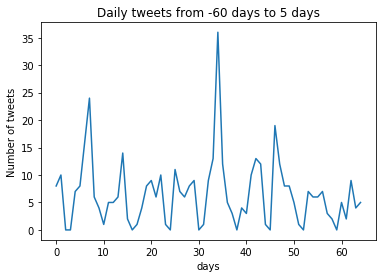





account_name: lexmark event_date: 2014-05-02
start_date: 2014-03-03 end_date: 2014-05-07
Sum of tweets: 266


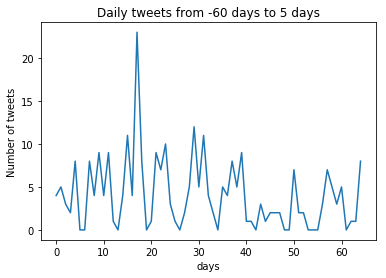





account_name: lexmark event_date: 2014-03-03
start_date: 2014-01-02 end_date: 2014-03-08
Sum of tweets: 182


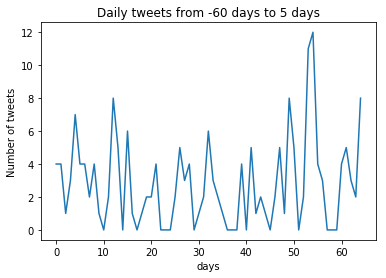





account_name: LibPropTrust event_date: 2017-03-01
start_date: 2016-12-31 end_date: 2017-03-06
Sum of tweets: 21
account_name: LibPropTrust event_date: 2015-11-04
start_date: 2015-09-05 end_date: 2015-11-09
Sum of tweets: 132


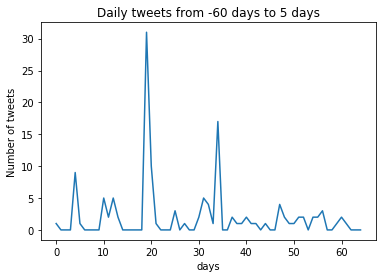





account_name: libertytax event_date: 2013-07-23
start_date: 2013-05-24 end_date: 2013-07-28
Sum of tweets: 111


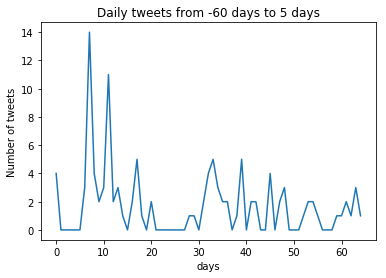





account_name: LifeStorage event_date: 2015-11-04
start_date: 2015-09-05 end_date: 2015-11-09
Sum of tweets: 192


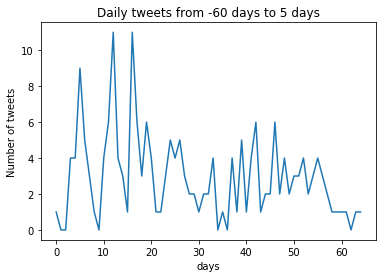





account_name: LifeLock event_date: 2014-11-10
start_date: 2014-09-11 end_date: 2014-11-15
Sum of tweets: 1864


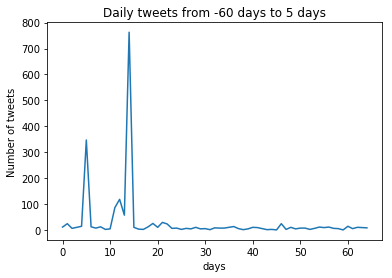





account_name: lifevantage event_date: 2017-09-07
start_date: 2017-07-09 end_date: 2017-09-12
Sum of tweets: 106


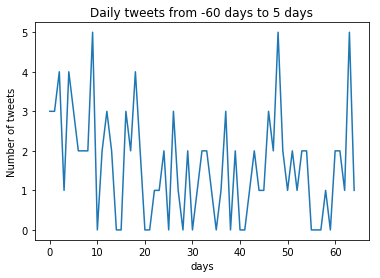





account_name: lifeway_kefir event_date: 2016-11-08
start_date: 2016-09-09 end_date: 2016-11-13
Sum of tweets: 705


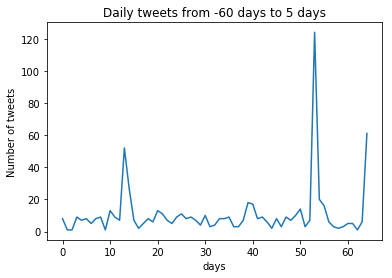





account_name: lifeway_kefir event_date: 2016-08-15
start_date: 2016-06-16 end_date: 2016-08-20
Sum of tweets: 726


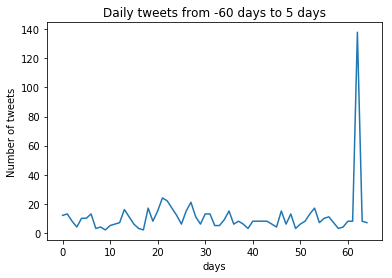





account_name: lifeway_kefir event_date: 2013-04-01
start_date: 2013-01-31 end_date: 2013-04-06
Sum of tweets: 747


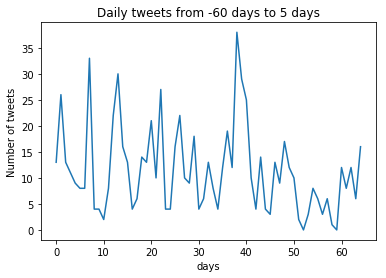





account_name: Ligand_LGND event_date: 2016-11-09
start_date: 2016-09-10 end_date: 2016-11-14
Sum of tweets: 13
account_name: Ligand_LGND event_date: 2016-02-26
start_date: 2015-12-28 end_date: 2016-03-02
Sum of tweets: 8
account_name: LightbridgeCorp event_date: 2015-09-14
start_date: 2015-07-16 end_date: 2015-09-19
Sum of tweets: 47
account_name: llnw event_date: 2014-02-20
start_date: 2013-12-22 end_date: 2014-02-25
Sum of tweets: 284


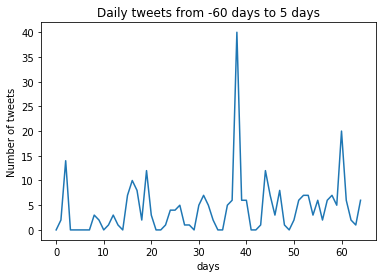





account_name: LimoneiraCo event_date: 2015-03-09
start_date: 2015-01-08 end_date: 2015-03-14
Sum of tweets: 54
account_name: LimoneiraCo event_date: 2015-01-12
start_date: 2014-11-13 end_date: 2015-01-17
Sum of tweets: 84
account_name: lincolnfingroup event_date: 2013-02-06
start_date: 2012-12-08 end_date: 2013-02-11
Sum of tweets: 58
account_name: Littelfuse event_date: 2016-08-05
start_date: 2016-06-06 end_date: 2016-08-10
Sum of tweets: 92
account_name: Littelfuse event_date: 2014-02-05
start_date: 2013-12-07 end_date: 2014-02-10
Sum of tweets: 51
account_name: LiveOakBank event_date: 2015-06-19
start_date: 2015-04-20 end_date: 2015-06-24
Sum of tweets: 75
account_name: Logitech event_date: 2014-05-22
start_date: 2014-03-23 end_date: 2014-05-27
Sum of tweets: 4793


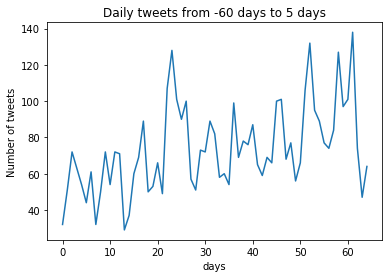





account_name: Logitech event_date: 2013-08-07
start_date: 2013-06-08 end_date: 2013-08-12
Sum of tweets: 3266


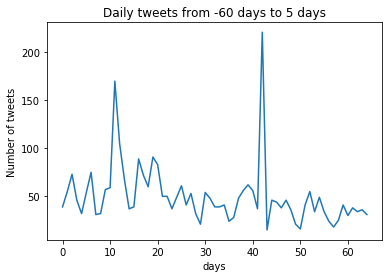





account_name: loopindustries event_date: 2016-01-19
start_date: 2015-11-20 end_date: 2016-01-24
Sum of tweets: 113


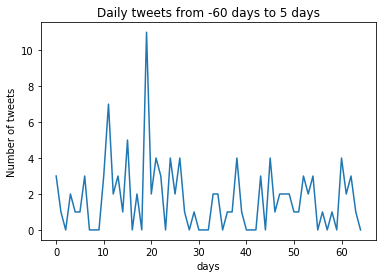





account_name: lubys event_date: 2014-03-24
start_date: 2014-01-23 end_date: 2014-03-29
Sum of tweets: 344


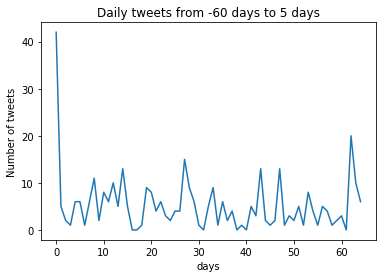





account_name: Lumentum event_date: 2016-02-04
start_date: 2015-12-06 end_date: 2016-02-09
Sum of tweets: 103


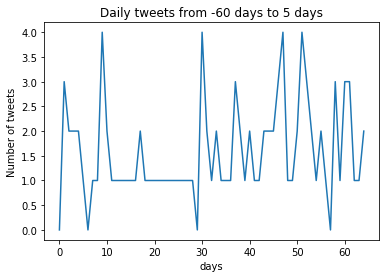





account_name: Lumentum event_date: 2015-09-25
start_date: 2015-07-27 end_date: 2015-09-30
Sum of tweets: 121


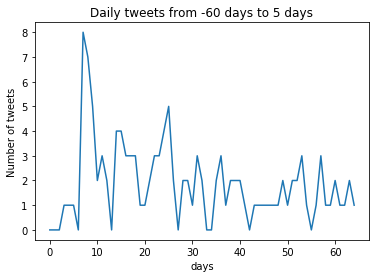





account_name: Luminex event_date: 2015-02-25
start_date: 2014-12-27 end_date: 2015-03-02
Sum of tweets: 115


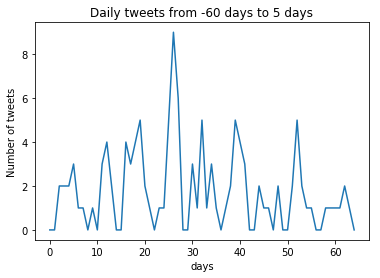





account_name: lunainnovations event_date: 2015-08-14
start_date: 2015-06-15 end_date: 2015-08-19
Sum of tweets: 8
account_name: MabVaxThera event_date: 2015-03-25
start_date: 2015-01-24 end_date: 2015-03-30
Sum of tweets: 41
account_name: MACOMtweets event_date: 2015-08-12
start_date: 2015-06-13 end_date: 2015-08-17
Sum of tweets: 23
account_name: MagneGas event_date: 2017-03-31
start_date: 2017-01-30 end_date: 2017-04-05
Sum of tweets: 95
account_name: MagyarBank event_date: 2017-12-21
start_date: 2017-10-22 end_date: 2017-12-26
Sum of tweets: 16
account_name: malibuboats event_date: 2017-05-03
start_date: 2017-03-04 end_date: 2017-05-08
Sum of tweets: 250


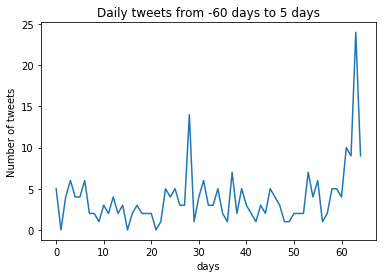





account_name: malibuboats event_date: 2015-11-03
start_date: 2015-09-04 end_date: 2015-11-08
Sum of tweets: 273


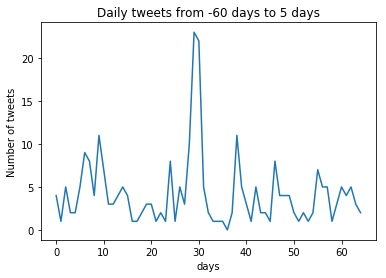





account_name: ManitowocCo event_date: 2017-02-28
start_date: 2016-12-30 end_date: 2017-03-05
Sum of tweets: 109


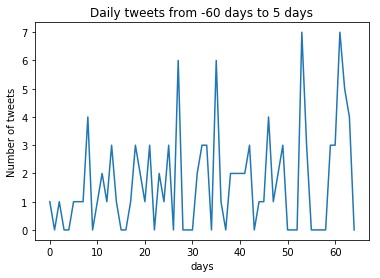





account_name: ManitowocCo event_date: 2016-08-09
start_date: 2016-06-10 end_date: 2016-08-14
Sum of tweets: 82
account_name: ManningNapier event_date: 2016-11-07
start_date: 2016-09-08 end_date: 2016-11-12
Sum of tweets: 73
account_name: MannKindCorp event_date: 2017-05-10
start_date: 2017-03-11 end_date: 2017-05-15
Sum of tweets: 575


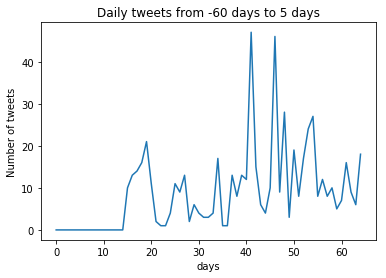





account_name: MarathonPetroCo event_date: 2016-05-02
start_date: 2016-03-03 end_date: 2016-05-07
Sum of tweets: 235


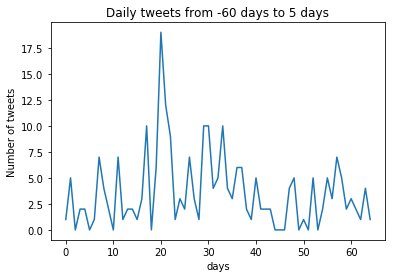





account_name: MarriottVAC event_date: 2017-02-23
start_date: 2016-12-25 end_date: 2017-02-28
Sum of tweets: 4
account_name: MarriottVAC event_date: 2016-02-25
start_date: 2015-12-27 end_date: 2016-03-01
Sum of tweets: 11
account_name: MarriottVAC event_date: 2013-07-18
start_date: 2013-05-19 end_date: 2013-07-23
Sum of tweets: 0
account_name: MarriottVAC event_date: 2013-02-22
start_date: 2012-12-24 end_date: 2013-02-27
Sum of tweets: 0
account_name: MarroneBio event_date: 2014-09-03
start_date: 2014-07-05 end_date: 2014-09-08
Sum of tweets: 45
account_name: MarroneBio event_date: 2014-03-25
start_date: 2014-01-24 end_date: 2014-03-30
Sum of tweets: 74
account_name: marvellsemi event_date: 2016-09-08
start_date: 2016-07-10 end_date: 2016-09-13
Sum of tweets: 98
account_name: MastercardNews event_date: 2016-04-28
start_date: 2016-02-28 end_date: 2016-05-03
Sum of tweets: 935


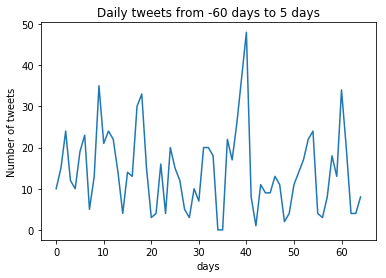





account_name: MastercardNews event_date: 2015-04-29
start_date: 2015-02-28 end_date: 2015-05-04
Sum of tweets: 1594


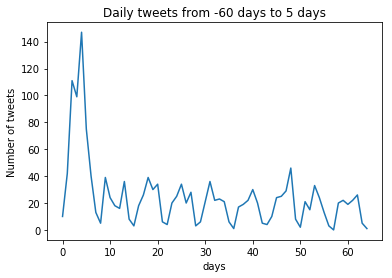





account_name: MaterionCorp event_date: 2015-10-29
start_date: 2015-08-30 end_date: 2015-11-03
Sum of tweets: 126


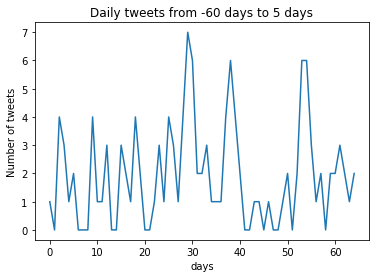





account_name: MaterionCorp event_date: 2014-02-26
start_date: 2013-12-28 end_date: 2014-03-03
Sum of tweets: 0
account_name: MattressFirm event_date: 2015-04-03
start_date: 2015-02-02 end_date: 2015-04-08
Sum of tweets: 1361


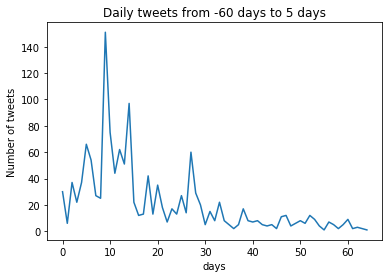





account_name: Mavenir event_date: 2014-05-08
start_date: 2014-03-09 end_date: 2014-05-13
Sum of tweets: 73
account_name: MAXIMUS_news event_date: 2013-11-19
start_date: 2013-09-20 end_date: 2013-11-24
Sum of tweets: 55
account_name: Maxwell_Tech event_date: 2013-03-07
start_date: 2013-01-06 end_date: 2013-03-12
Sum of tweets: 8
account_name: mcclatchy event_date: 2015-03-13
start_date: 2015-01-12 end_date: 2015-03-18
Sum of tweets: 26
account_name: mcclatchy event_date: 2013-05-10
start_date: 2013-03-11 end_date: 2013-05-15
Sum of tweets: 21
account_name: McEwenMining event_date: 2014-04-25
start_date: 2014-02-24 end_date: 2014-04-30
Sum of tweets: 75
account_name: McEwenMining event_date: 2013-05-08
start_date: 2013-03-09 end_date: 2013-05-13
Sum of tweets: 49
account_name: MDCPartners event_date: 2017-08-14
start_date: 2017-06-15 end_date: 2017-08-19
Sum of tweets: 152


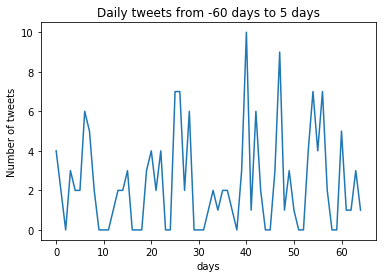





account_name: MDCPartners event_date: 2017-05-02
start_date: 2017-03-03 end_date: 2017-05-07
Sum of tweets: 183


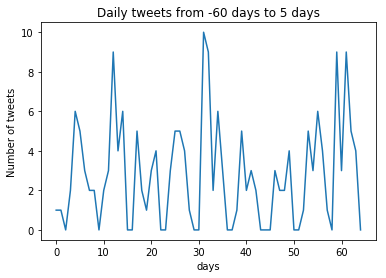





account_name: MTBC_UniqHIT event_date: 2015-03-27
start_date: 2015-01-26 end_date: 2015-04-01
Sum of tweets: 6
account_name: MTBC_UniqHIT event_date: 2014-08-28
start_date: 2014-06-29 end_date: 2014-09-02
Sum of tweets: 6
account_name: MEDNAX event_date: 2014-05-01
start_date: 2014-03-02 end_date: 2014-05-06
Sum of tweets: 13
account_name: mellanoxtech event_date: 2016-02-26
start_date: 2015-12-28 end_date: 2016-03-02
Sum of tweets: 340


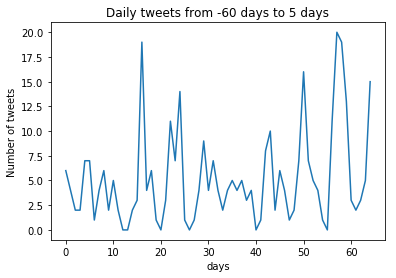





account_name: mellanoxtech event_date: 2015-03-02
start_date: 2015-01-01 end_date: 2015-03-07
Sum of tweets: 224


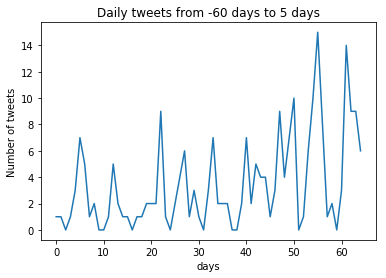





account_name: mellanoxtech event_date: 2014-11-12
start_date: 2014-09-13 end_date: 2014-11-17
Sum of tweets: 353


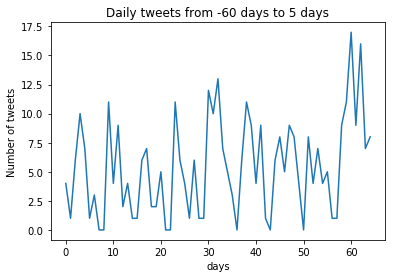





account_name: mellanoxtech event_date: 2014-02-28
start_date: 2013-12-30 end_date: 2014-03-05
Sum of tweets: 300


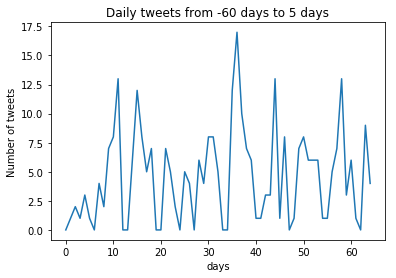





account_name: Meritor event_date: 2016-12-01
start_date: 2016-10-02 end_date: 2016-12-06
Sum of tweets: 495


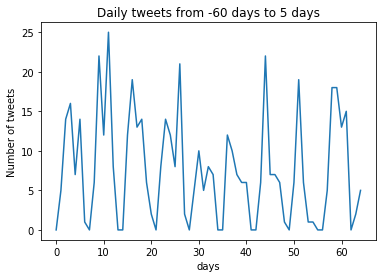





account_name: mesalabsinc event_date: 2013-06-06
start_date: 2013-04-07 end_date: 2013-06-11
Sum of tweets: 103


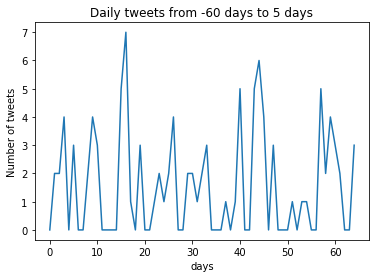





account_name: MGMResortsIntl event_date: 2013-05-08
start_date: 2013-03-09 end_date: 2013-05-13
Sum of tweets: 0
account_name: mgpi4f8f06edcd event_date: 2017-03-08
start_date: 2017-01-07 end_date: 2017-03-13
Sum of tweets: 0
account_name: MGTCI event_date: 2013-05-16
start_date: 2013-03-17 end_date: 2013-05-21
Sum of tweets: 0
account_name: MichaelsStores event_date: 2013-12-20
start_date: 2013-10-21 end_date: 2013-12-25
Sum of tweets: 6329


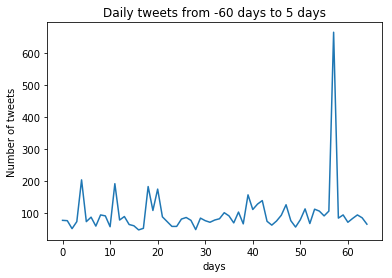





account_name: MicrochipTech event_date: 2014-02-07
start_date: 2013-12-09 end_date: 2014-02-12
Sum of tweets: 319


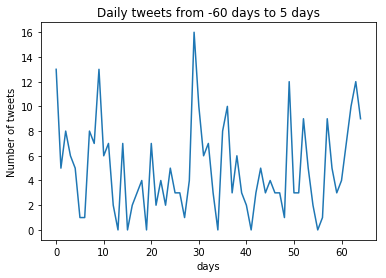





account_name: MidWestOne event_date: 2013-07-25
start_date: 2013-05-26 end_date: 2013-07-30
Sum of tweets: 6
account_name: MiratiTx event_date: 2014-05-15
start_date: 2014-03-16 end_date: 2014-05-20
Sum of tweets: 0
account_name: MistrasGroup event_date: 2015-10-13
start_date: 2015-08-14 end_date: 2015-10-18
Sum of tweets: 8
account_name: Mitel event_date: 2017-03-01
start_date: 2016-12-31 end_date: 2017-03-06
Sum of tweets: 838


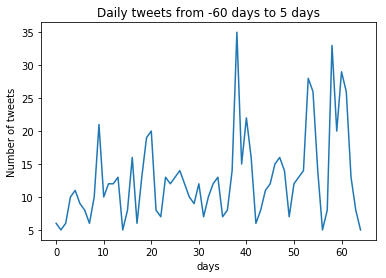





account_name: mksinstruments event_date: 2013-11-06
start_date: 2013-09-07 end_date: 2013-11-11
Sum of tweets: 8
account_name: MobileMini event_date: 2013-02-22
start_date: 2012-12-24 end_date: 2013-02-27
Sum of tweets: 7
account_name: Mobileye event_date: 2014-06-19
start_date: 2014-04-20 end_date: 2014-06-24
Sum of tweets: 65
account_name: Moltemp event_date: 2017-10-17
start_date: 2017-08-18 end_date: 2017-10-22
Sum of tweets: 5
account_name: moleculinbio event_date: 2016-11-15
start_date: 2016-09-16 end_date: 2016-11-20
Sum of tweets: 5
account_name: MolsonCoors event_date: 2017-11-01
start_date: 2017-09-02 end_date: 2017-11-06
Sum of tweets: 1883


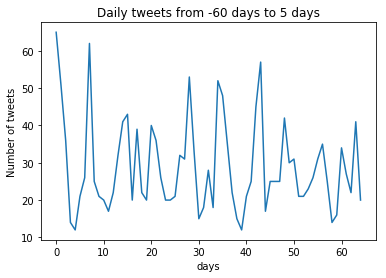





account_name: MolsonCoors event_date: 2017-02-14
start_date: 2016-12-16 end_date: 2017-02-19
Sum of tweets: 806


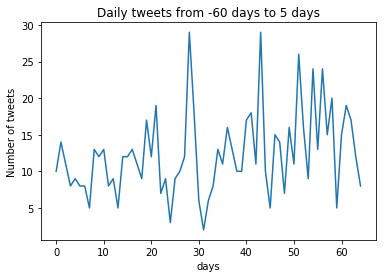





account_name: MolsonCoors event_date: 2014-08-06
start_date: 2014-06-07 end_date: 2014-08-11
Sum of tweets: 1010


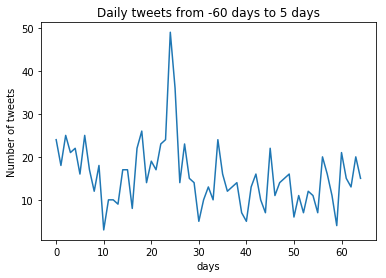





account_name: MolsonCoors event_date: 2013-05-07
start_date: 2013-03-08 end_date: 2013-05-12
Sum of tweets: 1193


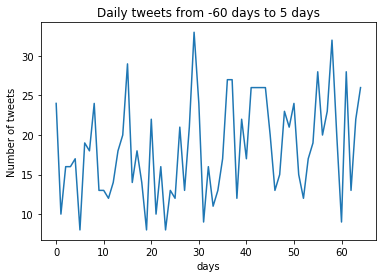





account_name: MolsonCoors event_date: 2013-11-06
start_date: 2013-09-07 end_date: 2013-11-11
Sum of tweets: 1304


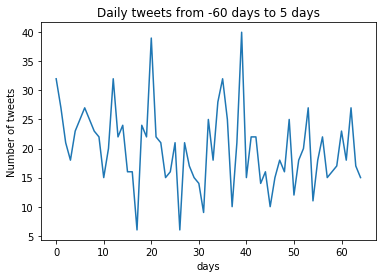





account_name: Molycorp event_date: 2013-08-08
start_date: 2013-06-09 end_date: 2013-08-13
Sum of tweets: 9
account_name: Molycorp event_date: 2013-03-18
start_date: 2013-01-17 end_date: 2013-03-23
Sum of tweets: 19
account_name: MDLZ event_date: 2014-03-03
start_date: 2014-01-02 end_date: 2014-03-08
Sum of tweets: 3
account_name: MoneyGram event_date: 2017-11-02
start_date: 2017-09-03 end_date: 2017-11-07
Sum of tweets: 1656


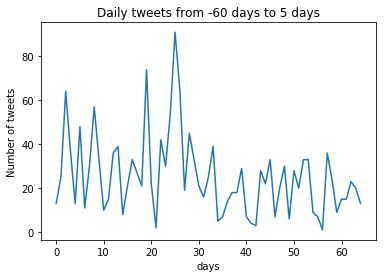





account_name: MoneyGram event_date: 2017-03-15
start_date: 2017-01-14 end_date: 2017-03-20
Sum of tweets: 881


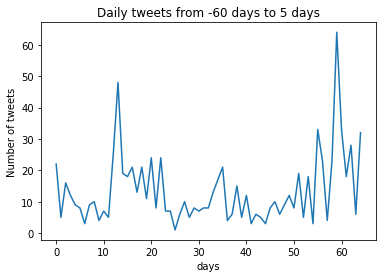





account_name: MonroAutoTire event_date: 2017-05-24
start_date: 2017-03-25 end_date: 2017-05-29
Sum of tweets: 8953


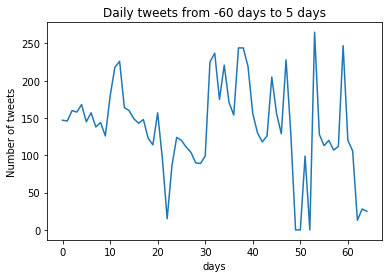





account_name: MonroAutoTire event_date: 2017-02-02
start_date: 2016-12-04 end_date: 2017-02-07
Sum of tweets: 12669


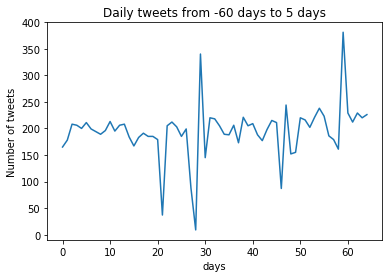





account_name: MonsterEnergy event_date: 2016-11-07
start_date: 2016-09-08 end_date: 2016-11-12
Sum of tweets: 9344


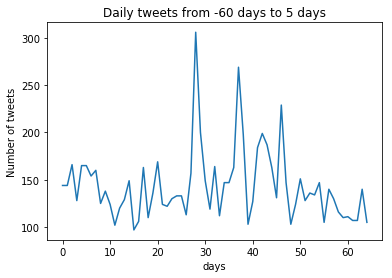





account_name: MorganStanley event_date: 2014-08-05
start_date: 2014-06-06 end_date: 2014-08-10
Sum of tweets: 2359


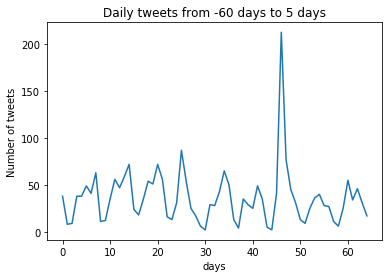





account_name: MorningstarInc event_date: 2014-05-01
start_date: 2014-03-02 end_date: 2014-05-06
Sum of tweets: 1390


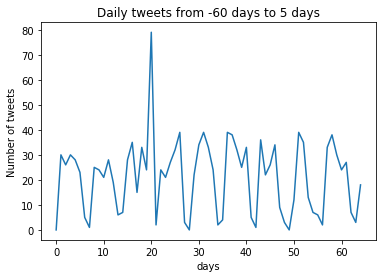





account_name: MosaicCompany event_date: 2015-11-03
start_date: 2015-09-04 end_date: 2015-11-08
Sum of tweets: 280


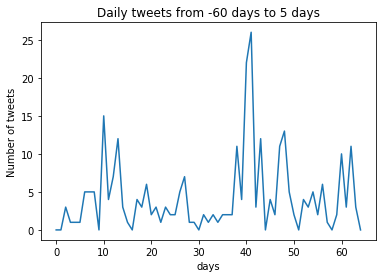





account_name: MPAtweets event_date: 2015-02-09
start_date: 2014-12-11 end_date: 2015-02-14
Sum of tweets: 0
account_name: MSCI_Inc event_date: 2014-08-06
start_date: 2014-06-07 end_date: 2014-08-11
Sum of tweets: 166


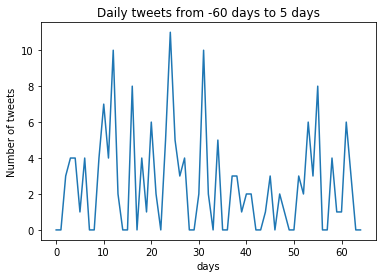





account_name: MurphyUSA event_date: 2014-11-06
start_date: 2014-09-07 end_date: 2014-11-11
Sum of tweets: 708


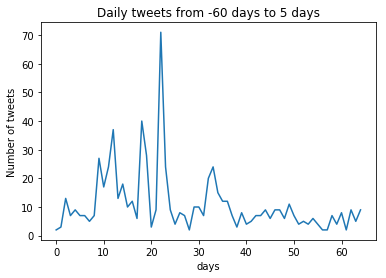





account_name: MYndAnalytics event_date: 2017-08-14
start_date: 2017-06-15 end_date: 2017-08-19
Sum of tweets: 169


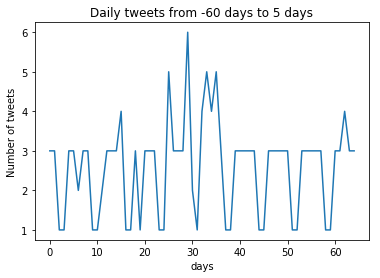





account_name: MYndAnalytics event_date: 2017-03-30
start_date: 2017-01-29 end_date: 2017-04-04
Sum of tweets: 2
account_name: myomoinc event_date: 2017-08-14
start_date: 2017-06-15 end_date: 2017-08-19
Sum of tweets: 96
account_name: myriadgenetics event_date: 2017-11-08
start_date: 2017-09-09 end_date: 2017-11-13
Sum of tweets: 306


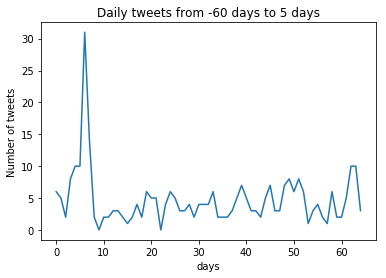





account_name: myriadgenetics event_date: 2014-11-05
start_date: 2014-09-06 end_date: 2014-11-10
Sum of tweets: 564


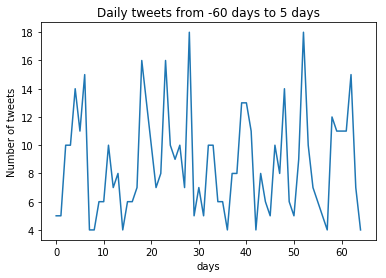





account_name: NaborsGlobal event_date: 2014-05-09
start_date: 2014-03-10 end_date: 2014-05-14
Sum of tweets: 0
account_name: NaborsGlobal event_date: 2014-03-03
start_date: 2014-01-02 end_date: 2014-03-08
Sum of tweets: 0
account_name: NaborsGlobal event_date: 2013-03-01
start_date: 2012-12-31 end_date: 2013-03-06
Sum of tweets: 0
account_name: NantHealth event_date: 2016-08-15
start_date: 2016-06-16 end_date: 2016-08-20
Sum of tweets: 306


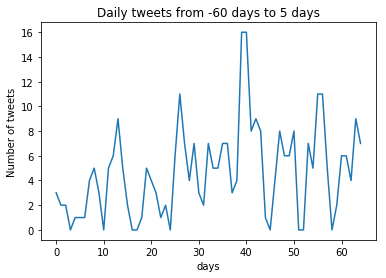





account_name: NantKwest event_date: 2016-03-11
start_date: 2016-01-11 end_date: 2016-03-16
Sum of tweets: 48
account_name: NantKwest event_date: 2015-07-02
start_date: 2015-05-03 end_date: 2015-07-07
Sum of tweets: 0
account_name: NCMNews event_date: 2016-08-09
start_date: 2016-06-10 end_date: 2016-08-14
Sum of tweets: 86
account_name: NHI_REIT event_date: 2017-11-08
start_date: 2017-09-09 end_date: 2017-11-13
Sum of tweets: 5
account_name: Navient event_date: 2017-02-24
start_date: 2016-12-26 end_date: 2017-03-01
Sum of tweets: 2366


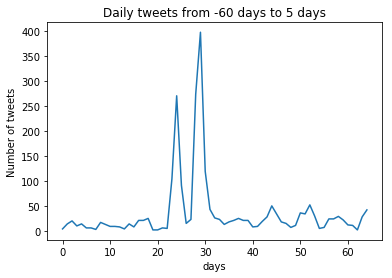





account_name: NCRCorporation event_date: 2013-11-05
start_date: 2013-09-06 end_date: 2013-11-10
Sum of tweets: 436


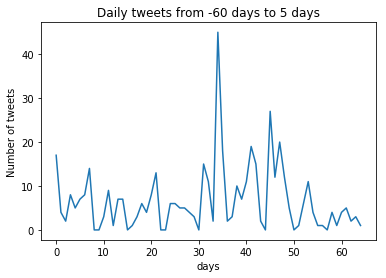





account_name: NeoPhotonics_tw event_date: 2013-08-08
start_date: 2013-06-09 end_date: 2013-08-13
Sum of tweets: 0
account_name: NeoPhotonics_tw event_date: 2013-11-13
start_date: 2013-09-14 end_date: 2013-11-18
Sum of tweets: 0
account_name: neteinc event_date: 2015-02-18
start_date: 2014-12-20 end_date: 2015-02-23
Sum of tweets: 38
account_name: neteinc event_date: 2013-05-15
start_date: 2013-03-16 end_date: 2013-05-20
Sum of tweets: 0
account_name: netflix event_date: 2013-07-25
start_date: 2013-05-26 end_date: 2013-07-30
Sum of tweets: 81917


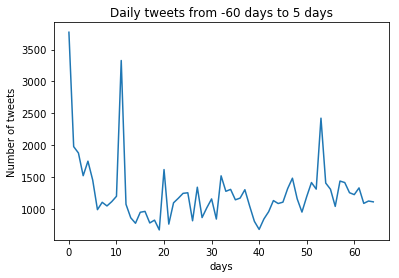





account_name: NETSCOUT event_date: 2016-05-31
start_date: 2016-04-01 end_date: 2016-06-05
Sum of tweets: 770


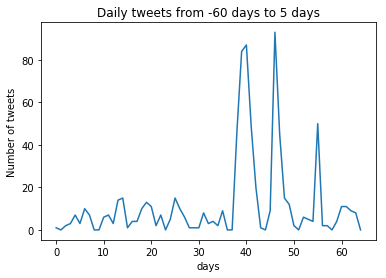





account_name: NETSCOUT event_date: 2015-05-20
start_date: 2015-03-21 end_date: 2015-05-25
Sum of tweets: 351


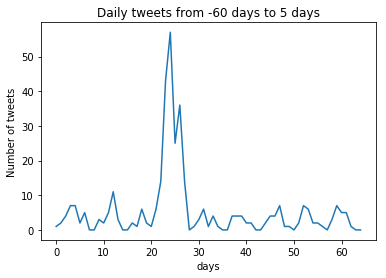





account_name: NETSOLTech event_date: 2017-05-22
start_date: 2017-03-23 end_date: 2017-05-27
Sum of tweets: 32
account_name: NewGoldInc event_date: 2017-04-28
start_date: 2017-02-27 end_date: 2017-05-03
Sum of tweets: 17
account_name: NewResidential event_date: 2015-08-10
start_date: 2015-06-11 end_date: 2015-08-15
Sum of tweets: 0
account_name: NewResidential event_date: 2015-03-02
start_date: 2015-01-01 end_date: 2015-03-07
Sum of tweets: 1
account_name: nytimes event_date: 2013-08-01
start_date: 2013-06-02 end_date: 2013-08-06
Sum of tweets: 299923


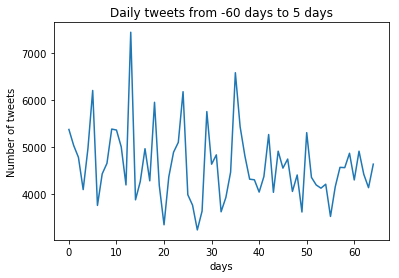





account_name: Newmont event_date: 2014-04-25
start_date: 2014-02-24 end_date: 2014-04-30
Sum of tweets: 279


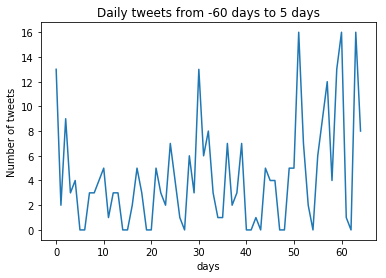





account_name: Newmont event_date: 2013-02-22
start_date: 2012-12-24 end_date: 2013-02-27
Sum of tweets: 199


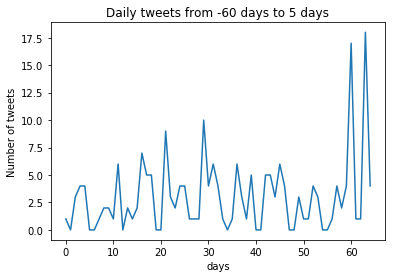





account_name: NewportCorp event_date: 2013-05-09
start_date: 2013-03-10 end_date: 2013-05-14
Sum of tweets: 7
account_name: Nike event_date: 2015-07-23
start_date: 2015-05-24 end_date: 2015-07-28
Sum of tweets: 64585


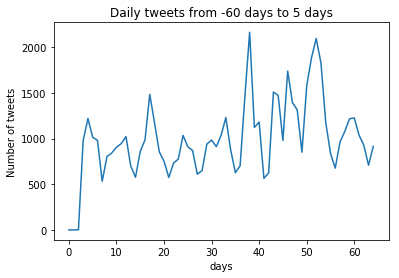





account_name: Nike event_date: 2014-07-25
start_date: 2014-05-26 end_date: 2014-07-30
Sum of tweets: 26060


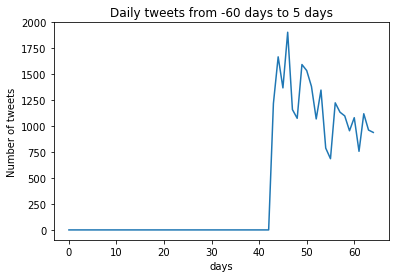





account_name: Nike event_date: 2014-04-07
start_date: 2014-02-06 end_date: 2014-04-12
Sum of tweets: 61611


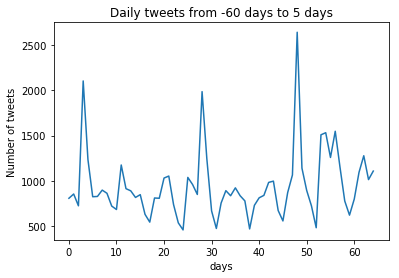





account_name: NationalMI event_date: 2017-05-04
start_date: 2017-03-05 end_date: 2017-05-09
Sum of tweets: 42
account_name: NAEducation event_date: 2016-11-29
start_date: 2016-09-30 end_date: 2016-12-04
Sum of tweets: 164


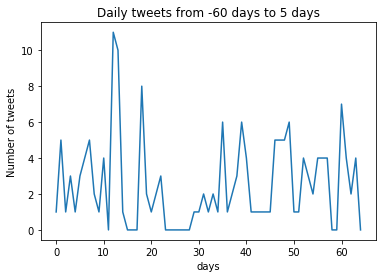





account_name: Nordson_Corp event_date: 2014-12-15
start_date: 2014-10-16 end_date: 2014-12-20
Sum of tweets: 71
account_name: NWSB event_date: 2014-11-07
start_date: 2014-09-08 end_date: 2014-11-12
Sum of tweets: 9
account_name: nwnatural event_date: 2013-05-02
start_date: 2013-03-03 end_date: 2013-05-07
Sum of tweets: 185


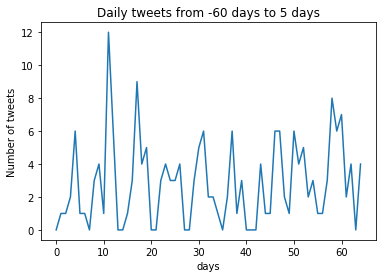





account_name: NXT_ID event_date: 2014-11-19
start_date: 2014-09-20 end_date: 2014-11-24
Sum of tweets: 65
account_name: Oasmia event_date: 2014-05-30
start_date: 2014-03-31 end_date: 2014-06-04
Sum of tweets: 4
account_name: ODFL_Inc event_date: 2013-08-08
start_date: 2013-06-09 end_date: 2013-08-13
Sum of tweets: 32
account_name: Olympic_Steel event_date: 2013-05-03
start_date: 2013-03-04 end_date: 2013-05-08
Sum of tweets: 4
account_name: OmegaProtein event_date: 2015-05-11
start_date: 2015-03-12 end_date: 2015-05-16
Sum of tweets: 10
account_name: OMNOVASolutions event_date: 2017-09-28
start_date: 2017-07-30 end_date: 2017-10-03
Sum of tweets: 13
account_name: onsemi event_date: 2015-02-27
start_date: 2014-12-29 end_date: 2015-03-04
Sum of tweets: 113


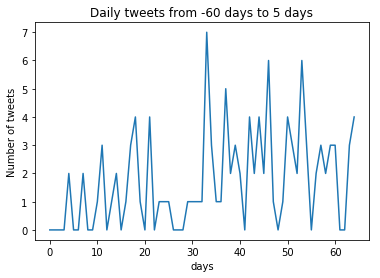





account_name: onsemi event_date: 2013-08-02
start_date: 2013-06-03 end_date: 2013-08-07
Sum of tweets: 55
account_name: OneMain event_date: 2014-05-15
start_date: 2014-03-16 end_date: 2014-05-20
Sum of tweets: 4
account_name: OneMain event_date: 2014-04-01
start_date: 2014-01-31 end_date: 2014-04-06
Sum of tweets: 0
account_name: OneMain event_date: 2013-11-12
start_date: 2013-09-13 end_date: 2013-11-17
Sum of tweets: 5
account_name: OneSpan event_date: 2017-02-14
start_date: 2016-12-16 end_date: 2017-02-19
Sum of tweets: 59
account_name: ORBCOMM_Inc event_date: 2015-05-07
start_date: 2015-03-08 end_date: 2015-05-12
Sum of tweets: 127


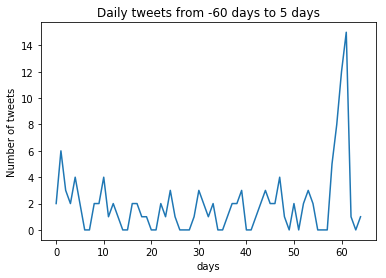





account_name: northropgrumman event_date: 2016-08-10
start_date: 2016-06-11 end_date: 2016-08-15
Sum of tweets: 1047


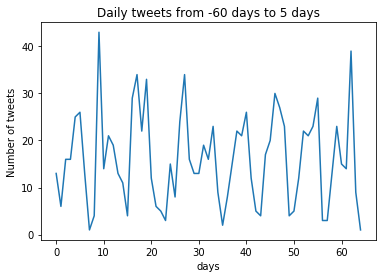





account_name: northropgrumman event_date: 2016-02-29
start_date: 2015-12-31 end_date: 2016-03-05
Sum of tweets: 1465


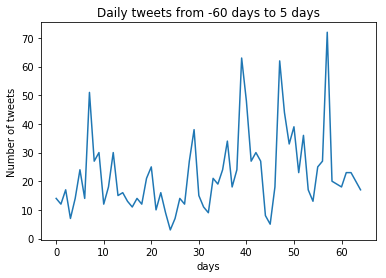





account_name: OUTFRONTMEDIAUS event_date: 2014-11-07
start_date: 2014-09-08 end_date: 2014-11-12
Sum of tweets: 333


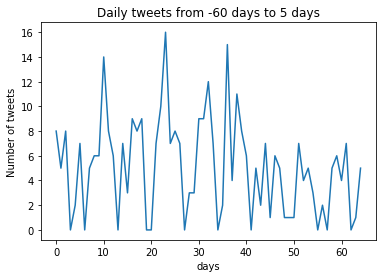





account_name: Overstock event_date: 2014-10-23
start_date: 2014-08-24 end_date: 2014-10-28
Sum of tweets: 1372


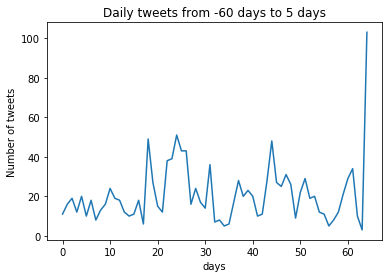





account_name: OwensCorning event_date: 2016-04-27
start_date: 2016-02-27 end_date: 2016-05-02
Sum of tweets: 456


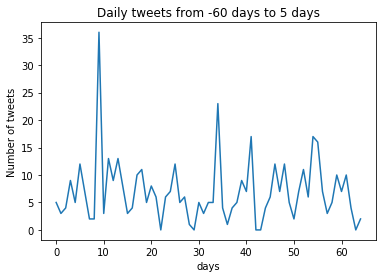





account_name: OwensCorning event_date: 2016-02-10
start_date: 2015-12-12 end_date: 2016-02-15
Sum of tweets: 417


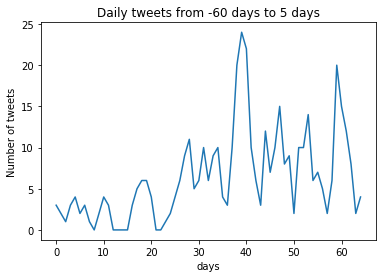





account_name: OwensCorning event_date: 2015-07-22
start_date: 2015-05-23 end_date: 2015-07-27
Sum of tweets: 455


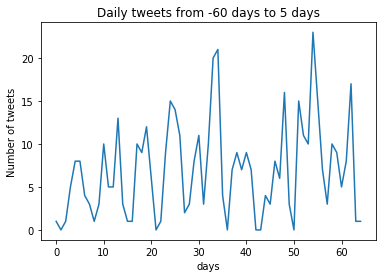





account_name: OwensCorning event_date: 2014-07-23
start_date: 2014-05-24 end_date: 2014-07-28
Sum of tweets: 275


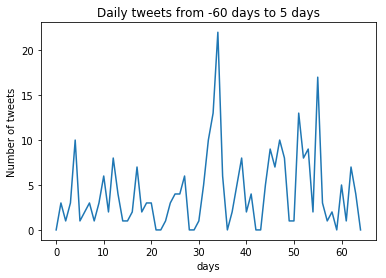





account_name: packagingcorp event_date: 2016-02-26
start_date: 2015-12-28 end_date: 2016-03-02
Sum of tweets: 49
account_name: PapaJohns event_date: 2013-02-26
start_date: 2012-12-28 end_date: 2013-03-03
Sum of tweets: 14507


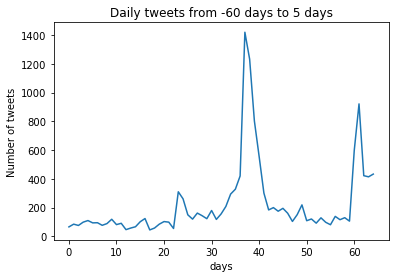





account_name: PAREXEL event_date: 2013-05-06
start_date: 2013-03-07 end_date: 2013-05-11
Sum of tweets: 295


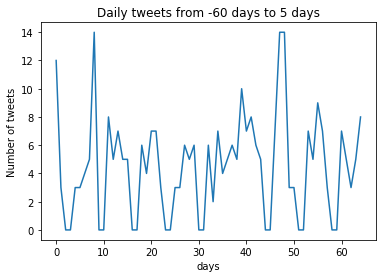





account_name: parkcitygroup event_date: 2015-10-09
start_date: 2015-08-10 end_date: 2015-10-14
Sum of tweets: 3
account_name: PatternEnergy event_date: 2017-03-01
start_date: 2016-12-31 end_date: 2017-03-06
Sum of tweets: 73
account_name: PatternEnergy event_date: 2015-11-05
start_date: 2015-09-06 end_date: 2015-11-10
Sum of tweets: 60
account_name: PatternEnergy event_date: 2015-03-02
start_date: 2015-01-01 end_date: 2015-03-07
Sum of tweets: 134


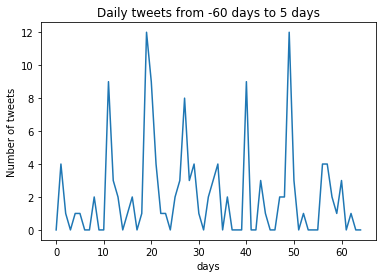





account_name: PatternEnergy event_date: 2014-10-24
start_date: 2014-08-25 end_date: 2014-10-29
Sum of tweets: 70
account_name: PatternEnergy event_date: 2014-08-05
start_date: 2014-06-06 end_date: 2014-08-10
Sum of tweets: 88
account_name: Paychex event_date: 2015-07-21
start_date: 2015-05-22 end_date: 2015-07-26
Sum of tweets: 1233


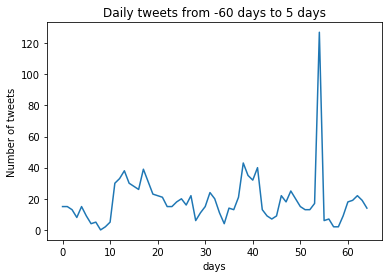





account_name: PCM event_date: 2014-08-11
start_date: 2014-06-12 end_date: 2014-08-16
Sum of tweets: 571


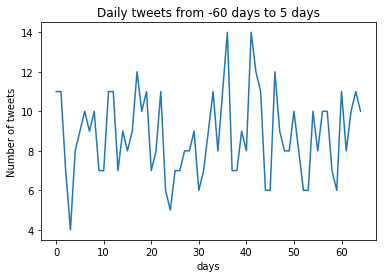





account_name: pdvWireless event_date: 2015-04-27
start_date: 2015-02-26 end_date: 2015-05-02
Sum of tweets: 116


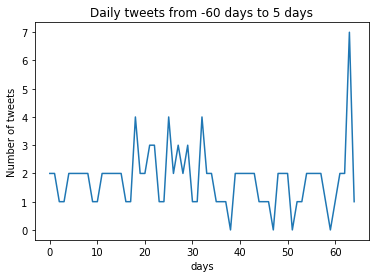





account_name: pdvWireless event_date: 2014-12-19
start_date: 2014-10-20 end_date: 2014-12-24
Sum of tweets: 0
account_name: peabodyenergy event_date: 2017-08-14
start_date: 2017-06-15 end_date: 2017-08-19
Sum of tweets: 74
account_name: PREIT event_date: 2014-02-28
start_date: 2013-12-30 end_date: 2014-03-05
Sum of tweets: 50
account_name: PenskeCars event_date: 2013-02-28
start_date: 2012-12-30 end_date: 2013-03-05
Sum of tweets: 58
account_name: Exelon event_date: 2013-08-07
start_date: 2013-06-08 end_date: 2013-08-12
Sum of tweets: 25
account_name: PernixTX event_date: 2014-05-12
start_date: 2014-03-13 end_date: 2014-05-17
Sum of tweets: 0
account_name: PerrigoCompany event_date: 2017-02-27
start_date: 2016-12-29 end_date: 2017-03-04
Sum of tweets: 10
account_name: PEICorp event_date: 2014-04-15
start_date: 2014-02-14 end_date: 2014-04-20
Sum of tweets: 260


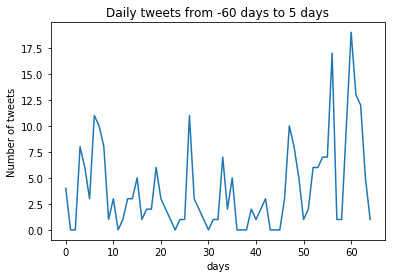





account_name: petrobras event_date: 2017-04-27
start_date: 2017-02-26 end_date: 2017-05-02
Sum of tweets: 1379


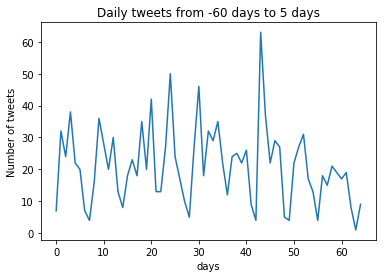





account_name: PetSmart event_date: 2013-05-30
start_date: 2013-03-31 end_date: 2013-06-04
Sum of tweets: 7526


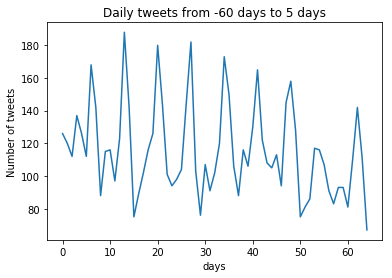





account_name: pier1 event_date: 2016-04-26
start_date: 2016-02-26 end_date: 2016-05-01
Sum of tweets: 1001


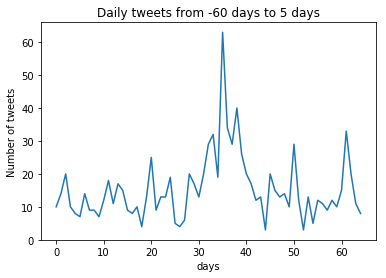





account_name: pier2 event_date: 2015-04-28
start_date: 2015-02-27 end_date: 2015-05-03
Sum of tweets: 0
account_name: pier3 event_date: 2014-10-08
start_date: 2014-08-09 end_date: 2014-10-13
Sum of tweets: 1
account_name: PitneyBowes event_date: 2017-02-22
start_date: 2016-12-24 end_date: 2017-02-27
Sum of tweets: 2464


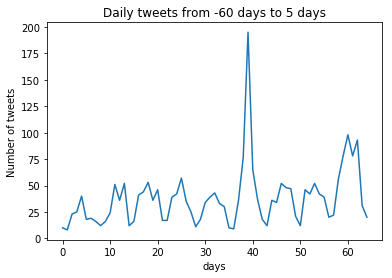





account_name: PitneyBowes event_date: 2016-08-08
start_date: 2016-06-09 end_date: 2016-08-13
Sum of tweets: 2640


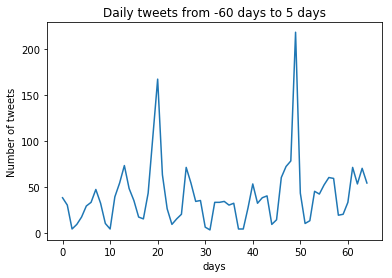





account_name: PitneyBowes event_date: 2016-02-22
start_date: 2015-12-24 end_date: 2016-02-27
Sum of tweets: 2276


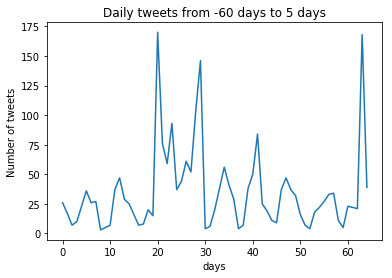





account_name: PitneyBowes event_date: 2015-02-20
start_date: 2014-12-22 end_date: 2015-02-25
Sum of tweets: 1583


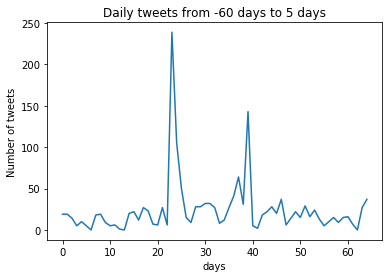





account_name: PitneyBowes event_date: 2015-08-05
start_date: 2015-06-06 end_date: 2015-08-10
Sum of tweets: 2158


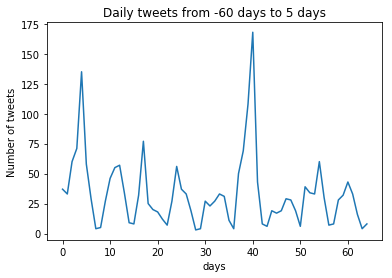





account_name: PitneyBowes event_date: 2014-08-07
start_date: 2014-06-08 end_date: 2014-08-12
Sum of tweets: 1014


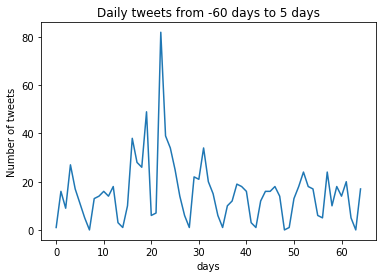





account_name: PitneyBowes event_date: 2013-11-08
start_date: 2013-09-09 end_date: 2013-11-13
Sum of tweets: 483


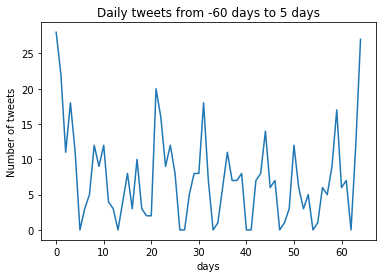





account_name: PlugPowerInc event_date: 2013-04-01
start_date: 2013-01-31 end_date: 2013-04-06
Sum of tweets: 9
account_name: PNCBank event_date: 2016-08-03
start_date: 2016-06-04 end_date: 2016-08-08
Sum of tweets: 2203


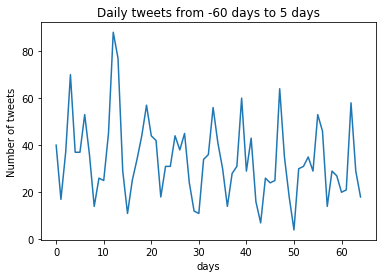





account_name: Polycom event_date: 2014-02-21
start_date: 2013-12-23 end_date: 2014-02-26
Sum of tweets: 995


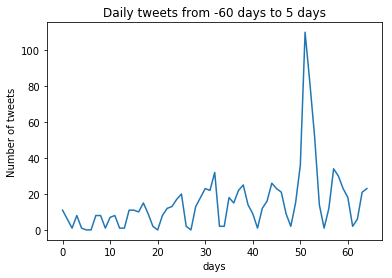





account_name: Polycom event_date: 2013-07-23
start_date: 2013-05-24 end_date: 2013-07-28
Sum of tweets: 788


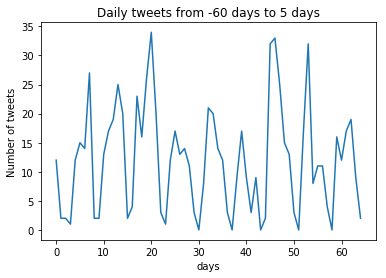





account_name: PopeyesChicken event_date: 2016-08-16
start_date: 2016-06-17 end_date: 2016-08-21
Sum of tweets: 14068


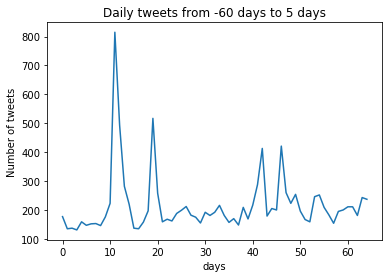





account_name: PopeyesChicken event_date: 2014-05-28
start_date: 2014-03-29 end_date: 2014-06-02
Sum of tweets: 6716


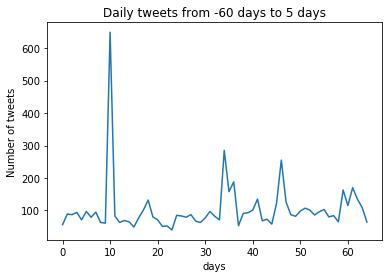





account_name: popular event_date: 2016-05-10
start_date: 2016-03-11 end_date: 2016-05-15
Sum of tweets: 1156


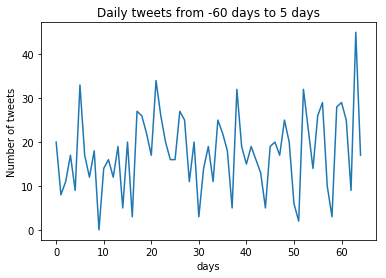





account_name: PwrInt event_date: 2013-02-22
start_date: 2012-12-24 end_date: 2013-02-27
Sum of tweets: 21
account_name: pacapts event_date: 2017-08-07
start_date: 2017-06-08 end_date: 2017-08-12
Sum of tweets: 63
account_name: PremierHA event_date: 2017-08-17
start_date: 2017-06-18 end_date: 2017-08-22
Sum of tweets: 433


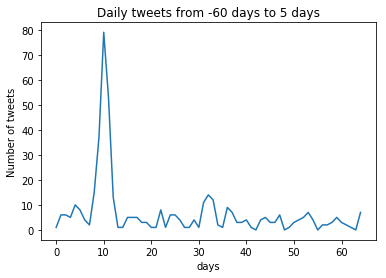





account_name: PremierHA event_date: 2017-02-07
start_date: 2016-12-09 end_date: 2017-02-12
Sum of tweets: 255


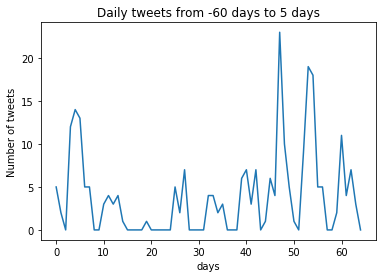





account_name: PremierHA event_date: 2015-05-12
start_date: 2015-03-13 end_date: 2015-05-17
Sum of tweets: 456


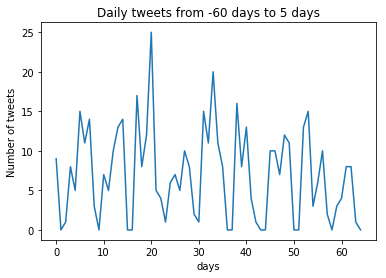





account_name: PremierHA event_date: 2014-09-04
start_date: 2014-07-06 end_date: 2014-09-09
Sum of tweets: 788


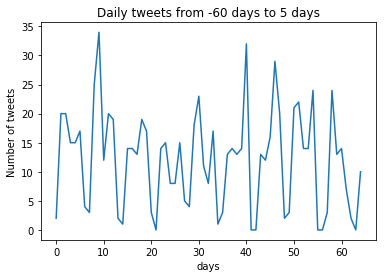





account_name: PremierHA event_date: 2014-02-14
start_date: 2013-12-16 end_date: 2014-02-19
Sum of tweets: 698


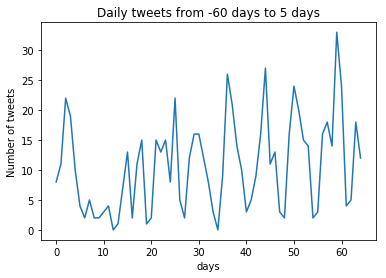





account_name: principal event_date: 2013-04-26
start_date: 2013-02-25 end_date: 2013-05-01
Sum of tweets: 434


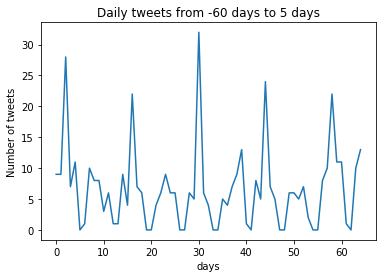





account_name: ProDivNet event_date: 2016-11-14
start_date: 2016-09-15 end_date: 2016-11-19
Sum of tweets: 211


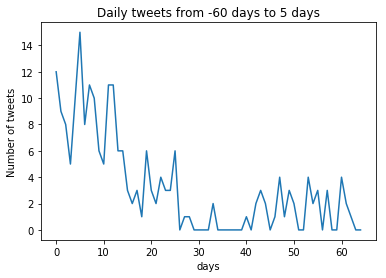





account_name: Progressive event_date: 2013-02-26
start_date: 2012-12-28 end_date: 2013-03-03
Sum of tweets: 1675


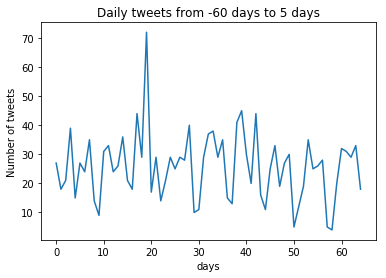





account_name: gcpAppliedTech event_date: 2016-08-15
start_date: 2016-06-16 end_date: 2016-08-20
Sum of tweets: 66
account_name: QAD_Community event_date: 2016-04-15
start_date: 2016-02-15 end_date: 2016-04-20
Sum of tweets: 303


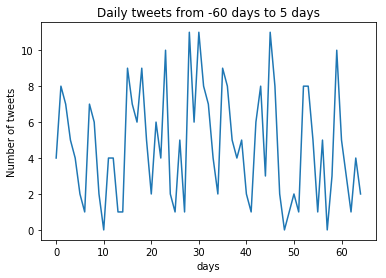





account_name: QorvoInc event_date: 2017-05-23
start_date: 2017-03-24 end_date: 2017-05-28
Sum of tweets: 101


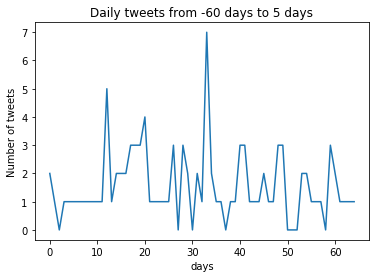





account_name: QualityCarriers event_date: 2014-08-08
start_date: 2014-06-09 end_date: 2014-08-13
Sum of tweets: 9
account_name: qualys event_date: 2015-03-06
start_date: 2015-01-05 end_date: 2015-03-11
Sum of tweets: 458


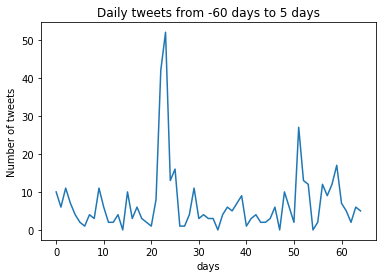





account_name: Quiksilver event_date: 2015-03-04
start_date: 2015-01-03 end_date: 2015-03-09
Sum of tweets: 1467


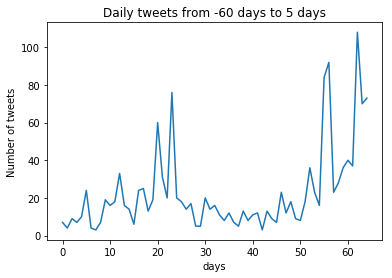





account_name: rrdonnelley event_date: 2017-10-31
start_date: 2017-09-01 end_date: 2017-11-05
Sum of tweets: 64
account_name: RadianMI event_date: 2016-02-26
start_date: 2015-12-28 end_date: 2016-03-02
Sum of tweets: 26
account_name: RadianMI event_date: 2015-05-08
start_date: 2015-03-09 end_date: 2015-05-13
Sum of tweets: 108


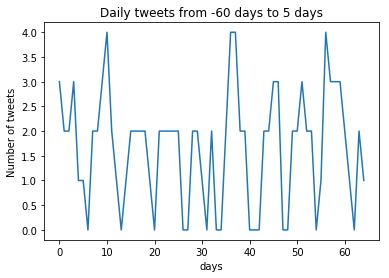





account_name: RadianMI event_date: 2014-02-28
start_date: 2013-12-30 end_date: 2014-03-05
Sum of tweets: 0
account_name: Radius_Health event_date: 2014-04-03
start_date: 2014-02-02 end_date: 2014-04-08
Sum of tweets: 0
account_name: RadNet_Inc event_date: 2013-11-08
start_date: 2013-09-09 end_date: 2013-11-13
Sum of tweets: 5
account_name: RAMCOproperties event_date: 2017-11-03
start_date: 2017-09-04 end_date: 2017-11-08
Sum of tweets: 46
account_name: RAMCOproperties event_date: 2017-02-24
start_date: 2016-12-26 end_date: 2017-03-01
Sum of tweets: 39
account_name: RAMCOproperties event_date: 2015-10-30
start_date: 2015-08-31 end_date: 2015-11-04
Sum of tweets: 0
account_name: RavenIndustries event_date: 2016-09-12
start_date: 2016-07-14 end_date: 2016-09-17
Sum of tweets: 18
account_name: RealNetworks event_date: 2013-03-18
start_date: 2013-01-17 end_date: 2013-03-23
Sum of tweets: 42
account_name: myhellorewards event_date: 2017-03-15
start_date: 2017-01-14 end_date: 2017-03-20
S

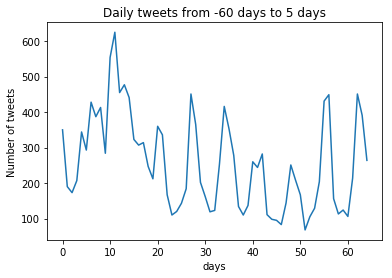





account_name: regencycenters event_date: 2014-05-08
start_date: 2014-03-09 end_date: 2014-05-13
Sum of tweets: 153


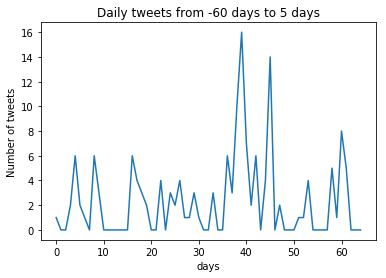





account_name: Regeneron event_date: 2015-05-07
start_date: 2015-03-08 end_date: 2015-05-12
Sum of tweets: 442


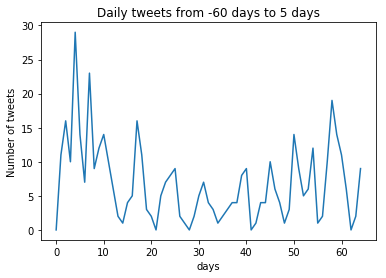





account_name: REGbiofuels event_date: 2016-11-02
start_date: 2016-09-03 end_date: 2016-11-07
Sum of tweets: 62
account_name: REGbiofuels event_date: 2013-11-08
start_date: 2013-09-09 end_date: 2013-11-13
Sum of tweets: 31
account_name: RennovaHealth event_date: 2017-11-20
start_date: 2017-09-21 end_date: 2017-11-25
Sum of tweets: 9
account_name: RennovaHealth event_date: 2016-05-17
start_date: 2016-03-18 end_date: 2016-05-22
Sum of tweets: 20
account_name: RentACenter event_date: 2017-03-01
start_date: 2016-12-31 end_date: 2017-03-06
Sum of tweets: 230


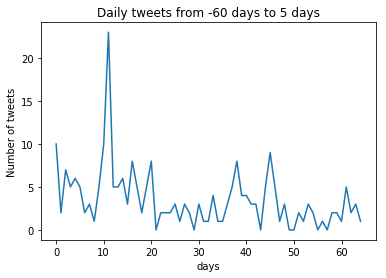





account_name: RentACenter event_date: 2015-03-02
start_date: 2015-01-01 end_date: 2015-03-07
Sum of tweets: 343


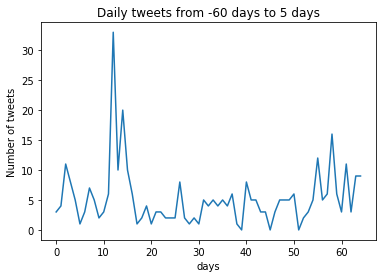





account_name: RentACenter event_date: 2014-01-27
start_date: 2013-11-28 end_date: 2014-02-01
Sum of tweets: 155


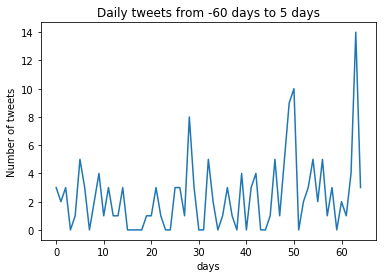





account_name: SPDSmartGlass event_date: 2014-11-04
start_date: 2014-09-05 end_date: 2014-11-09
Sum of tweets: 12
account_name: ARTASHair event_date: 2017-09-01
start_date: 2017-07-03 end_date: 2017-09-06
Sum of tweets: 109


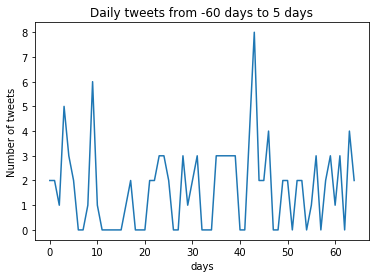





account_name: revlon event_date: 2014-07-30
start_date: 2014-05-31 end_date: 2014-08-04
Sum of tweets: 4936


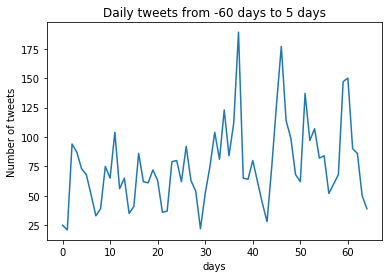





account_name: RFIndustries event_date: 2015-01-29
start_date: 2014-11-30 end_date: 2015-02-03
Sum of tweets: 25
account_name: RestoHardware event_date: 2017-03-29
start_date: 2017-01-28 end_date: 2017-04-03
Sum of tweets: 1275


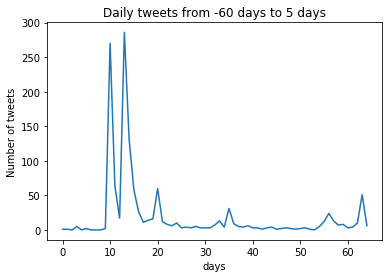





account_name: RigNet event_date: 2016-02-29
start_date: 2015-12-31 end_date: 2016-03-05
Sum of tweets: 11
account_name: RitchieBros event_date: 2017-11-09
start_date: 2017-09-10 end_date: 2017-11-14
Sum of tweets: 633


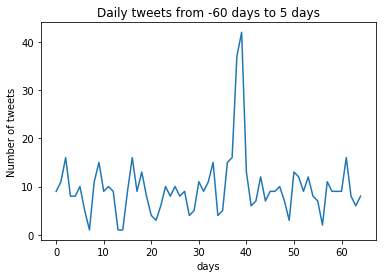





account_name: RMGNetworks event_date: 2013-03-04
start_date: 2013-01-03 end_date: 2013-03-09
Sum of tweets: 8
account_name: RRTS_Corporate event_date: 2017-01-30
start_date: 2016-12-01 end_date: 2017-02-04
Sum of tweets: 11
account_name: rocketfuelinc event_date: 2013-08-16
start_date: 2013-06-17 end_date: 2013-08-21
Sum of tweets: 361


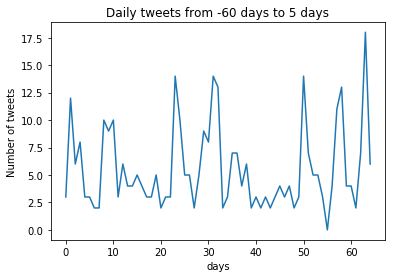





account_name: ROKAutomation event_date: 2015-11-17
start_date: 2015-09-18 end_date: 2015-11-22
Sum of tweets: 943


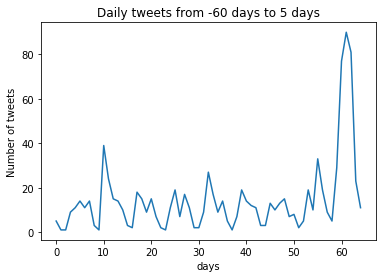





account_name: Rosehillres2017 event_date: 2017-11-02
start_date: 2017-09-03 end_date: 2017-11-07
Sum of tweets: 4
account_name: RoyaleEnergy event_date: 2014-01-22
start_date: 2013-11-23 end_date: 2014-01-27
Sum of tweets: 4
account_name: RoyaleEnergy event_date: 2013-04-16
start_date: 2013-02-15 end_date: 2013-04-21
Sum of tweets: 11
account_name: RoyceFunds event_date: 2016-03-02
start_date: 2016-01-02 end_date: 2016-03-07
Sum of tweets: 201


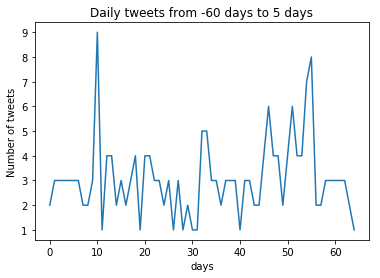





account_name: RoyceFunds event_date: 2016-03-02
start_date: 2016-01-02 end_date: 2016-03-07
Sum of tweets: 201


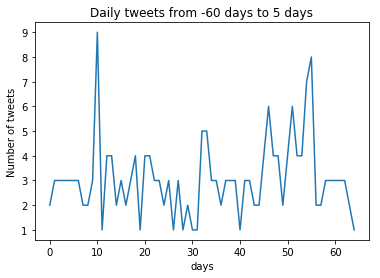





account_name: RoyceFunds event_date: 2016-03-02
start_date: 2016-01-02 end_date: 2016-03-07
Sum of tweets: 201


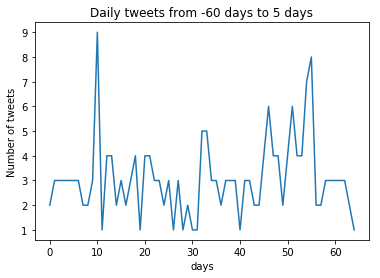





account_name: RPMintl event_date: 2014-07-28
start_date: 2014-05-29 end_date: 2014-08-02
Sum of tweets: 56
account_name: RyderSystemInc event_date: 2015-08-07
start_date: 2015-06-08 end_date: 2015-08-12
Sum of tweets: 75
account_name: RyersonMetals event_date: 2016-03-09
start_date: 2016-01-09 end_date: 2016-03-14
Sum of tweets: 2
account_name: SPGlobal event_date: 2013-03-20
start_date: 2013-01-19 end_date: 2013-03-25
Sum of tweets: 41
account_name: Sabre_Corp event_date: 2014-03-10
start_date: 2014-01-09 end_date: 2014-03-15
Sum of tweets: 339


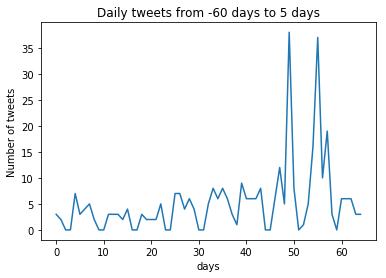





account_name: safetyins event_date: 2016-02-26
start_date: 2015-12-28 end_date: 2016-03-02
Sum of tweets: 78
account_name: safetyins event_date: 2014-03-17
start_date: 2014-01-16 end_date: 2014-03-22
Sum of tweets: 80
account_name: Safeway event_date: 2013-02-21
start_date: 2012-12-23 end_date: 2013-02-26
Sum of tweets: 2882


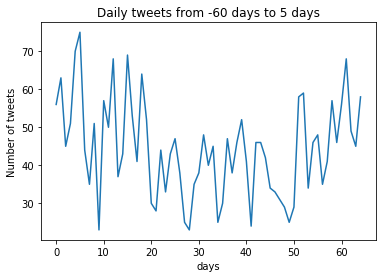





account_name: Safeway event_date: 2013-10-10
start_date: 2013-08-11 end_date: 2013-10-15
Sum of tweets: 7760


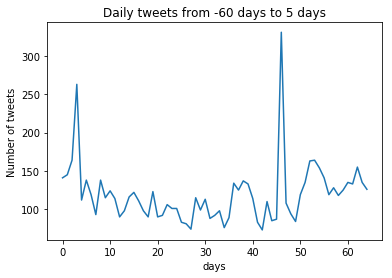





account_name: SalixPharma event_date: 2014-11-07
start_date: 2014-09-08 end_date: 2014-11-12
Sum of tweets: 113


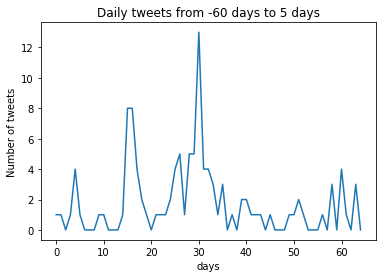





account_name: SantanderUSA event_date: 2016-08-09
start_date: 2016-06-10 end_date: 2016-08-14
Sum of tweets: 179


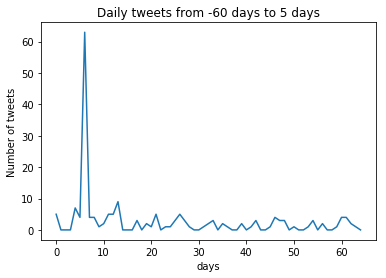





account_name: SantanderUSA event_date: 2016-02-29
start_date: 2015-12-31 end_date: 2016-03-05
Sum of tweets: 98
account_name: ScanSource event_date: 2013-05-02
start_date: 2013-03-03 end_date: 2013-05-07
Sum of tweets: 54
account_name: ScientificGames event_date: 2016-02-29
start_date: 2015-12-31 end_date: 2016-03-05
Sum of tweets: 77
account_name: ScientificGames event_date: 2015-05-11
start_date: 2015-03-12 end_date: 2015-05-16
Sum of tweets: 78
account_name: ScientificGames event_date: 2014-03-17
start_date: 2014-01-16 end_date: 2014-03-22
Sum of tweets: 11
account_name: Scotts_MGro event_date: 2014-11-25
start_date: 2014-09-26 end_date: 2014-11-30
Sum of tweets: 69
account_name: SeaChangeNews event_date: 2013-09-09
start_date: 2013-07-11 end_date: 2013-09-14
Sum of tweets: 48
account_name: Sealed_Air event_date: 2016-10-31
start_date: 2016-09-01 end_date: 2016-11-05
Sum of tweets: 153


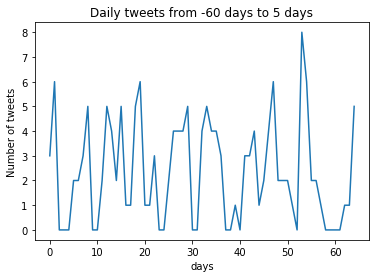





account_name: Sealed_Air event_date: 2015-08-04
start_date: 2015-06-05 end_date: 2015-08-09
Sum of tweets: 174


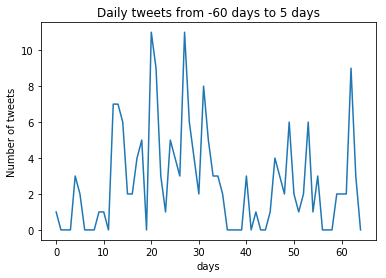





account_name: Sealed_Air event_date: 2014-11-05
start_date: 2014-09-06 end_date: 2014-11-10
Sum of tweets: 58
account_name: Sealed_Air event_date: 2013-05-08
start_date: 2013-03-09 end_date: 2013-05-13
Sum of tweets: 12
account_name: SearsHTS event_date: 2017-03-31
start_date: 2017-01-30 end_date: 2017-04-05
Sum of tweets: 246


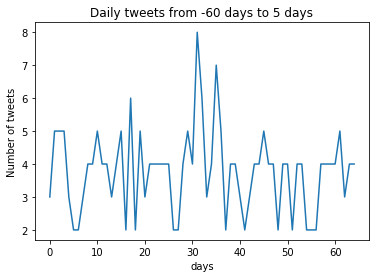





account_name: SearsHTS event_date: 2016-04-01
start_date: 2016-02-01 end_date: 2016-04-06
Sum of tweets: 331


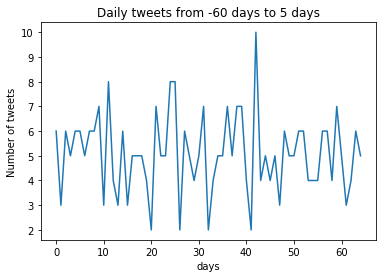





account_name: SeattleGenetics event_date: 2014-02-28
start_date: 2013-12-30 end_date: 2014-03-05
Sum of tweets: 56
account_name: SNFinancialCorp event_date: 2017-03-31
start_date: 2017-01-30 end_date: 2017-04-05
Sum of tweets: 0
account_name: SNFinancialCorp event_date: 2017-08-04
start_date: 2017-06-05 end_date: 2017-08-09
Sum of tweets: 1
account_name: SEDIntl event_date: 2013-11-13
start_date: 2013-09-14 end_date: 2013-11-18
Sum of tweets: 4
account_name: SemGroupCorp event_date: 2017-02-23
start_date: 2016-12-25 end_date: 2017-02-28
Sum of tweets: 11
account_name: MaterniT21PLUS event_date: 2013-03-07
start_date: 2013-01-06 end_date: 2013-03-12
Sum of tweets: 0
account_name: servicenow event_date: 2013-05-08
start_date: 2013-03-09 end_date: 2013-05-13
Sum of tweets: 1044


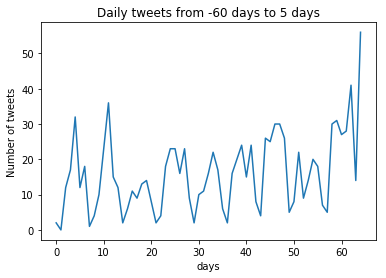





account_name: servicesource event_date: 2016-08-09
start_date: 2016-06-10 end_date: 2016-08-14
Sum of tweets: 122


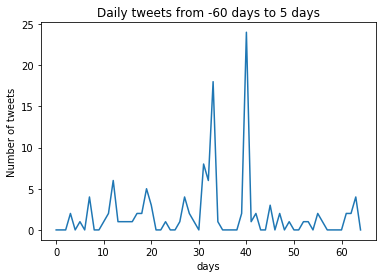





account_name: SevernSavings event_date: 2013-02-14
start_date: 2012-12-16 end_date: 2013-02-19
Sum of tweets: 16
account_name: Shell event_date: 2014-11-21
start_date: 2014-09-22 end_date: 2014-11-26
Sum of tweets: 10326


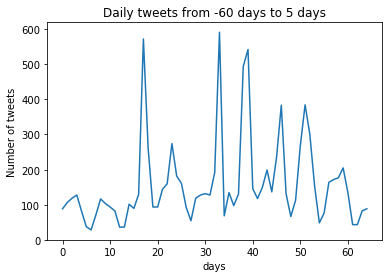





account_name: Shell event_date: 2014-09-23
start_date: 2014-07-25 end_date: 2014-09-28
Sum of tweets: 10961


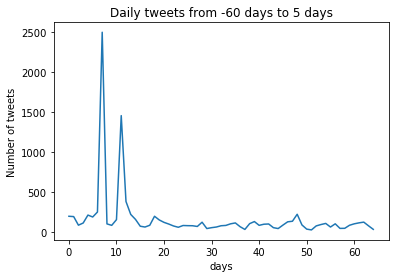





account_name: Shentel event_date: 2017-08-02
start_date: 2017-06-03 end_date: 2017-08-07
Sum of tweets: 206


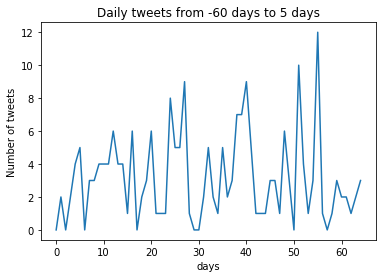





account_name: ShilohInd event_date: 2017-01-17
start_date: 2016-11-18 end_date: 2017-01-22
Sum of tweets: 9
account_name: ShilohInd event_date: 2015-09-09
start_date: 2015-07-11 end_date: 2015-09-14
Sum of tweets: 1
account_name: SientraInc event_date: 2014-09-19
start_date: 2014-07-21 end_date: 2014-09-24
Sum of tweets: 0
account_name: silverspringnet event_date: 2016-08-09
start_date: 2016-06-10 end_date: 2016-08-14
Sum of tweets: 113


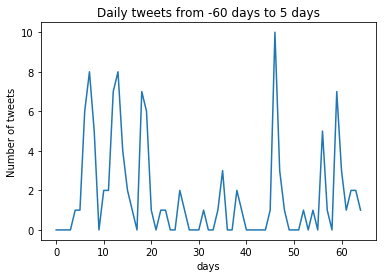





account_name: ShopSimon event_date: 2016-01-13
start_date: 2015-11-14 end_date: 2016-01-18
Sum of tweets: 176


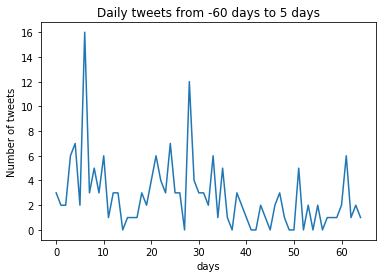





account_name: strongtie event_date: 2015-03-02
start_date: 2015-01-01 end_date: 2015-03-07
Sum of tweets: 89
account_name: strongtie event_date: 2014-05-09
start_date: 2014-03-10 end_date: 2014-05-14
Sum of tweets: 25
account_name: SixFlags event_date: 2014-02-19
start_date: 2013-12-21 end_date: 2014-02-24
Sum of tweets: 1750


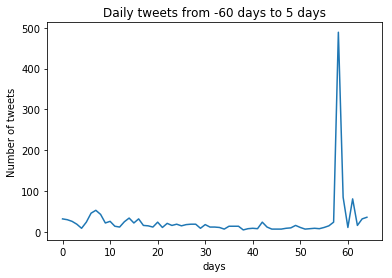





account_name: skullcandy event_date: 2014-05-09
start_date: 2014-03-10 end_date: 2014-05-14
Sum of tweets: 2299


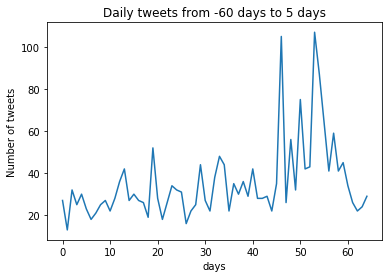





account_name: SkyWestAirlines event_date: 2016-02-26
start_date: 2015-12-28 end_date: 2016-03-02
Sum of tweets: 95
account_name: SLGreen event_date: 2016-02-29
start_date: 2015-12-31 end_date: 2016-03-05
Sum of tweets: 6
account_name: LanceSnacks event_date: 2015-08-11
start_date: 2015-06-12 end_date: 2015-08-16
Sum of tweets: 124


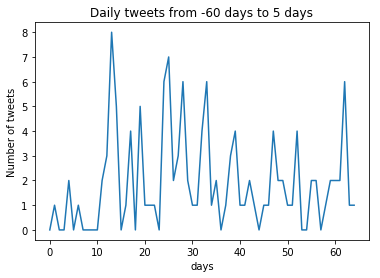





account_name: solarcity event_date: 2014-03-03
start_date: 2014-01-02 end_date: 2014-03-08
Sum of tweets: 1201


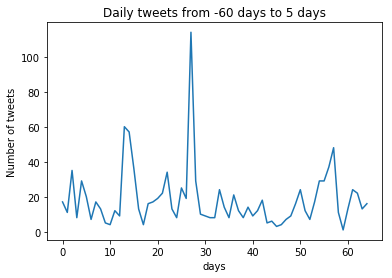





account_name: Sonoco_Products event_date: 2015-07-16
start_date: 2015-05-17 end_date: 2015-07-21
Sum of tweets: 74
account_name: Sonoco_Products event_date: 2013-05-01
start_date: 2013-03-02 end_date: 2013-05-06
Sum of tweets: 93
account_name: sotherlyhotels event_date: 2015-04-14
start_date: 2015-02-13 end_date: 2015-04-19
Sum of tweets: 0
account_name: SPPlusCorp event_date: 2017-11-02
start_date: 2017-09-03 end_date: 2017-11-07
Sum of tweets: 67
account_name: SparkEnergy event_date: 2014-06-30
start_date: 2014-05-01 end_date: 2014-07-05
Sum of tweets: 18
account_name: SpartonCorp event_date: 2015-07-23
start_date: 2015-05-24 end_date: 2015-07-28
Sum of tweets: 32
account_name: SpiritRealty event_date: 2016-02-26
start_date: 2015-12-28 end_date: 2016-03-02
Sum of tweets: 5
account_name: SpiritRealty event_date: 2016-10-19
start_date: 2016-08-20 end_date: 2016-10-24
Sum of tweets: 43
account_name: spoktweets event_date: 2017-03-02
start_date: 2017-01-01 end_date: 2017-03-07
Sum of

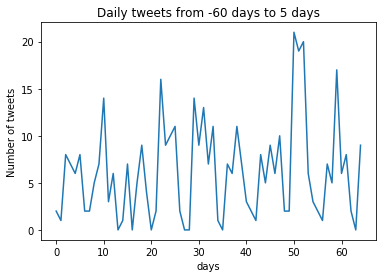





account_name: spoktweets event_date: 2016-10-27
start_date: 2016-08-28 end_date: 2016-11-01
Sum of tweets: 503


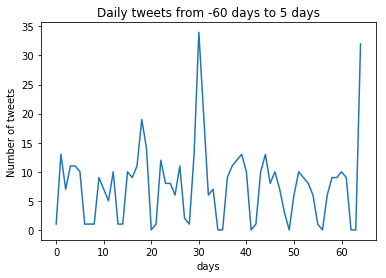





account_name: spoktweets event_date: 2013-03-18
start_date: 2013-01-17 end_date: 2013-03-23
Sum of tweets: 20
account_name: sproutsfm event_date: 2013-05-09
start_date: 2013-03-10 end_date: 2013-05-14
Sum of tweets: 935


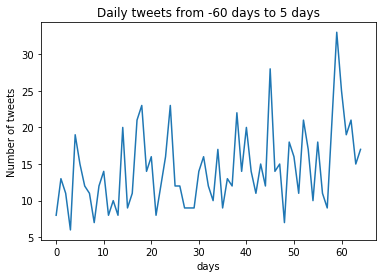





account_name: Square event_date: 2017-02-27
start_date: 2016-12-29 end_date: 2017-03-04
Sum of tweets: 7843


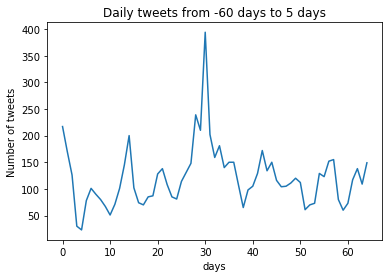





account_name: STAGIndustrial event_date: 2017-02-16
start_date: 2016-12-18 end_date: 2017-02-21
Sum of tweets: 1
account_name: Starbucks event_date: 2014-01-28
start_date: 2013-11-29 end_date: 2014-02-02
Sum of tweets: 128203


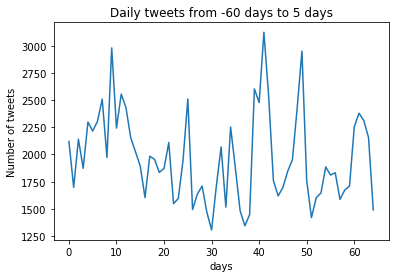





account_name: thestarsgroup event_date: 2017-03-22
start_date: 2017-01-21 end_date: 2017-03-27
Sum of tweets: 0
account_name: StateAuto event_date: 2013-03-08
start_date: 2013-01-07 end_date: 2013-03-13
Sum of tweets: 504


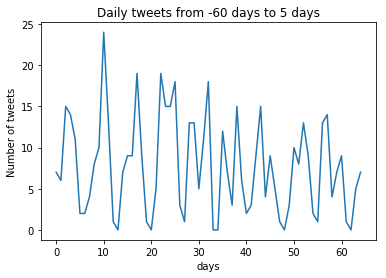





account_name: StateStreet event_date: 2016-02-19
start_date: 2015-12-21 end_date: 2016-02-24
Sum of tweets: 588


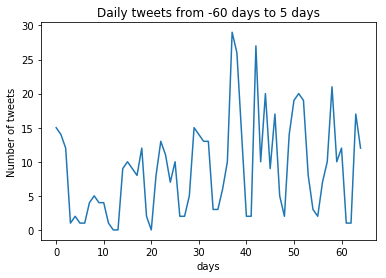





account_name: Stericycle_Inc event_date: 2016-07-28
start_date: 2016-05-29 end_date: 2016-08-02
Sum of tweets: 39
account_name: Stericycle_Inc event_date: 2014-08-07
start_date: 2014-06-08 end_date: 2014-08-12
Sum of tweets: 88
account_name: STRM_Health event_date: 2013-12-17
start_date: 2013-10-18 end_date: 2013-12-22
Sum of tweets: 32
account_name: Sucampo_Pharma event_date: 2014-08-06
start_date: 2014-06-07 end_date: 2014-08-11
Sum of tweets: 10
account_name: Sucampo_Pharma event_date: 2014-03-12
start_date: 2014-01-11 end_date: 2014-03-17
Sum of tweets: 8
account_name: SummitHotel_INN event_date: 2014-12-15
start_date: 2014-10-16 end_date: 2014-12-20
Sum of tweets: 3
account_name: SunocoRacing event_date: 2014-02-26
start_date: 2013-12-28 end_date: 2014-03-03
Sum of tweets: 2933


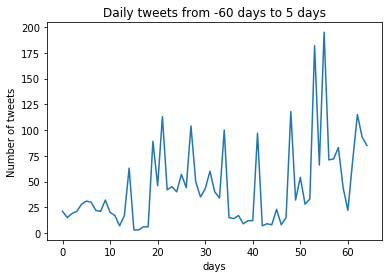





account_name: Sunrun event_date: 2015-07-22
start_date: 2015-05-23 end_date: 2015-07-27
Sum of tweets: 792


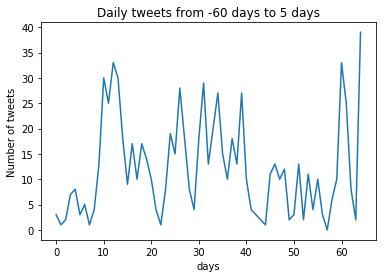





account_name: SunworksSolar event_date: 2017-05-11
start_date: 2017-03-12 end_date: 2017-05-16
Sum of tweets: 136


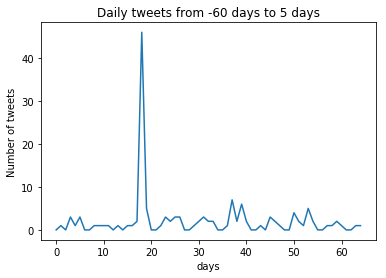





account_name: supervaluPR event_date: 2017-10-18
start_date: 2017-08-19 end_date: 2017-10-23
Sum of tweets: 94
account_name: supervaluPR event_date: 2015-07-28
start_date: 2015-05-29 end_date: 2015-08-02
Sum of tweets: 32
account_name: SCAsolutions event_date: 2014-03-24
start_date: 2014-01-23 end_date: 2014-03-29
Sum of tweets: 54
account_name: symantec event_date: 2014-05-08
start_date: 2014-03-09 end_date: 2014-05-13
Sum of tweets: 4583


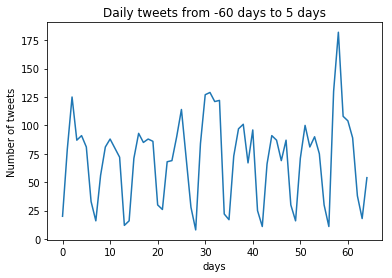





account_name: Synchronoss event_date: 2017-05-12
start_date: 2017-03-13 end_date: 2017-05-17
Sum of tweets: 141


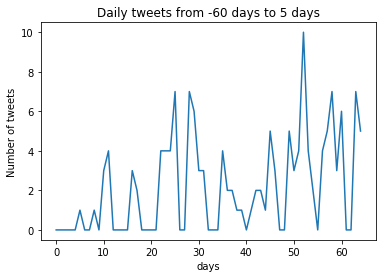





account_name: SYNNEX event_date: 2015-01-29
start_date: 2014-11-30 end_date: 2015-02-03
Sum of tweets: 270


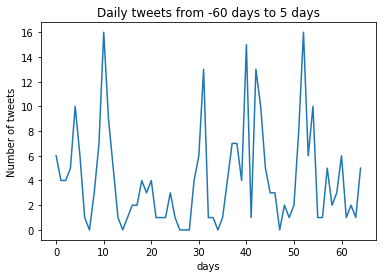





account_name: Sysco event_date: 2017-11-09
start_date: 2017-09-10 end_date: 2017-11-14
Sum of tweets: 397


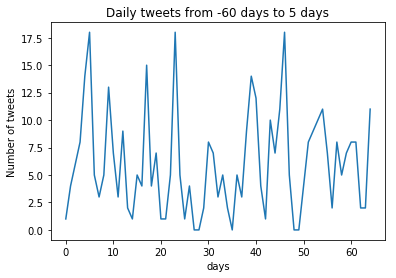





account_name: tableau event_date: 2013-05-06
start_date: 2013-03-07 end_date: 2013-05-11
Sum of tweets: 2893


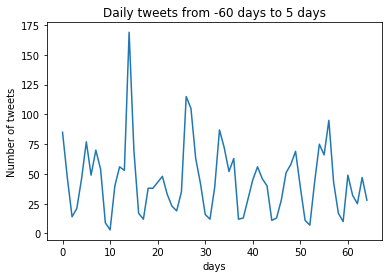





account_name: TalenEnergy event_date: 2015-11-09
start_date: 2015-09-10 end_date: 2015-11-14
Sum of tweets: 116


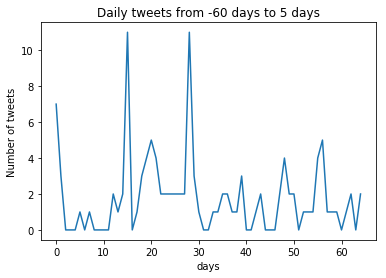





account_name: TandemDiabetes event_date: 2013-10-07
start_date: 2013-08-08 end_date: 2013-10-12
Sum of tweets: 511


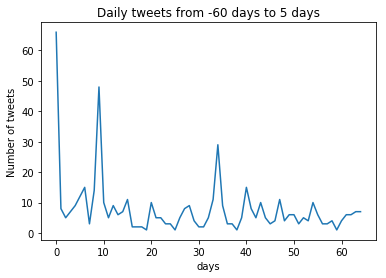





account_name: TangerOutlets event_date: 2016-02-23
start_date: 2015-12-25 end_date: 2016-02-28
Sum of tweets: 579


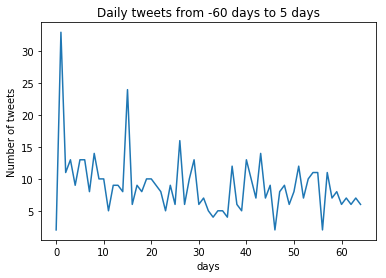





account_name: TangerOutlets event_date: 2013-11-12
start_date: 2013-09-13 end_date: 2013-11-17
Sum of tweets: 782


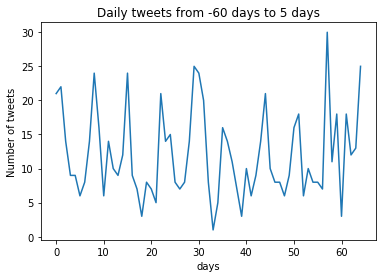





account_name: Tapimmune_Inc event_date: 2016-04-11
start_date: 2016-02-11 end_date: 2016-04-16
Sum of tweets: 13
account_name: teamhealth event_date: 2014-04-29
start_date: 2014-02-28 end_date: 2014-05-04
Sum of tweets: 413


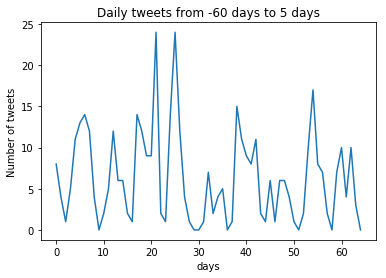





account_name: Tech_Data event_date: 2013-03-21
start_date: 2013-01-20 end_date: 2013-03-26
Sum of tweets: 91
account_name: TechnipFMC event_date: 2017-07-24
start_date: 2017-05-25 end_date: 2017-07-29
Sum of tweets: 320


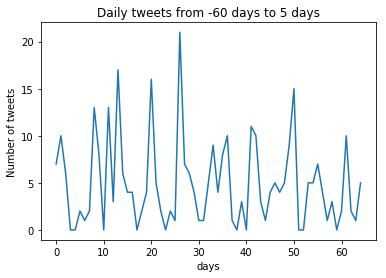





account_name: TecnoglassInc event_date: 2016-03-29
start_date: 2016-01-29 end_date: 2016-04-03
Sum of tweets: 54
account_name: TecnoglassInc event_date: 2015-05-07
start_date: 2015-03-08 end_date: 2015-05-12
Sum of tweets: 0
account_name: TecnoglassInc event_date: 2015-04-15
start_date: 2015-02-14 end_date: 2015-04-20
Sum of tweets: 0
account_name: TecnoglassInc event_date: 2013-05-30
start_date: 2013-03-31 end_date: 2013-06-04
Sum of tweets: 0
account_name: TIM_Official event_date: 2017-04-12
start_date: 2017-02-11 end_date: 2017-04-17
Sum of tweets: 14660


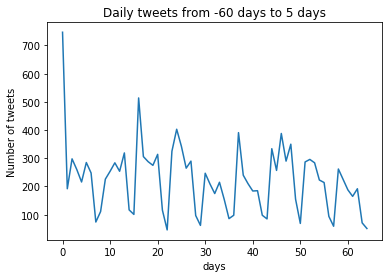





account_name: ericsson event_date: 2016-04-04
start_date: 2016-02-04 end_date: 2016-04-09
Sum of tweets: 5909


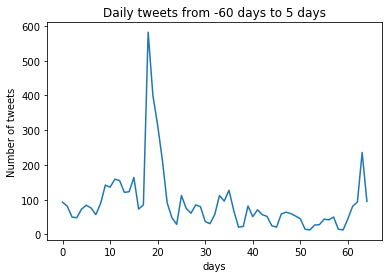





account_name: Tenaris event_date: 2015-05-01
start_date: 2015-03-02 end_date: 2015-05-06
Sum of tweets: 197


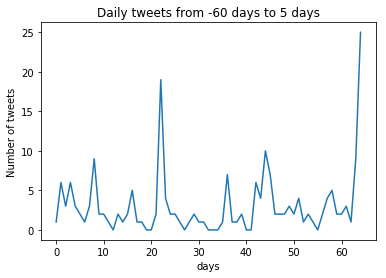





account_name: Ternium event_date: 2015-05-01
start_date: 2015-03-02 end_date: 2015-05-06
Sum of tweets: 57
account_name: Tesco_Corp event_date: 2015-03-17
start_date: 2015-01-16 end_date: 2015-03-22
Sum of tweets: 0
account_name: Tesla event_date: 2013-03-04
start_date: 2013-01-03 end_date: 2013-03-09
Sum of tweets: 550


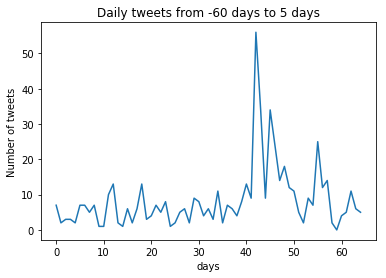





account_name: TGTherapeutics event_date: 2013-03-21
start_date: 2013-01-20 end_date: 2013-03-26
Sum of tweets: 0
account_name: thermofisher event_date: 2013-11-01
start_date: 2013-09-02 end_date: 2013-11-06
Sum of tweets: 221


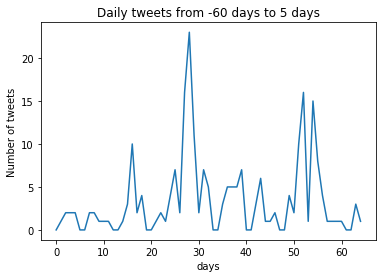





account_name: tigerlogic event_date: 2014-06-27
start_date: 2014-04-28 end_date: 2014-07-02
Sum of tweets: 0
account_name: TheTileShop event_date: 2015-02-27
start_date: 2014-12-29 end_date: 2015-03-04
Sum of tweets: 205


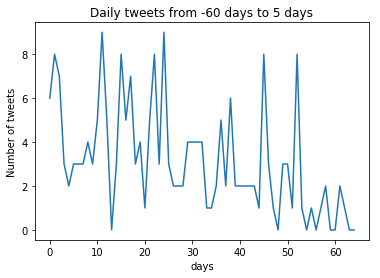





account_name: TheTileShop event_date: 2013-02-20
start_date: 2012-12-22 end_date: 2013-02-25
Sum of tweets: 167


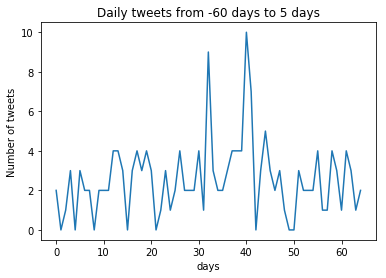





account_name: Tillys event_date: 2016-03-30
start_date: 2016-01-30 end_date: 2016-04-04
Sum of tweets: 1192


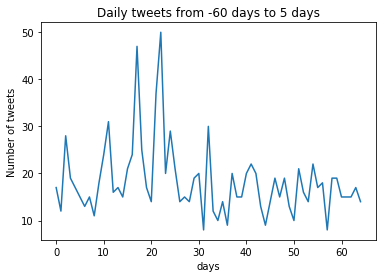





account_name: Tillys event_date: 2014-06-11
start_date: 2014-04-12 end_date: 2014-06-16
Sum of tweets: 1754


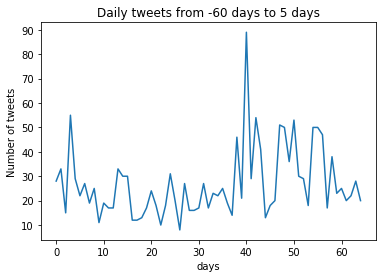





account_name: TIMBrasil event_date: 2017-02-03
start_date: 2016-12-05 end_date: 2017-02-08
Sum of tweets: 12171


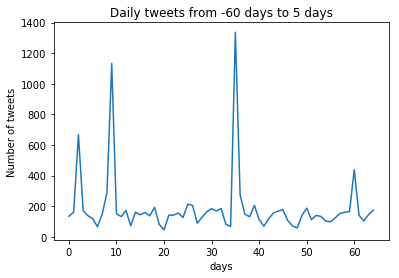





account_name: TIMBrasil event_date: 2016-04-14
start_date: 2016-02-14 end_date: 2016-04-19
Sum of tweets: 13464


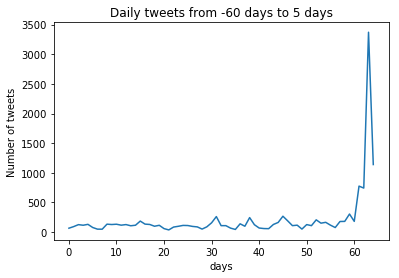





account_name: Timken event_date: 2014-02-28
start_date: 2013-12-30 end_date: 2014-03-05
Sum of tweets: 55
account_name: TimkenSteel event_date: 2017-03-16
start_date: 2017-01-15 end_date: 2017-03-21
Sum of tweets: 54
account_name: titan_tire event_date: 2015-11-06
start_date: 2015-09-07 end_date: 2015-11-11
Sum of tweets: 27
account_name: TitanCE event_date: 2014-09-09
start_date: 2014-07-11 end_date: 2014-09-14
Sum of tweets: 9
account_name: tollbrothersinc event_date: 2017-03-07
start_date: 2017-01-06 end_date: 2017-03-12
Sum of tweets: 372


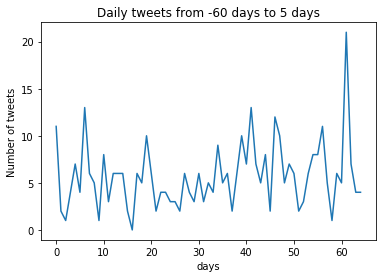





account_name: tollbrothersinc event_date: 2013-07-16
start_date: 2013-05-17 end_date: 2013-07-21
Sum of tweets: 138


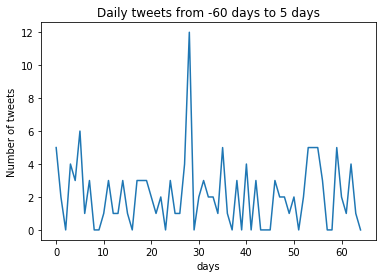





account_name: TheTradeDesk event_date: 2016-06-17
start_date: 2016-04-18 end_date: 2016-06-22
Sum of tweets: 34
account_name: officialfye event_date: 2016-06-09
start_date: 2016-04-10 end_date: 2016-06-14
Sum of tweets: 8997


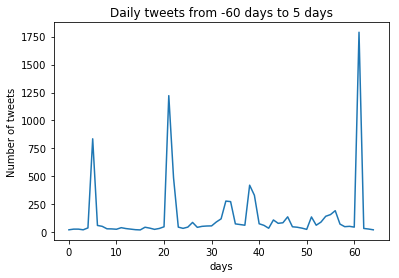





account_name: officialfye event_date: 2015-04-16
start_date: 2015-02-15 end_date: 2015-04-21
Sum of tweets: 10208


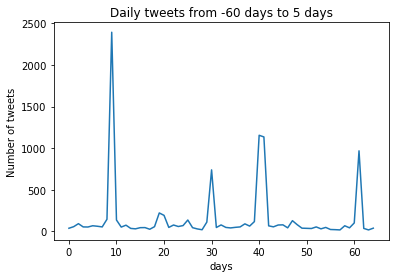





account_name: TATravelCenters event_date: 2014-03-17
start_date: 2014-01-16 end_date: 2014-03-22
Sum of tweets: 218


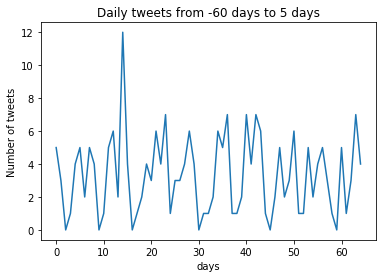





account_name: TrimbleCorpNews event_date: 2015-11-10
start_date: 2015-09-11 end_date: 2015-11-15
Sum of tweets: 109


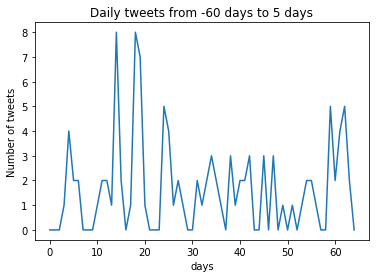





account_name: Trinseo event_date: 2014-08-11
start_date: 2014-06-12 end_date: 2014-08-16
Sum of tweets: 55
account_name: tronc event_date: 2016-03-14
start_date: 2016-01-14 end_date: 2016-03-19
Sum of tweets: 0
account_name: TBStaffing event_date: 2016-02-22
start_date: 2015-12-24 end_date: 2016-02-27
Sum of tweets: 104


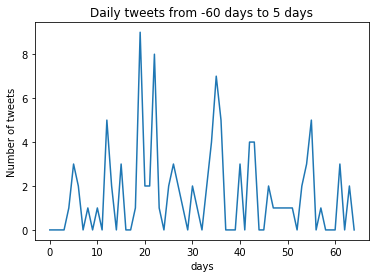





account_name: TBStaffing event_date: 2014-07-28
start_date: 2014-05-29 end_date: 2014-08-02
Sum of tweets: 127


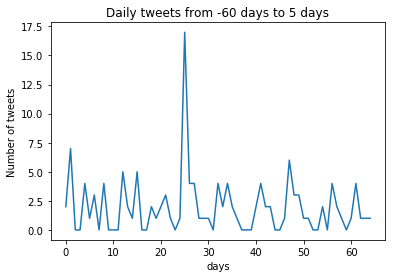





account_name: TrueCar event_date: 2015-03-12
start_date: 2015-01-11 end_date: 2015-03-17
Sum of tweets: 1761


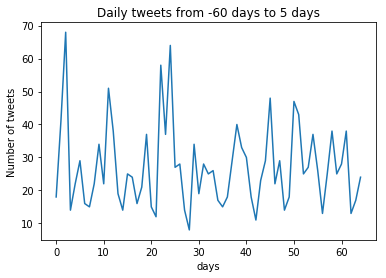





account_name: Trustmark_Bank event_date: 2014-11-06
start_date: 2014-09-07 end_date: 2014-11-11
Sum of tweets: 8
account_name: TupperwareWW event_date: 2014-02-25
start_date: 2013-12-27 end_date: 2014-03-02
Sum of tweets: 29
account_name: TurquoiseHillRe event_date: 2017-03-27
start_date: 2017-01-26 end_date: 2017-04-01
Sum of tweets: 55
account_name: TurquoiseHillRe event_date: 2013-11-14
start_date: 2013-09-15 end_date: 2013-11-19
Sum of tweets: 112


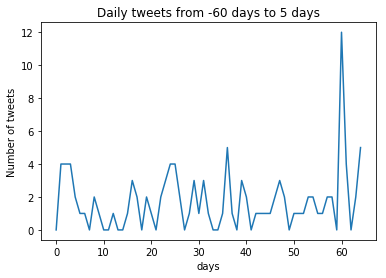





account_name: TurtleBeach event_date: 2015-05-07
start_date: 2015-03-08 end_date: 2015-05-12
Sum of tweets: 6742


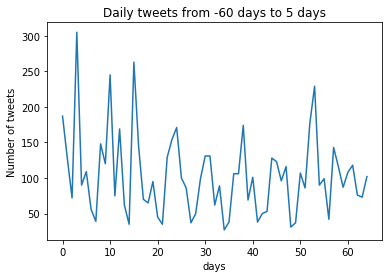





account_name: 21CF event_date: 2014-11-07
start_date: 2014-09-08 end_date: 2014-11-12
Sum of tweets: 4
account_name: twindisc event_date: 2013-02-06
start_date: 2012-12-08 end_date: 2013-02-11
Sum of tweets: 0
account_name: tyme_inc event_date: 2017-06-12
start_date: 2017-04-13 end_date: 2017-06-17
Sum of tweets: 0
account_name: USFunds event_date: 2014-08-27
start_date: 2014-06-28 end_date: 2014-09-01
Sum of tweets: 357


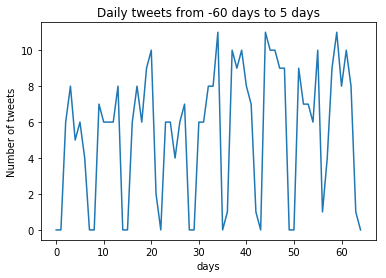





account_name: UFPT event_date: 2017-08-09
start_date: 2017-06-10 end_date: 2017-08-14
Sum of tweets: 8
account_name: UnderArmour event_date: 2015-11-04
start_date: 2015-09-05 end_date: 2015-11-09
Sum of tweets: 16877


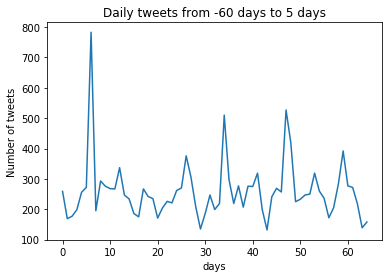





account_name: uniQure_NV event_date: 2017-05-01
start_date: 2017-03-02 end_date: 2017-05-06
Sum of tweets: 67
account_name: unilife event_date: 2016-05-08
start_date: 2016-03-09 end_date: 2016-05-13
Sum of tweets: 25
account_name: ucbi event_date: 2014-11-10
start_date: 2014-09-11 end_date: 2014-11-15
Sum of tweets: 1
account_name: UDFIV event_date: 2014-04-01
start_date: 2014-01-31 end_date: 2014-04-06
Sum of tweets: 0
account_name: UNFI event_date: 2016-09-12
start_date: 2016-07-14 end_date: 2016-09-17
Sum of tweets: 187


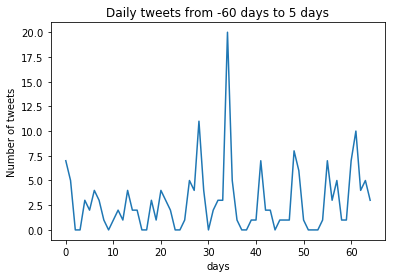





account_name: UNFI event_date: 2013-03-06
start_date: 2013-01-05 end_date: 2013-03-11
Sum of tweets: 183


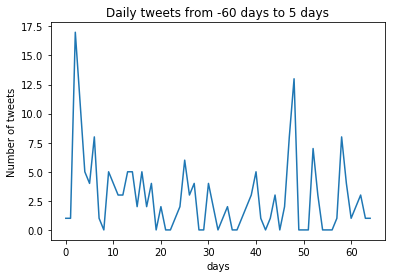





account_name: USCellular event_date: 2017-02-24
start_date: 2016-12-26 end_date: 2017-03-01
Sum of tweets: 1297


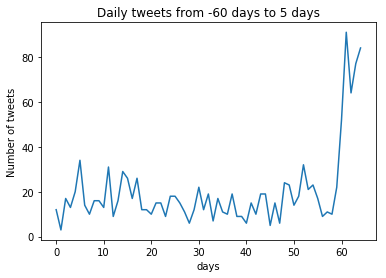





account_name: USCellular event_date: 2013-02-26
start_date: 2012-12-28 end_date: 2013-03-03
Sum of tweets: 1763


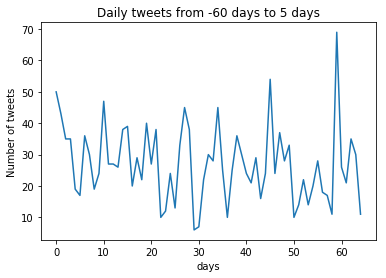





account_name: U_S_Steel event_date: 2016-02-29
start_date: 2015-12-31 end_date: 2016-03-05
Sum of tweets: 52
account_name: U_S_Steel event_date: 2014-07-30
start_date: 2014-05-31 end_date: 2014-08-04
Sum of tweets: 172


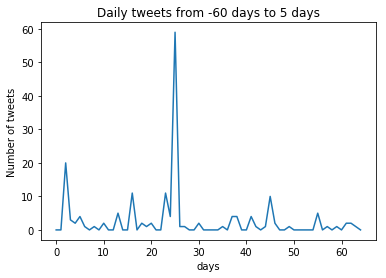





account_name: UHS_Inc event_date: 2014-05-07
start_date: 2014-03-08 end_date: 2014-05-12
Sum of tweets: 24
account_name: UTITweet event_date: 2014-12-03
start_date: 2014-10-04 end_date: 2014-12-08
Sum of tweets: 892


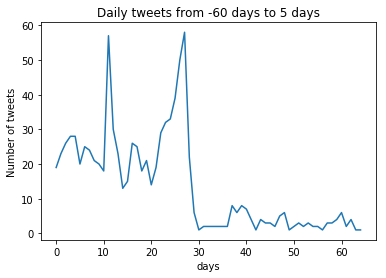





account_name: USConcrete event_date: 2016-04-27
start_date: 2016-02-27 end_date: 2016-05-02
Sum of tweets: 31
account_name: USPhysTherapy event_date: 2017-03-16
start_date: 2017-01-15 end_date: 2017-03-21
Sum of tweets: 60
account_name: USA_TECH event_date: 2016-05-13
start_date: 2016-03-14 end_date: 2016-05-18
Sum of tweets: 149


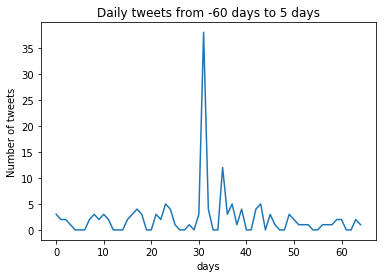





account_name: usatruckrecruit event_date: 2014-04-30
start_date: 2014-03-01 end_date: 2014-05-05
Sum of tweets: 20
account_name: VailResorts event_date: 2013-09-27
start_date: 2013-07-29 end_date: 2013-10-02
Sum of tweets: 428


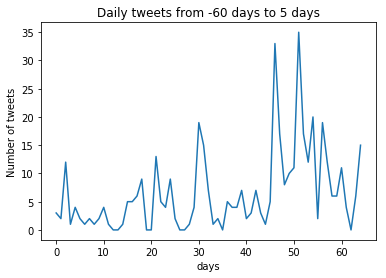





account_name: Valvoline event_date: 2017-08-08
start_date: 2017-06-09 end_date: 2017-08-13
Sum of tweets: 1072


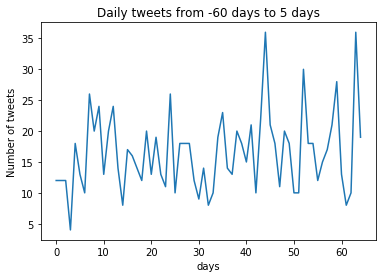





account_name: Vectrus event_date: 2015-08-05
start_date: 2015-06-06 end_date: 2015-08-10
Sum of tweets: 59
account_name: VenatorCorp event_date: 2017-11-16
start_date: 2017-09-17 end_date: 2017-11-21
Sum of tweets: 23
account_name: Verint event_date: 2015-12-02
start_date: 2015-10-03 end_date: 2015-12-07
Sum of tweets: 806


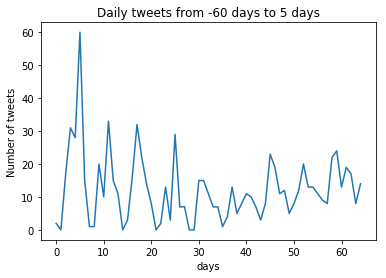





account_name: Veritiv event_date: 2014-06-05
start_date: 2014-04-06 end_date: 2014-06-10
Sum of tweets: 0
account_name: Veritiv event_date: 2014-04-04
start_date: 2014-02-03 end_date: 2014-04-09
Sum of tweets: 0
account_name: veritoneinc event_date: 2017-01-27
start_date: 2016-11-28 end_date: 2017-02-01
Sum of tweets: 28
account_name: veritoneinc event_date: 2017-01-27
start_date: 2016-11-28 end_date: 2017-02-01
Sum of tweets: 28
account_name: VersoCo event_date: 2017-03-20
start_date: 2017-01-19 end_date: 2017-03-25
Sum of tweets: 72
account_name: VertexPharma event_date: 2016-02-16
start_date: 2015-12-18 end_date: 2016-02-21
Sum of tweets: 163


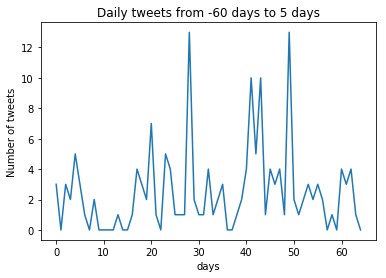





account_name: ViaviSolutions event_date: 2016-08-11
start_date: 2016-06-12 end_date: 2016-08-16
Sum of tweets: 314


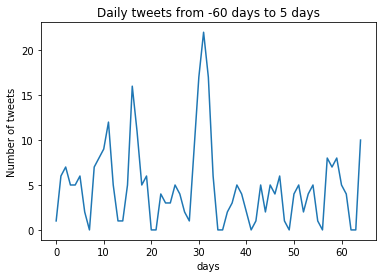





account_name: VircoInc event_date: 2016-04-26
start_date: 2016-02-26 end_date: 2016-05-01
Sum of tweets: 2
account_name: VircoInc event_date: 2015-04-24
start_date: 2015-02-23 end_date: 2015-04-29
Sum of tweets: 9
account_name: VircoInc event_date: 2014-06-16
start_date: 2014-04-17 end_date: 2014-06-21
Sum of tweets: 31
account_name: Visa event_date: 2017-11-17
start_date: 2017-09-18 end_date: 2017-11-22
Sum of tweets: 10371


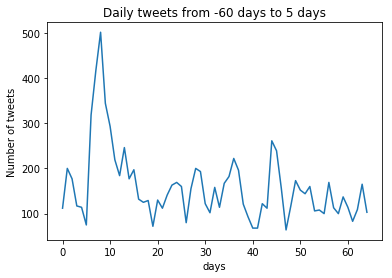





account_name: VitaminShoppe event_date: 2017-11-08
start_date: 2017-09-09 end_date: 2017-11-13
Sum of tweets: 1188


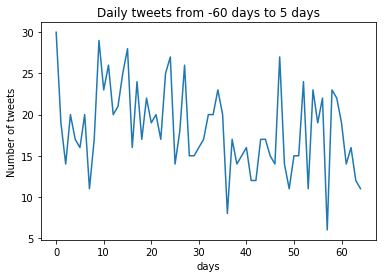





account_name: VivintSolar event_date: 2014-09-26
start_date: 2014-07-28 end_date: 2014-10-01
Sum of tweets: 224


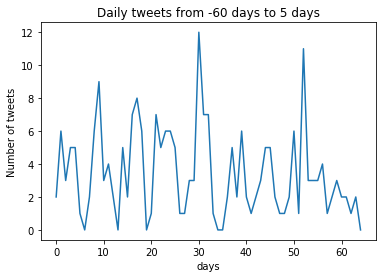





account_name: Vonage event_date: 2017-05-09
start_date: 2017-03-10 end_date: 2017-05-14
Sum of tweets: 814


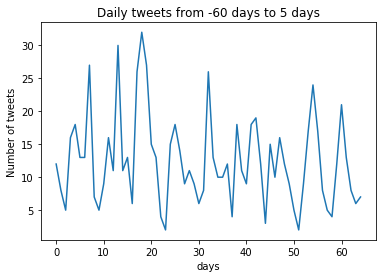





account_name: VOXX_Intl event_date: 2013-05-15
start_date: 2013-03-16 end_date: 2013-05-20
Sum of tweets: 38
account_name: Voya event_date: 2016-02-25
start_date: 2015-12-27 end_date: 2016-03-01
Sum of tweets: 372


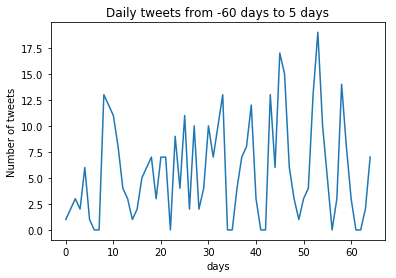





account_name: Voya event_date: 2015-08-07
start_date: 2015-06-08 end_date: 2015-08-12
Sum of tweets: 413


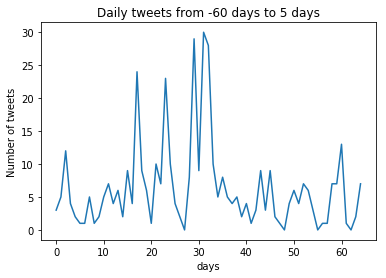





account_name: WPCarey event_date: 2016-02-26
start_date: 2015-12-28 end_date: 2016-03-02
Sum of tweets: 19
account_name: WPCarey event_date: 2015-08-07
start_date: 2015-06-08 end_date: 2015-08-12
Sum of tweets: 57
account_name: WageWorks event_date: 2014-02-27
start_date: 2013-12-29 end_date: 2014-03-04
Sum of tweets: 125


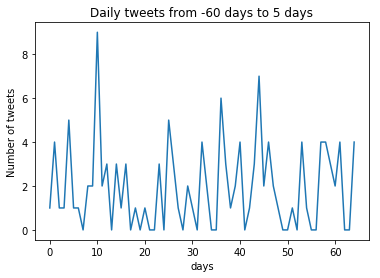





account_name: WashTrust event_date: 2014-11-06
start_date: 2014-09-07 end_date: 2014-11-11
Sum of tweets: 54
account_name: WasteManagement event_date: 2014-10-29
start_date: 2014-08-30 end_date: 2014-11-03
Sum of tweets: 1444


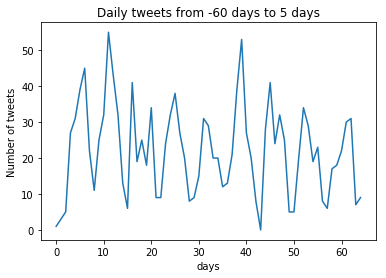





account_name: webdotcom event_date: 2016-11-08
start_date: 2016-09-09 end_date: 2016-11-13
Sum of tweets: 387


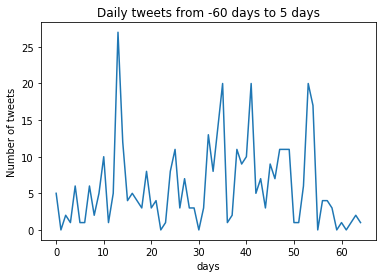





account_name: webdotcom event_date: 2013-08-02
start_date: 2013-06-03 end_date: 2013-08-07
Sum of tweets: 1027


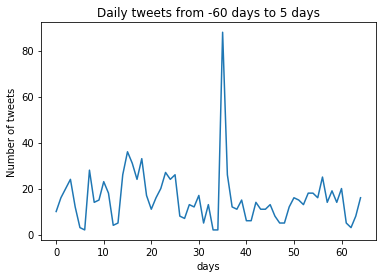





account_name: WebsterBank event_date: 2016-08-09
start_date: 2016-06-10 end_date: 2016-08-14
Sum of tweets: 284


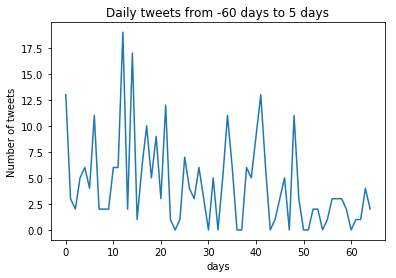





account_name: WebsterBank event_date: 2016-05-09
start_date: 2016-03-10 end_date: 2016-05-14
Sum of tweets: 326


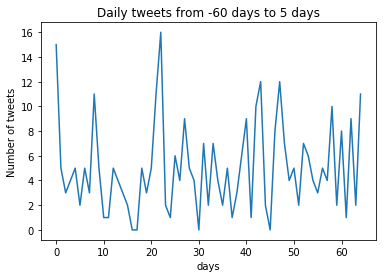





account_name: WeisMarkets event_date: 2015-11-10
start_date: 2015-09-11 end_date: 2015-11-15
Sum of tweets: 483


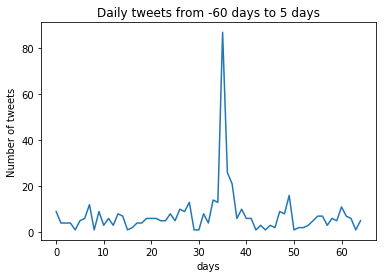





account_name: WeisMarkets event_date: 2014-11-06
start_date: 2014-09-07 end_date: 2014-11-11
Sum of tweets: 232


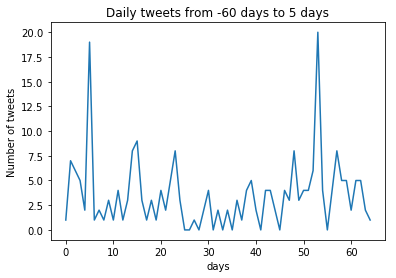





account_name: Welltower event_date: 2017-02-22
start_date: 2016-12-24 end_date: 2017-02-27
Sum of tweets: 50
account_name: Wendys event_date: 2016-03-03
start_date: 2016-01-03 end_date: 2016-03-08
Sum of tweets: 78856


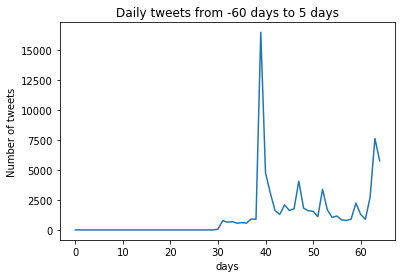





account_name: Wendys event_date: 2014-02-27
start_date: 2013-12-29 end_date: 2014-03-04
Sum of tweets: 22936


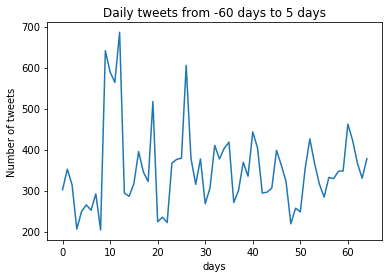





account_name: Wendys event_date: 2014-11-06
start_date: 2014-09-07 end_date: 2014-11-11
Sum of tweets: 33290


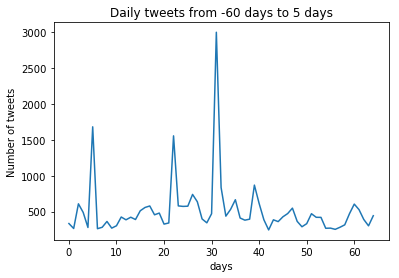





account_name: Wendys event_date: 2013-02-28
start_date: 2012-12-30 end_date: 2013-03-05
Sum of tweets: 14290


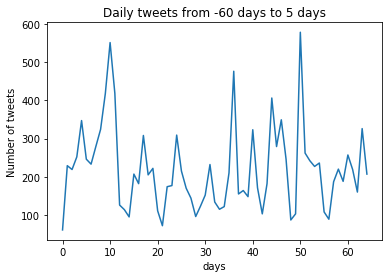





account_name: WESCOcorp event_date: 2017-11-03
start_date: 2017-09-04 end_date: 2017-11-08
Sum of tweets: 82
account_name: WESCOcorp event_date: 2016-02-22
start_date: 2015-12-24 end_date: 2016-02-27
Sum of tweets: 64
account_name: WESCOcorp event_date: 2013-08-07
start_date: 2013-06-08 end_date: 2013-08-12
Sum of tweets: 10
account_name: westmarine event_date: 2014-02-27
start_date: 2013-12-29 end_date: 2014-03-04
Sum of tweets: 95
account_name: Westell_Tech event_date: 2015-10-28
start_date: 2015-08-29 end_date: 2015-11-02
Sum of tweets: 121


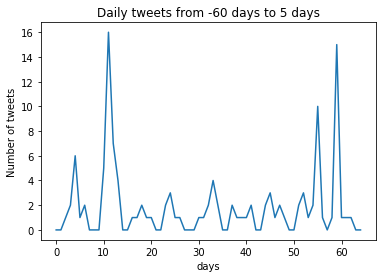





account_name: WesternAsset event_date: 2015-03-16
start_date: 2015-01-15 end_date: 2015-03-21
Sum of tweets: 0
account_name: WesternAsset event_date: 2014-03-17
start_date: 2014-01-16 end_date: 2014-03-22
Sum of tweets: 1
account_name: WesternAsset event_date: 2013-04-02
start_date: 2013-02-01 end_date: 2013-04-07
Sum of tweets: 0
account_name: WESTLAKECHEM event_date: 2013-05-07
start_date: 2013-03-08 end_date: 2013-05-12
Sum of tweets: 28
account_name: WestmorelandCO event_date: 2017-02-24
start_date: 2016-12-26 end_date: 2017-03-01
Sum of tweets: 3
account_name: WestportDotCom event_date: 2013-03-08
start_date: 2013-01-07 end_date: 2013-03-13
Sum of tweets: 181


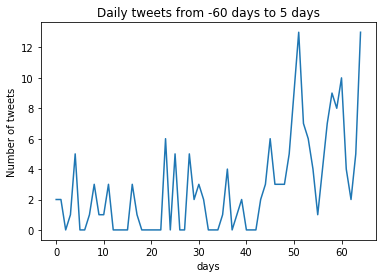





account_name: westwood_group event_date: 2015-07-29
start_date: 2015-05-30 end_date: 2015-08-03
Sum of tweets: 0
account_name: westwood_group event_date: 2014-10-23
start_date: 2014-08-24 end_date: 2014-10-28
Sum of tweets: 0
account_name: WEXIncNews event_date: 2013-08-01
start_date: 2013-06-02 end_date: 2013-08-06
Sum of tweets: 0
account_name: WheelerREIT event_date: 2016-08-04
start_date: 2016-06-05 end_date: 2016-08-09
Sum of tweets: 1
account_name: WilliamsUpdates event_date: 2014-03-03
start_date: 2014-01-02 end_date: 2014-03-08
Sum of tweets: 89
account_name: Windstream event_date: 2016-11-07
start_date: 2016-09-08 end_date: 2016-11-12
Sum of tweets: 1201


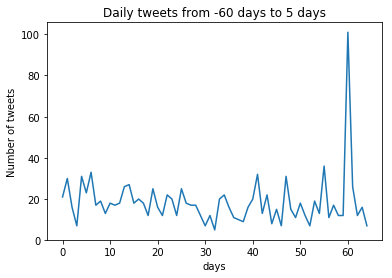





account_name: Windstream event_date: 2015-08-06
start_date: 2015-06-07 end_date: 2015-08-11
Sum of tweets: 1534


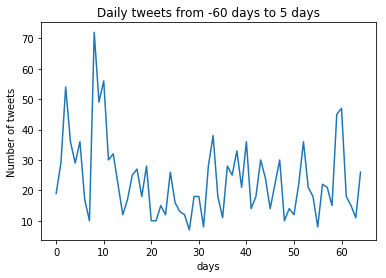





account_name: Windstream event_date: 2015-05-07
start_date: 2015-03-08 end_date: 2015-05-12
Sum of tweets: 1459


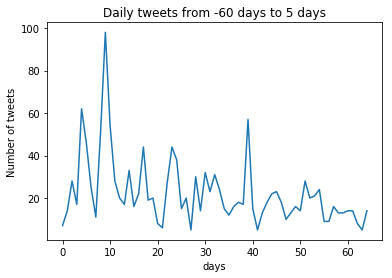





account_name: Windstream event_date: 2013-02-19
start_date: 2012-12-21 end_date: 2013-02-24
Sum of tweets: 630


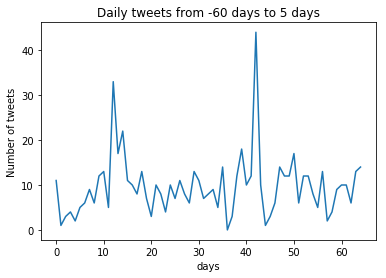





account_name: wnsholdings event_date: 2013-05-02
start_date: 2013-03-03 end_date: 2013-05-07
Sum of tweets: 87
account_name: Workiva event_date: 2015-03-11
start_date: 2015-01-10 end_date: 2015-03-16
Sum of tweets: 177


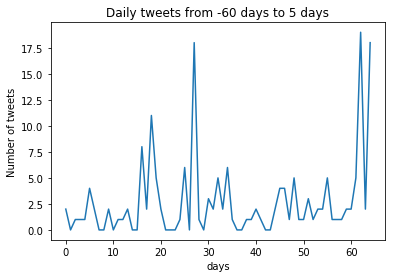





account_name: Workiva event_date: 2014-12-08
start_date: 2014-10-09 end_date: 2014-12-13
Sum of tweets: 256


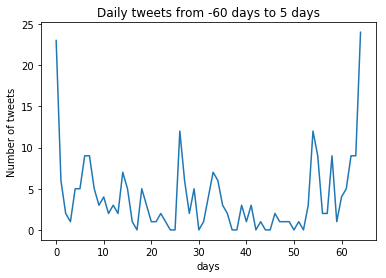





account_name: WWEinvestor event_date: 2015-02-18
start_date: 2014-12-20 end_date: 2015-02-23
Sum of tweets: 43
account_name: WWEinvestor event_date: 2013-05-03
start_date: 2013-03-04 end_date: 2013-05-08
Sum of tweets: 87
account_name: WSFS event_date: 2017-05-09
start_date: 2017-03-10 end_date: 2017-05-14
Sum of tweets: 46
account_name: WSFS event_date: 2016-11-09
start_date: 2016-09-10 end_date: 2016-11-14
Sum of tweets: 78
account_name: WynnLasVegas event_date: 2016-02-29
start_date: 2015-12-31 end_date: 2016-03-05
Sum of tweets: 3341


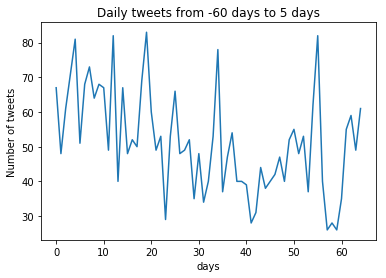





account_name: XenonPharma event_date: 2015-08-13
start_date: 2015-06-14 end_date: 2015-08-18
Sum of tweets: 14
account_name: Xerox event_date: 2017-08-07
start_date: 2017-06-08 end_date: 2017-08-12
Sum of tweets: 6058


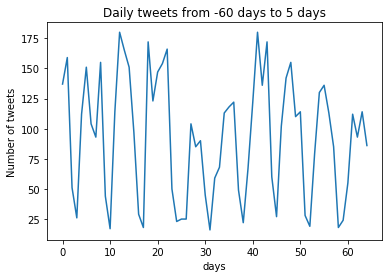





account_name: Xerox event_date: 2015-07-24
start_date: 2015-05-25 end_date: 2015-07-29
Sum of tweets: 654


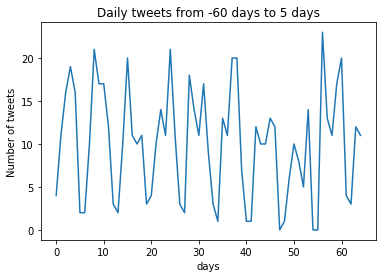





account_name: Yelp event_date: 2014-03-03
start_date: 2014-01-02 end_date: 2014-03-08
Sum of tweets: 10423


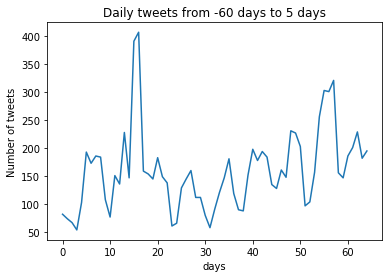





account_name: Zafgen event_date: 2016-03-15
start_date: 2016-01-15 end_date: 2016-03-20
Sum of tweets: 45
account_name: Zafgen event_date: 2014-04-18
start_date: 2014-02-17 end_date: 2014-04-23
Sum of tweets: 2
account_name: ZebraTechnology event_date: 2016-11-01
start_date: 2016-09-02 end_date: 2016-11-06
Sum of tweets: 1486


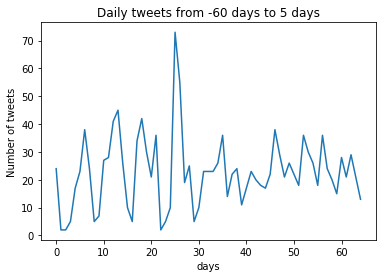





account_name: Zendesk event_date: 2015-08-07
start_date: 2015-06-08 end_date: 2015-08-12
Sum of tweets: 4522


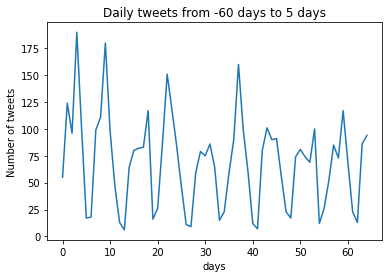





account_name: zimmerbiomet event_date: 2015-10-29
start_date: 2015-08-30 end_date: 2015-11-03
Sum of tweets: 157


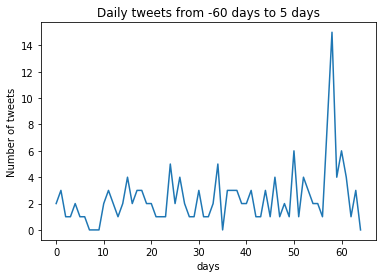





account_name: ZoesKitchen event_date: 2015-03-13
start_date: 2015-01-12 end_date: 2015-03-18
Sum of tweets: 1378


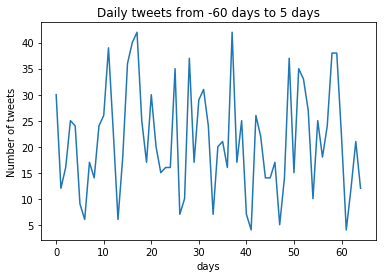





account_name: ZoesKitchen event_date: 2014-08-28
start_date: 2014-06-29 end_date: 2014-09-02
Sum of tweets: 1531


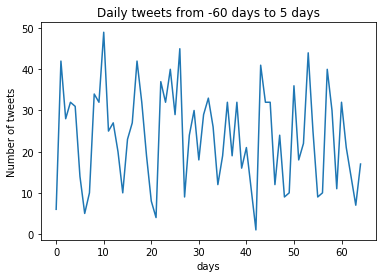





account_name: ZynerbaPharma event_date: 2016-08-11
start_date: 2016-06-12 end_date: 2016-08-16
Sum of tweets: 11
account_name: 1800flowers event_date: 2012-08-23
start_date: 2012-06-24 end_date: 2012-08-28
Sum of tweets: 855


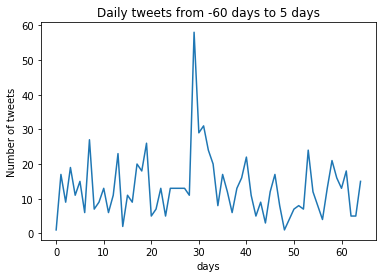





account_name: A_Schulman_Inc event_date: 2009-10-26
start_date: 2009-08-27 end_date: 2009-10-31
Sum of tweets: 0
account_name: AaronsInc event_date: 2008-11-24
start_date: 2008-09-25 end_date: 2008-11-29
Sum of tweets: 0
account_name: Abercrombie event_date: 2012-06-05
start_date: 2012-04-06 end_date: 2012-06-10
Sum of tweets: 2212


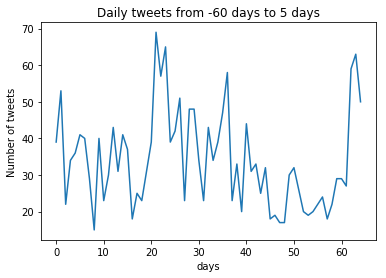





account_name: AECOM event_date: 2009-05-13
start_date: 2009-03-14 end_date: 2009-05-18
Sum of tweets: 0
account_name: AECOM event_date: 2011-11-08
start_date: 2011-09-09 end_date: 2011-11-13
Sum of tweets: 403


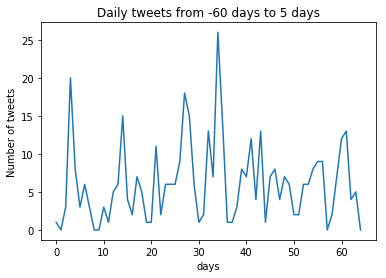





account_name: Aegon event_date: 2012-03-23
start_date: 2012-01-23 end_date: 2012-03-28
Sum of tweets: 98
account_name: AEPnews event_date: 2010-11-01
start_date: 2010-09-02 end_date: 2010-11-06
Sum of tweets: 73
account_name: AlaskaAir event_date: 2008-10-23
start_date: 2008-08-24 end_date: 2008-10-28
Sum of tweets: 1
account_name: alphanr event_date: 2010-11-05
start_date: 2010-09-06 end_date: 2010-11-10
Sum of tweets: 1
account_name: alphanr event_date: 2012-08-09
start_date: 2012-06-10 end_date: 2012-08-14
Sum of tweets: 0
account_name: AltriaNews event_date: 2012-05-16
start_date: 2012-03-17 end_date: 2012-05-21
Sum of tweets: 213


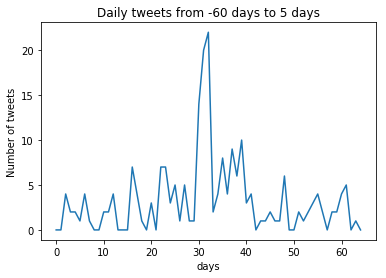





account_name: AmbassadorIntl event_date: 2009-10-30
start_date: 2009-08-31 end_date: 2009-11-04
Sum of tweets: 29
account_name: americanapparel event_date: 2009-08-13
start_date: 2009-06-14 end_date: 2009-08-18
Sum of tweets: 1942


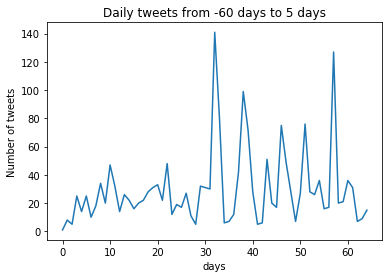





account_name: americanapparel event_date: 2009-07-23
start_date: 2009-05-24 end_date: 2009-07-28
Sum of tweets: 1734


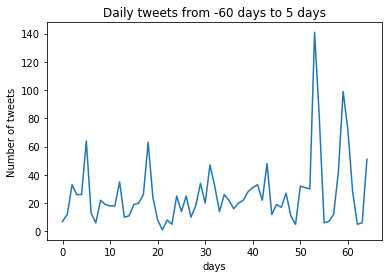





account_name: amgreetings event_date: 2011-11-09
start_date: 2011-09-10 end_date: 2011-11-14
Sum of tweets: 256


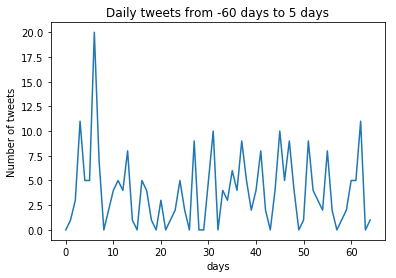





account_name: AspenTech event_date: 2009-12-21
start_date: 2009-10-22 end_date: 2009-12-26
Sum of tweets: 25
account_name: athenahealth event_date: 2010-02-25
start_date: 2009-12-27 end_date: 2010-03-02
Sum of tweets: 27
account_name: attunity event_date: 2010-04-07
start_date: 2010-02-06 end_date: 2010-04-12
Sum of tweets: 30
account_name: Avid event_date: 2012-05-10
start_date: 2012-03-11 end_date: 2012-05-15
Sum of tweets: 2627


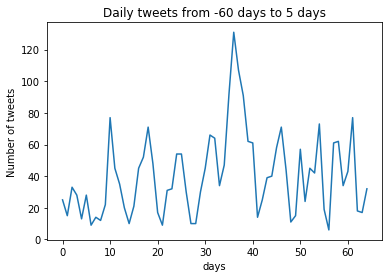





account_name: Benihana event_date: 2009-06-26
start_date: 2009-04-27 end_date: 2009-07-01
Sum of tweets: 27
account_name: BidzAuctions event_date: 2010-05-10
start_date: 2010-03-11 end_date: 2010-05-15
Sum of tweets: 7
account_name: bioclinica event_date: 2011-02-28
start_date: 2010-12-30 end_date: 2011-03-05
Sum of tweets: 62
account_name: 3dsBIOVIA event_date: 2011-08-09
start_date: 2011-06-10 end_date: 2011-08-14
Sum of tweets: 129


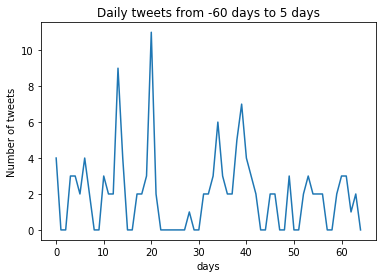





account_name: BJsWholesale event_date: 2010-09-09
start_date: 2010-07-11 end_date: 2010-09-14
Sum of tweets: 508


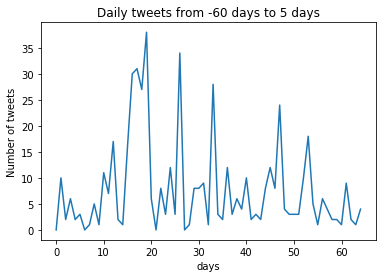





account_name: blackbaud event_date: 2012-02-29
start_date: 2011-12-31 end_date: 2012-03-05
Sum of tweets: 1271


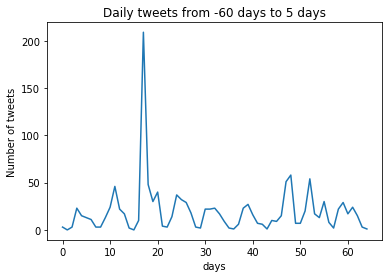





account_name: blackrock event_date: 2010-11-08
start_date: 2010-09-09 end_date: 2010-11-13
Sum of tweets: 6
account_name: blackstone event_date: 2012-08-07
start_date: 2012-06-08 end_date: 2012-08-12
Sum of tweets: 265


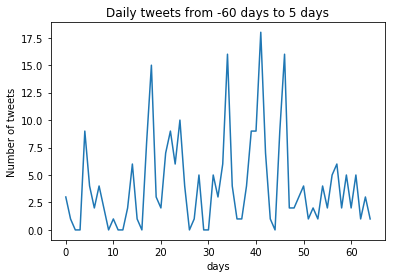





account_name: BostonPrivate event_date: 2012-08-07
start_date: 2012-06-08 end_date: 2012-08-12
Sum of tweets: 0
account_name: Brocade event_date: 2011-09-02
start_date: 2011-07-04 end_date: 2011-09-07
Sum of tweets: 322


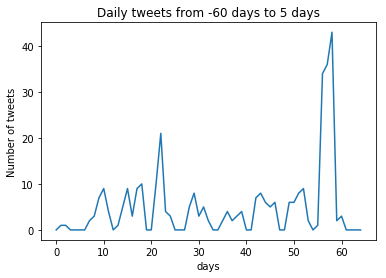





account_name: BrookdaleLiving event_date: 2011-11-09
start_date: 2011-09-10 end_date: 2011-11-14
Sum of tweets: 65
account_name: CallawayGolf event_date: 2011-11-02
start_date: 2011-09-03 end_date: 2011-11-07
Sum of tweets: 779


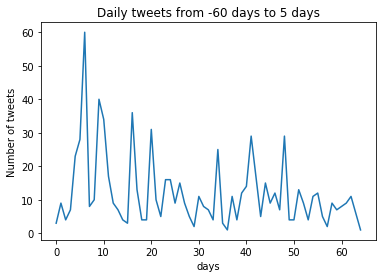





account_name: CallawayGolf event_date: 2011-08-01
start_date: 2011-06-02 end_date: 2011-08-06
Sum of tweets: 2004


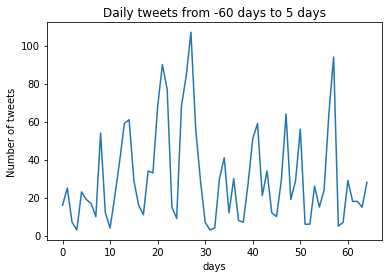





account_name: CarMax event_date: 2012-04-05
start_date: 2012-02-05 end_date: 2012-04-10
Sum of tweets: 867


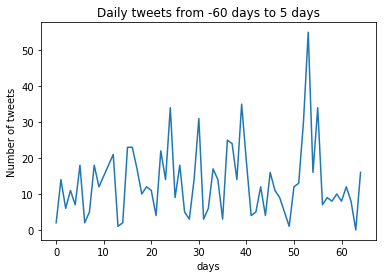





account_name: cblmalls event_date: 2012-02-29
start_date: 2011-12-31 end_date: 2012-03-05
Sum of tweets: 6
account_name: CFIndustries event_date: 2011-11-03
start_date: 2011-09-04 end_date: 2011-11-08
Sum of tweets: 0
account_name: ChanticleerBURG event_date: 2012-09-10
start_date: 2012-07-12 end_date: 2012-09-15
Sum of tweets: 23
account_name: CCOutdoorNA event_date: 2012-08-03
start_date: 2012-06-04 end_date: 2012-08-08
Sum of tweets: 0
account_name: ClearOne event_date: 2009-08-21
start_date: 2009-06-22 end_date: 2009-08-26
Sum of tweets: 0
account_name: ConnectOneBank event_date: 2010-04-30
start_date: 2010-03-01 end_date: 2010-05-05
Sum of tweets: 0
account_name: CooperTire event_date: 2010-07-27
start_date: 2010-05-28 end_date: 2010-08-01
Sum of tweets: 71
account_name: CryoLife event_date: 2010-02-19
start_date: 2009-12-21 end_date: 2010-02-24
Sum of tweets: 0
account_name: CyberDefender event_date: 2010-11-23
start_date: 2010-09-24 end_date: 2010-11-28
Sum of tweets: 8
acco

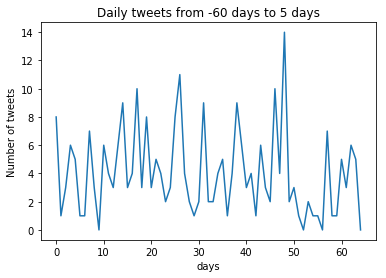





account_name: DelMonteFresh event_date: 2010-08-03
start_date: 2010-06-04 end_date: 2010-08-08
Sum of tweets: 0
account_name: DellEMC event_date: 2012-08-02
start_date: 2012-06-03 end_date: 2012-08-07
Sum of tweets: 309


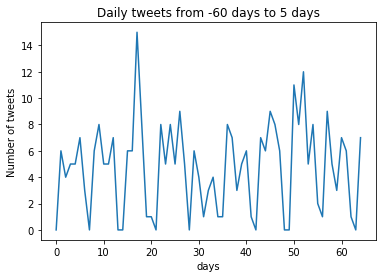





account_name: DennysDiner event_date: 2010-03-12
start_date: 2010-01-11 end_date: 2010-03-17
Sum of tweets: 867


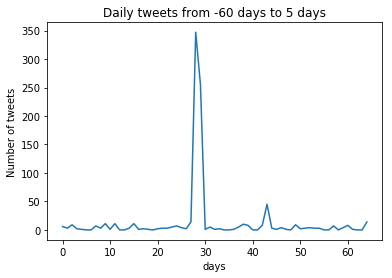





account_name: DGSECompanies event_date: 2011-04-15
start_date: 2011-02-14 end_date: 2011-04-20
Sum of tweets: 53
account_name: DGSECompanies event_date: 2012-04-02
start_date: 2012-02-02 end_date: 2012-04-07
Sum of tweets: 9
account_name: DigitalRiverInc event_date: 2010-02-23
start_date: 2009-12-25 end_date: 2010-02-28
Sum of tweets: 15
account_name: DigitalGlobe event_date: 2012-02-29
start_date: 2011-12-31 end_date: 2012-03-05
Sum of tweets: 298


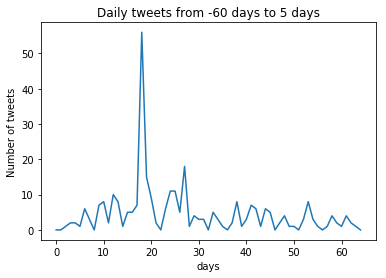





account_name: dish event_date: 2009-03-02
start_date: 2009-01-01 end_date: 2009-03-07
Sum of tweets: 189


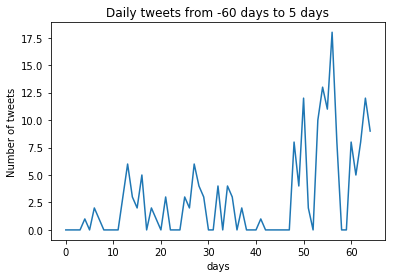





account_name: DnBUS event_date: 2012-02-29
start_date: 2011-12-31 end_date: 2012-03-05
Sum of tweets: 1297


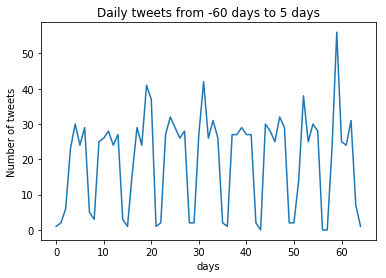





account_name: etrade event_date: 2010-02-24
start_date: 2009-12-26 end_date: 2010-03-01
Sum of tweets: 43
account_name: ECOPETROL_SA event_date: 2011-07-01
start_date: 2011-05-02 end_date: 2011-07-06
Sum of tweets: 284


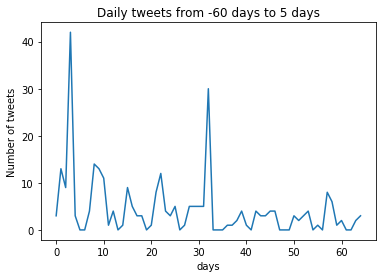





account_name: edgewatertech event_date: 2010-07-12
start_date: 2010-05-13 end_date: 2010-07-17
Sum of tweets: 0
account_name: EinsteinBros event_date: 2011-02-23
start_date: 2010-12-25 end_date: 2011-02-28
Sum of tweets: 8
account_name: EnergySolutions event_date: 2011-03-15
start_date: 2011-01-14 end_date: 2011-03-20
Sum of tweets: 125


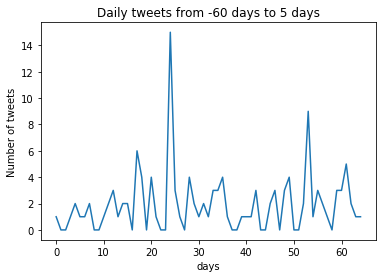





account_name: EnergySolutions event_date: 2012-11-09
start_date: 2012-09-10 end_date: 2012-11-14
Sum of tweets: 86
account_name: ePlus event_date: 2012-05-31
start_date: 2012-04-01 end_date: 2012-06-05
Sum of tweets: 18
account_name: FederalRealty event_date: 2012-02-16
start_date: 2011-12-18 end_date: 2012-02-21
Sum of tweets: 6
account_name: FirstFinancial event_date: 2011-05-13
start_date: 2011-03-14 end_date: 2011-05-18
Sum of tweets: 18
account_name: Fortinet event_date: 2010-11-05
start_date: 2010-09-06 end_date: 2010-11-10
Sum of tweets: 128


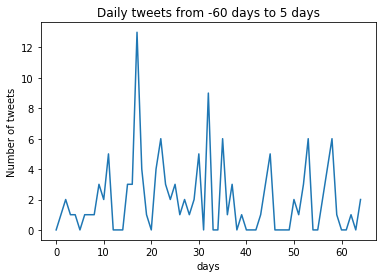





account_name: FTI_US event_date: 2011-11-15
start_date: 2011-09-16 end_date: 2011-11-20
Sum of tweets: 36
account_name: FCA_Inc event_date: 2009-07-28
start_date: 2009-05-29 end_date: 2009-08-02
Sum of tweets: 0
account_name: FTIConsulting event_date: 2009-08-10
start_date: 2009-06-11 end_date: 2009-08-15
Sum of tweets: 0
account_name: Gafisa event_date: 2011-04-01
start_date: 2011-01-31 end_date: 2011-04-06
Sum of tweets: 966


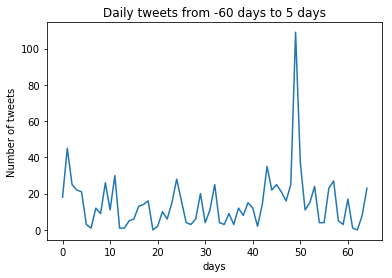





account_name: Gafisa event_date: 2012-07-06
start_date: 2012-05-07 end_date: 2012-07-11
Sum of tweets: 355


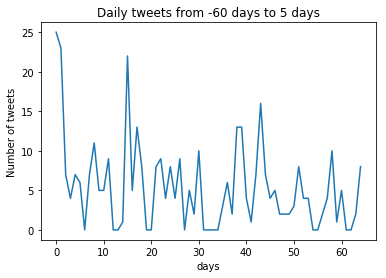





account_name: JoinGaia event_date: 2012-03-15
start_date: 2012-01-15 end_date: 2012-03-20
Sum of tweets: 442


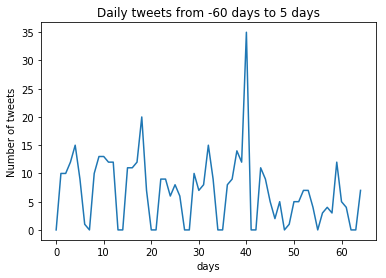





account_name: Gartner_inc event_date: 2009-03-13
start_date: 2009-01-12 end_date: 2009-03-18
Sum of tweets: 686


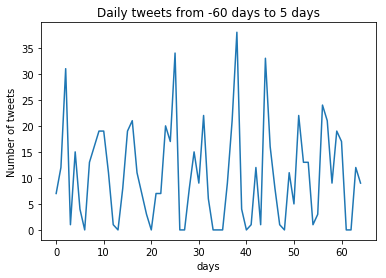





account_name: Generac event_date: 2010-01-11
start_date: 2009-11-12 end_date: 2010-01-16
Sum of tweets: 0
account_name: GM event_date: 2010-08-16
start_date: 2010-06-17 end_date: 2010-08-21
Sum of tweets: 971


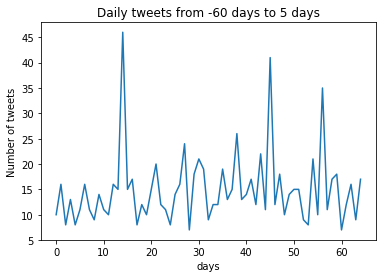





account_name: grainger event_date: 2008-11-07
start_date: 2008-09-08 end_date: 2008-11-12
Sum of tweets: 0
account_name: gcu event_date: 2008-08-13
start_date: 2008-06-14 end_date: 2008-08-18
Sum of tweets: 0
account_name: gcu event_date: 2010-02-18
start_date: 2009-12-20 end_date: 2010-02-23
Sum of tweets: 265


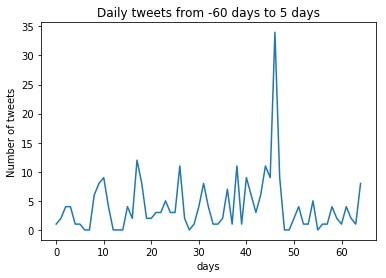





account_name: gcu event_date: 2011-11-07
start_date: 2011-09-08 end_date: 2011-11-12
Sum of tweets: 528


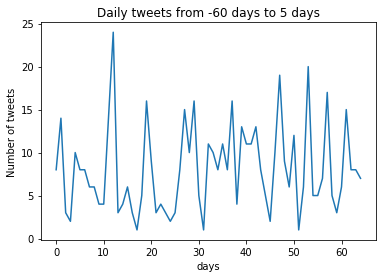





account_name: GreatWolfLodge event_date: 2010-02-26
start_date: 2009-12-28 end_date: 2010-03-03
Sum of tweets: 143


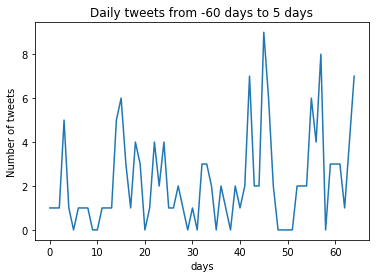





account_name: Groupon event_date: 2011-09-23
start_date: 2011-07-25 end_date: 2011-09-28
Sum of tweets: 10328


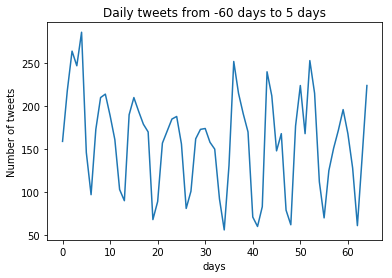





account_name: Guidewire_PandC event_date: 2011-10-28
start_date: 2011-08-29 end_date: 2011-11-02
Sum of tweets: 115


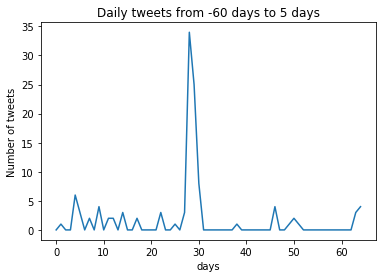





account_name: hansenmedical event_date: 2011-08-08
start_date: 2011-06-09 end_date: 2011-08-13
Sum of tweets: 0
account_name: hansenmedical event_date: 2012-03-15
start_date: 2012-01-15 end_date: 2012-03-20
Sum of tweets: 0
account_name: harleydavidson event_date: 2010-05-05
start_date: 2010-03-06 end_date: 2010-05-10
Sum of tweets: 509


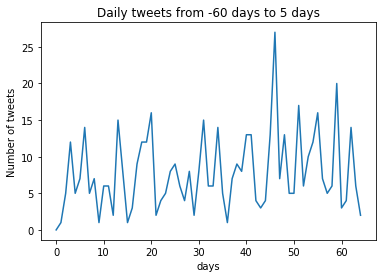





account_name: healthnet event_date: 2010-02-26
start_date: 2009-12-28 end_date: 2010-03-03
Sum of tweets: 66
account_name: HeartlandHPY event_date: 2012-08-06
start_date: 2012-06-07 end_date: 2012-08-11
Sum of tweets: 457


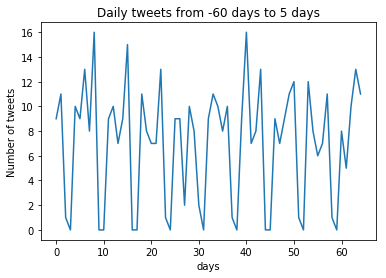





account_name: HubGroup event_date: 2012-02-24
start_date: 2011-12-26 end_date: 2012-02-29
Sum of tweets: 0
account_name: ICU_Medical event_date: 2012-03-23
start_date: 2012-01-23 end_date: 2012-03-28
Sum of tweets: 27
account_name: IDTInc event_date: 2012-01-30
start_date: 2011-12-01 end_date: 2012-02-04
Sum of tweets: 16
account_name: Infogroup event_date: 2009-08-10
start_date: 2009-06-11 end_date: 2009-08-15
Sum of tweets: 281


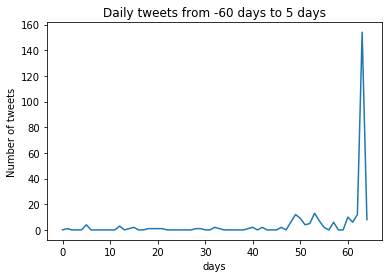





account_name: InlandGroup event_date: 2011-11-08
start_date: 2011-09-09 end_date: 2011-11-13
Sum of tweets: 46
account_name: InsigniaPOPS event_date: 2011-08-03
start_date: 2011-06-04 end_date: 2011-08-08
Sum of tweets: 177


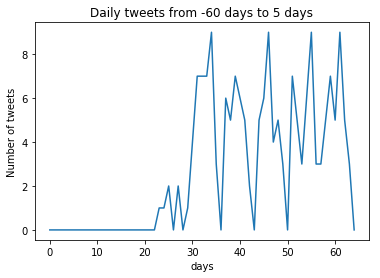





account_name: Intralinks event_date: 2011-03-23
start_date: 2011-01-22 end_date: 2011-03-28
Sum of tweets: 86
account_name: Inuvo event_date: 2010-03-23
start_date: 2010-01-22 end_date: 2010-03-28
Sum of tweets: 36
account_name: InvescoUS event_date: 2012-11-01
start_date: 2012-09-02 end_date: 2012-11-06
Sum of tweets: 121


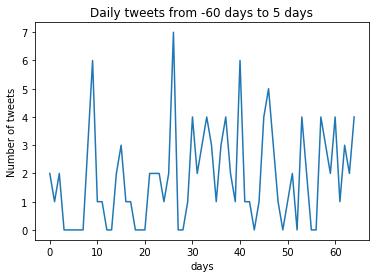





account_name: InvescoUS event_date: 2012-05-07
start_date: 2012-03-08 end_date: 2012-05-12
Sum of tweets: 111


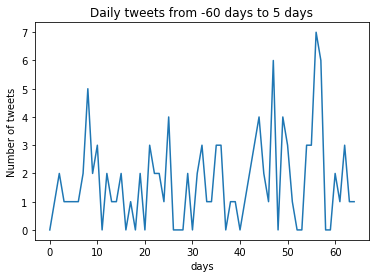





account_name: ItronInc event_date: 2011-02-25
start_date: 2010-12-27 end_date: 2011-03-02
Sum of tweets: 221


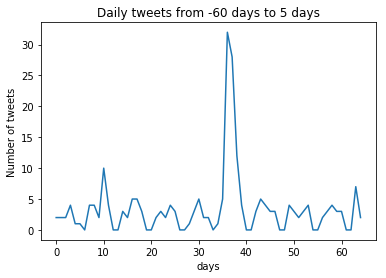





account_name: JackBox event_date: 2011-01-04
start_date: 2010-11-05 end_date: 2011-01-09
Sum of tweets: 1472


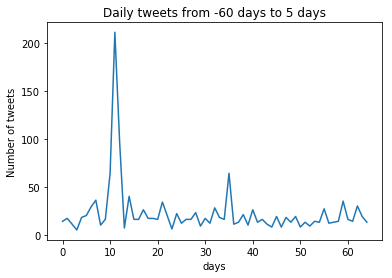





account_name: JaggaerPro event_date: 2010-05-11
start_date: 2010-03-12 end_date: 2010-05-16
Sum of tweets: 0
account_name: JDASoftware event_date: 2011-03-01
start_date: 2010-12-31 end_date: 2011-03-06
Sum of tweets: 162


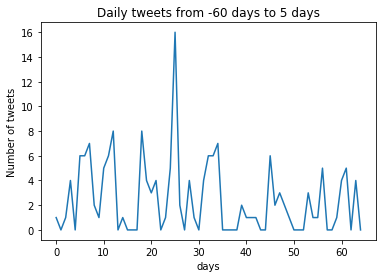





account_name: JetBlue event_date: 2011-01-18
start_date: 2010-11-19 end_date: 2011-01-23
Sum of tweets: 10580


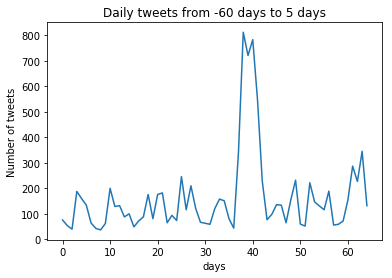





account_name: JNJNews event_date: 2012-11-09
start_date: 2012-09-10 end_date: 2012-11-14
Sum of tweets: 219


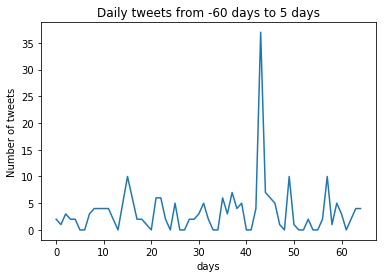





account_name: khov event_date: 2010-12-22
start_date: 2010-10-23 end_date: 2010-12-27
Sum of tweets: 35
account_name: KSWISS event_date: 2009-03-05
start_date: 2009-01-04 end_date: 2009-03-10
Sum of tweets: 10
account_name: KossHeadphones event_date: 2009-12-21
start_date: 2009-10-22 end_date: 2009-12-26
Sum of tweets: 0
account_name: LasVegasSands event_date: 2012-02-29
start_date: 2011-12-31 end_date: 2012-03-05
Sum of tweets: 37
account_name: LendingTree event_date: 2012-04-16
start_date: 2012-02-16 end_date: 2012-04-21
Sum of tweets: 956


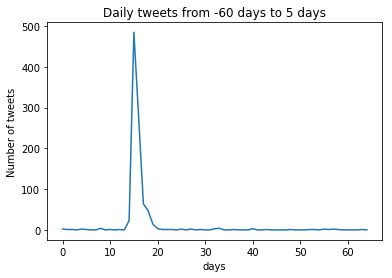





account_name: LibPropTrust event_date: 2009-05-22
start_date: 2009-03-23 end_date: 2009-05-27
Sum of tweets: 1
account_name: lpcorp event_date: 2010-07-30
start_date: 2010-05-31 end_date: 2010-08-04
Sum of tweets: 2
account_name: Luxottica event_date: 2012-04-27
start_date: 2012-02-27 end_date: 2012-05-02
Sum of tweets: 14
account_name: LyondellBasell event_date: 2011-08-12
start_date: 2011-06-13 end_date: 2011-08-17
Sum of tweets: 10
account_name: LyondellBasell event_date: 2011-03-18
start_date: 2011-01-17 end_date: 2011-03-23
Sum of tweets: 6
account_name: MagnetekInc event_date: 2010-08-31
start_date: 2010-07-02 end_date: 2010-09-05
Sum of tweets: 7
account_name: MarineMax event_date: 2012-12-07
start_date: 2012-10-08 end_date: 2012-12-12
Sum of tweets: 87
account_name: MarlinFinance event_date: 2009-08-07
start_date: 2009-06-08 end_date: 2009-08-12
Sum of tweets: 0
account_name: McandSchmicks event_date: 2010-08-03
start_date: 2010-06-04 end_date: 2010-08-08
Sum of tweets: 403

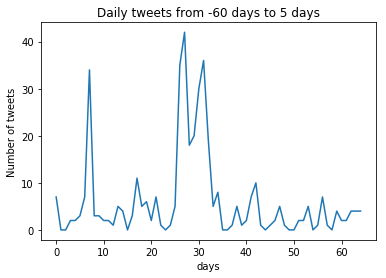





account_name: MeadeInstrument event_date: 2012-10-04
start_date: 2012-08-05 end_date: 2012-10-09
Sum of tweets: 110


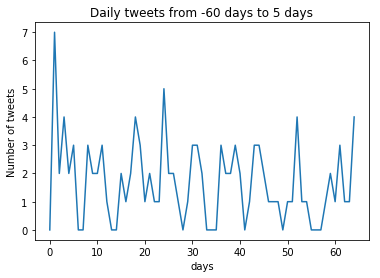





account_name: Mediasite event_date: 2009-11-30
start_date: 2009-10-01 end_date: 2009-12-05
Sum of tweets: 304


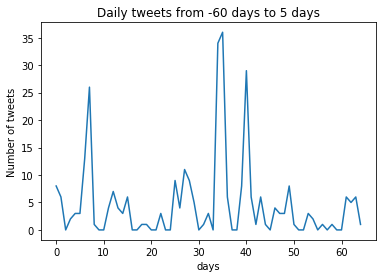





account_name: Medidata event_date: 2009-05-15
start_date: 2009-03-16 end_date: 2009-05-20
Sum of tweets: 0
account_name: Medifast event_date: 2010-03-31
start_date: 2010-01-30 end_date: 2010-04-05
Sum of tweets: 520


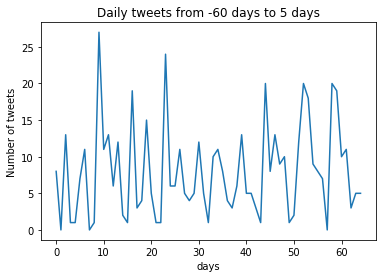





account_name: Medifast event_date: 2011-03-16
start_date: 2011-01-15 end_date: 2011-03-21
Sum of tweets: 1066


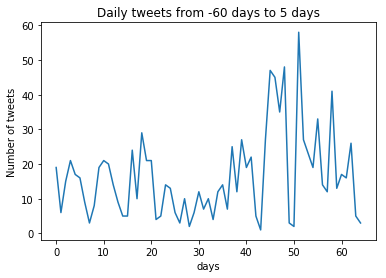





account_name: MeritMedical event_date: 2012-05-10
start_date: 2012-03-11 end_date: 2012-05-15
Sum of tweets: 15
account_name: MicrosFidelio event_date: 2010-02-04
start_date: 2009-12-06 end_date: 2010-02-09
Sum of tweets: 0
account_name: ModineMfg event_date: 2011-06-14
start_date: 2011-04-15 end_date: 2011-06-19
Sum of tweets: 0
account_name: ModineMfg event_date: 2012-06-01
start_date: 2012-04-02 end_date: 2012-06-06
Sum of tweets: 0
account_name: ModusLink event_date: 2012-03-12
start_date: 2012-01-12 end_date: 2012-03-17
Sum of tweets: 7
account_name: MolexConnectors event_date: 2010-08-03
start_date: 2010-06-04 end_date: 2010-08-08
Sum of tweets: 60
account_name: MolexConnectors event_date: 2012-10-25
start_date: 2012-08-26 end_date: 2012-10-30
Sum of tweets: 102


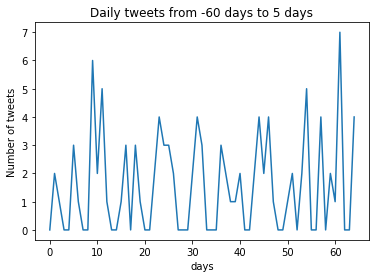





account_name: MTNLOfficial event_date: 2010-09-30
start_date: 2010-08-01 end_date: 2010-10-05
Sum of tweets: 0
account_name: MuellerWaterPro event_date: 2012-11-23
start_date: 2012-09-24 end_date: 2012-11-28
Sum of tweets: 89
account_name: NaturalGrocers event_date: 2012-06-18
start_date: 2012-04-19 end_date: 2012-06-23
Sum of tweets: 280


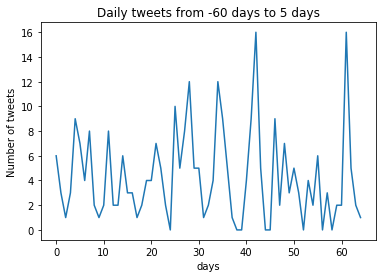





account_name: naturessunshine event_date: 2009-05-21
start_date: 2009-03-22 end_date: 2009-05-26
Sum of tweets: 5
account_name: NeenahPaper event_date: 2009-11-09
start_date: 2009-09-10 end_date: 2009-11-14
Sum of tweets: 2264


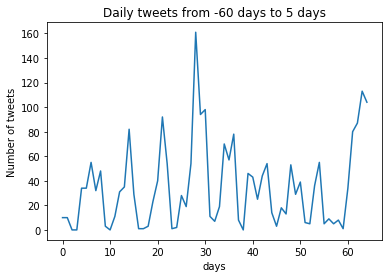





account_name: NeenahPaper event_date: 2010-11-05
start_date: 2010-09-06 end_date: 2010-11-10
Sum of tweets: 1577


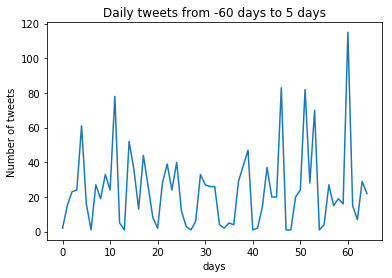





account_name: NetApp event_date: 2011-06-23
start_date: 2011-04-24 end_date: 2011-06-28
Sum of tweets: 753


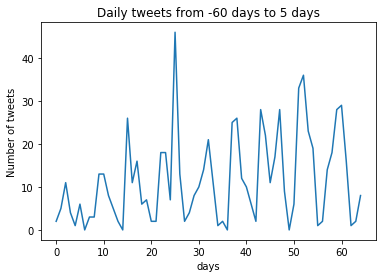





account_name: NETGEAR event_date: 2009-07-22
start_date: 2009-05-23 end_date: 2009-07-27
Sum of tweets: 649


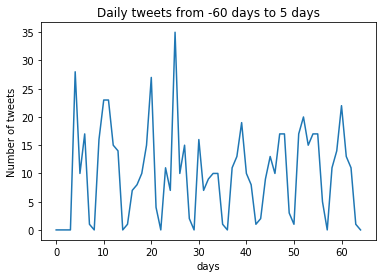





account_name: Nordstrom event_date: 2008-06-10
start_date: 2008-04-11 end_date: 2008-06-15
Sum of tweets: 1
account_name: northropgrumman event_date: 2012-02-08
start_date: 2011-12-10 end_date: 2012-02-13
Sum of tweets: 541


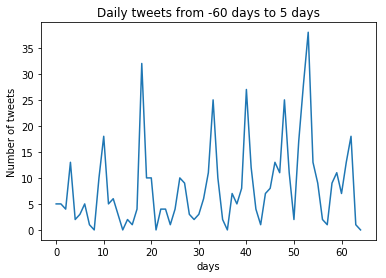





account_name: Nutrisystem event_date: 2009-03-06
start_date: 2009-01-05 end_date: 2009-03-11
Sum of tweets: 6
account_name: OclaroInc event_date: 2012-04-25
start_date: 2012-02-25 end_date: 2012-04-30
Sum of tweets: 0
account_name: OclaroInc event_date: 2012-10-10
start_date: 2012-08-11 end_date: 2012-10-15
Sum of tweets: 0
account_name: OfficeMax event_date: 2009-02-25
start_date: 2008-12-27 end_date: 2009-03-02
Sum of tweets: 8
account_name: omnicare event_date: 2012-02-23
start_date: 2011-12-25 end_date: 2012-02-28
Sum of tweets: 6
account_name: OpenTable event_date: 2010-03-11
start_date: 2010-01-10 end_date: 2010-03-16
Sum of tweets: 2352


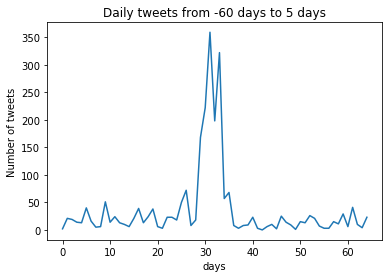





account_name: OpenText event_date: 2011-02-18
start_date: 2010-12-20 end_date: 2011-02-23
Sum of tweets: 269


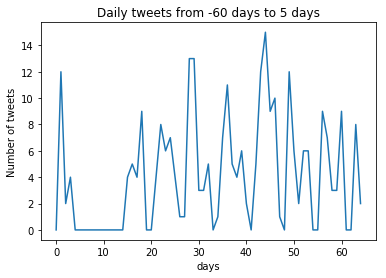





account_name: orionlighting event_date: 2011-05-18
start_date: 2011-03-19 end_date: 2011-05-23
Sum of tweets: 0
account_name: orionlighting event_date: 2012-02-01
start_date: 2011-12-03 end_date: 2012-02-06
Sum of tweets: 0
account_name: ParkerHannifin event_date: 2012-05-09
start_date: 2012-03-10 end_date: 2012-05-14
Sum of tweets: 71
account_name: PeoplesUnited event_date: 2012-11-02
start_date: 2012-09-03 end_date: 2012-11-07
Sum of tweets: 91
account_name: PerkinElmer event_date: 2012-02-28
start_date: 2011-12-30 end_date: 2012-03-04
Sum of tweets: 122


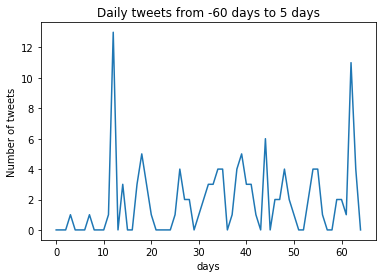





account_name: Primerica event_date: 2011-03-17
start_date: 2011-01-16 end_date: 2011-03-22
Sum of tweets: 147


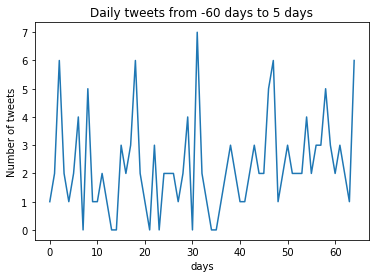





account_name: ProgressSW event_date: 2012-10-10
start_date: 2012-08-11 end_date: 2012-10-15
Sum of tweets: 379


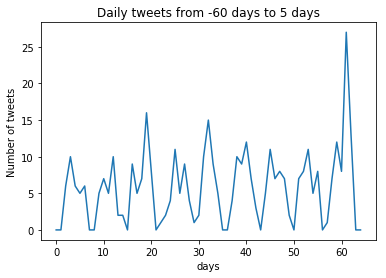





account_name: qlik event_date: 2012-02-16
start_date: 2011-12-18 end_date: 2012-02-21
Sum of tweets: 52
account_name: Quest event_date: 2009-08-10
start_date: 2009-06-11 end_date: 2009-08-15
Sum of tweets: 27
account_name: rambusinc event_date: 2010-10-29
start_date: 2010-08-30 end_date: 2010-11-03
Sum of tweets: 19
account_name: Range_Resources event_date: 2012-02-22
start_date: 2011-12-24 end_date: 2012-02-27
Sum of tweets: 2
account_name: RCNconnects event_date: 2009-08-04
start_date: 2009-06-05 end_date: 2009-08-09
Sum of tweets: 98
account_name: Realogy event_date: 2012-09-28
start_date: 2012-07-30 end_date: 2012-10-03
Sum of tweets: 7
account_name: RegalBeloitCorp event_date: 2012-02-29
start_date: 2011-12-31 end_date: 2012-03-05
Sum of tweets: 38
account_name: RoyalCaribbean event_date: 2011-07-27
start_date: 2011-05-28 end_date: 2011-08-01
Sum of tweets: 4244


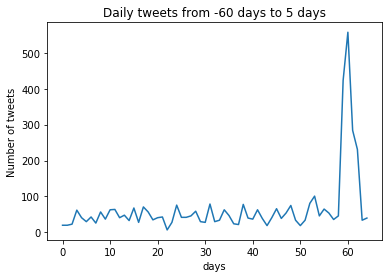





account_name: RubiosTweets event_date: 2009-05-13
start_date: 2009-03-14 end_date: 2009-05-18
Sum of tweets: 92
account_name: rubytuesday event_date: 2012-10-11
start_date: 2012-08-12 end_date: 2012-10-16
Sum of tweets: 954


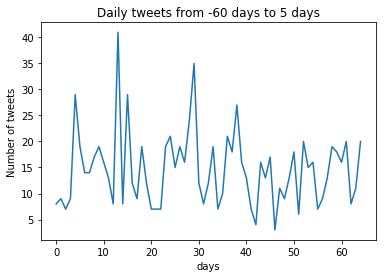





account_name: SanDisk event_date: 2009-02-26
start_date: 2008-12-28 end_date: 2009-03-03
Sum of tweets: 70
account_name: successfactors event_date: 2011-11-08
start_date: 2011-09-09 end_date: 2011-11-13
Sum of tweets: 287


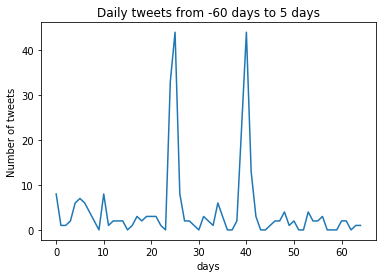





account_name: successfactors event_date: 2011-03-02
start_date: 2011-01-01 end_date: 2011-03-07
Sum of tweets: 106


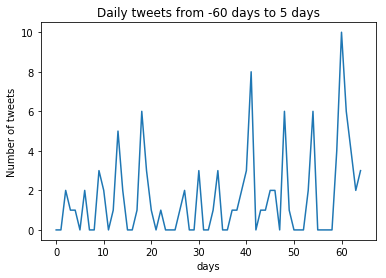





account_name: Scholastic event_date: 2008-07-30
start_date: 2008-05-31 end_date: 2008-08-04
Sum of tweets: 2
account_name: ScientificGames event_date: 2009-11-04
start_date: 2009-09-05 end_date: 2009-11-09
Sum of tweets: 0
account_name: shapeways event_date: 2006-11-03
start_date: 2006-09-04 end_date: 2006-11-08
Sum of tweets: 0
account_name: Shutterfly event_date: 2009-10-23
start_date: 2009-08-24 end_date: 2009-10-28
Sum of tweets: 682


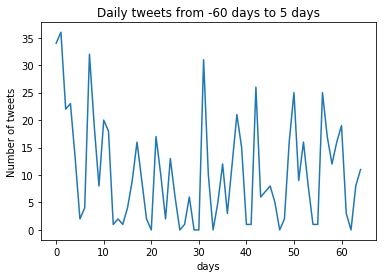





account_name: SVB_Financial event_date: 2009-07-23
start_date: 2009-05-24 end_date: 2009-07-28
Sum of tweets: 20
account_name: SIRIUSXM event_date: 2012-11-01
start_date: 2012-09-02 end_date: 2012-11-06
Sum of tweets: 15573


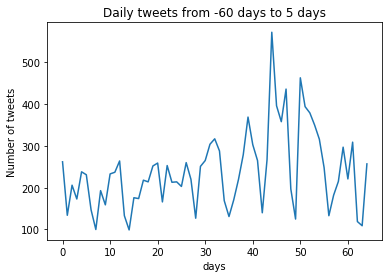





account_name: SouthernFirst event_date: 2011-11-04
start_date: 2011-09-05 end_date: 2011-11-09
Sum of tweets: 0
account_name: SouthwestAir event_date: 2009-10-15
start_date: 2009-08-16 end_date: 2009-10-20
Sum of tweets: 9088


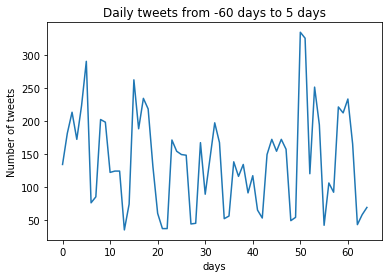





account_name: SouthwestAir event_date: 2009-04-20
start_date: 2009-02-19 end_date: 2009-04-25
Sum of tweets: 6186


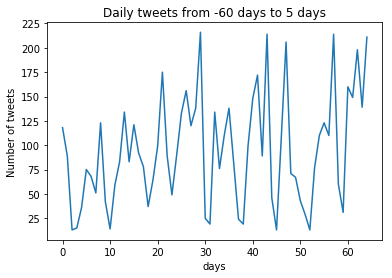





account_name: ShopStageStores event_date: 2010-03-30
start_date: 2010-01-29 end_date: 2010-04-04
Sum of tweets: 0
account_name: ShopStageStores event_date: 2011-06-09
start_date: 2011-04-10 end_date: 2011-06-14
Sum of tweets: 22
account_name: StarrettTools event_date: 2011-11-08
start_date: 2011-09-09 end_date: 2011-11-13
Sum of tweets: 22
account_name: StarrettTools event_date: 2012-09-12
start_date: 2012-07-14 end_date: 2012-09-17
Sum of tweets: 55
account_name: Steelcase event_date: 2012-10-01
start_date: 2012-08-02 end_date: 2012-10-06
Sum of tweets: 550


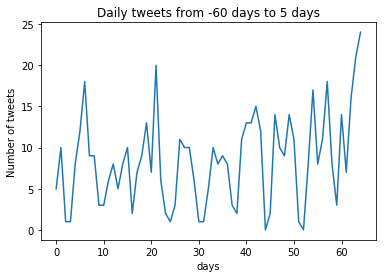





account_name: steinmart event_date: 2012-09-07
start_date: 2012-07-09 end_date: 2012-09-12
Sum of tweets: 111


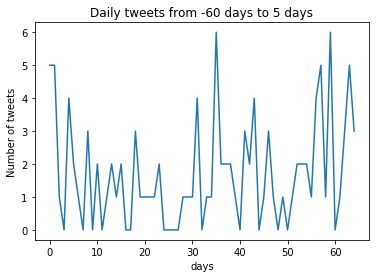





account_name: StewartTitleCo event_date: 2009-08-06
start_date: 2009-06-07 end_date: 2009-08-11
Sum of tweets: 0
account_name: superiorind event_date: 2011-03-21
start_date: 2011-01-20 end_date: 2011-03-26
Sum of tweets: 80
account_name: Supertex_Inc event_date: 2012-02-09
start_date: 2011-12-11 end_date: 2012-02-14
Sum of tweets: 3
account_name: Symmetricom event_date: 2012-09-13
start_date: 2012-07-15 end_date: 2012-09-18
Sum of tweets: 27
account_name: tata_comm event_date: 2010-08-20
start_date: 2010-06-21 end_date: 2010-08-25
Sum of tweets: 19
account_name: Taylor_Morrison event_date: 2011-11-14
start_date: 2011-09-15 end_date: 2011-11-19
Sum of tweets: 10
account_name: Taylor_Morrison event_date: 2012-08-06
start_date: 2012-06-07 end_date: 2012-08-11
Sum of tweets: 177


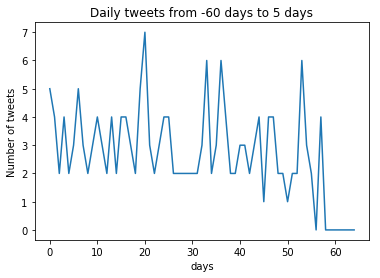





account_name: TEConnectivity event_date: 2010-07-23
start_date: 2010-05-24 end_date: 2010-07-28
Sum of tweets: 40
account_name: TechTarget event_date: 2009-02-12
start_date: 2008-12-14 end_date: 2009-02-17
Sum of tweets: 0
account_name: TeledyneLecroy event_date: 2010-11-16
start_date: 2010-09-17 end_date: 2010-11-21
Sum of tweets: 0
account_name: Tellabs event_date: 2011-11-29
start_date: 2011-09-30 end_date: 2011-12-04
Sum of tweets: 167


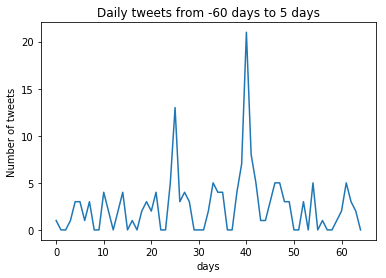





account_name: Teradata event_date: 2007-11-13
start_date: 2007-09-14 end_date: 2007-11-18
Sum of tweets: 0
account_name: Teradata event_date: 2008-03-03
start_date: 2008-01-03 end_date: 2008-03-08
Sum of tweets: 0
account_name: TerexCorp event_date: 2012-08-07
start_date: 2012-06-08 end_date: 2012-08-12
Sum of tweets: 65
account_name: TheAtlantic event_date: 2012-03-26
start_date: 2012-01-26 end_date: 2012-03-31
Sum of tweets: 30341


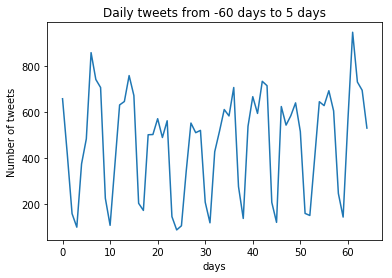





account_name: tofuttibrand event_date: 2011-04-01
start_date: 2011-01-31 end_date: 2011-04-06
Sum of tweets: 148


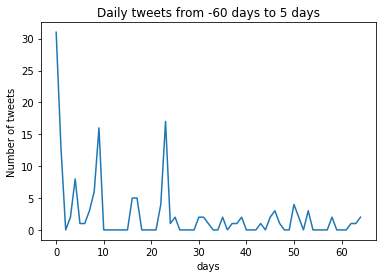





account_name: Trex_Company event_date: 2009-07-27
start_date: 2009-05-28 end_date: 2009-08-01
Sum of tweets: 1
account_name: TysonFoods event_date: 2008-08-27
start_date: 2008-06-28 end_date: 2008-09-01
Sum of tweets: 114


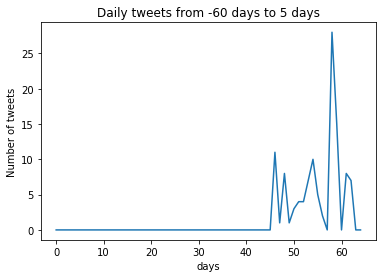





account_name: TysonFoods event_date: 2012-08-01
start_date: 2012-06-02 end_date: 2012-08-06
Sum of tweets: 1685


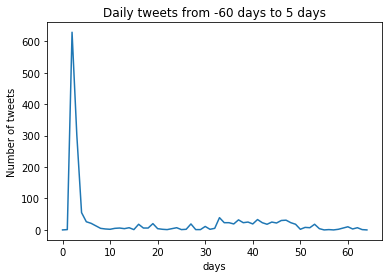





account_name: UltimateHCM event_date: 2011-05-10
start_date: 2011-03-11 end_date: 2011-05-15
Sum of tweets: 510


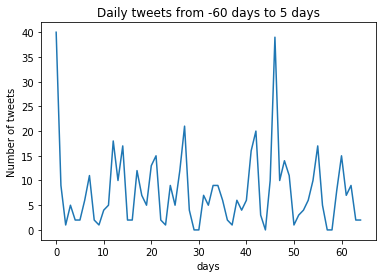





account_name: united event_date: 2012-02-22
start_date: 2011-12-24 end_date: 2012-02-27
Sum of tweets: 13873


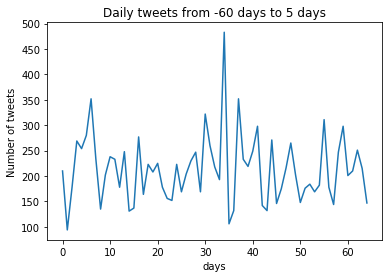





account_name: UniTekGS event_date: 2011-11-17
start_date: 2011-09-18 end_date: 2011-11-22
Sum of tweets: 30
account_name: USANAinc event_date: 2009-02-23
start_date: 2008-12-25 end_date: 2009-02-28
Sum of tweets: 120


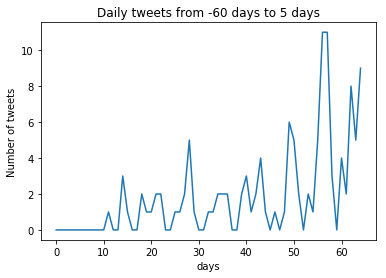





account_name: USANAinc event_date: 2011-11-09
start_date: 2011-09-10 end_date: 2011-11-14
Sum of tweets: 1338


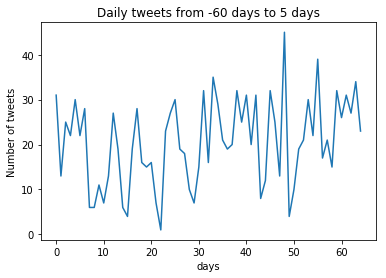





account_name: ValmontInd event_date: 2010-08-03
start_date: 2010-06-04 end_date: 2010-08-08
Sum of tweets: 0
account_name: VCAPetHealth event_date: 2011-05-10
start_date: 2011-03-11 end_date: 2011-05-15
Sum of tweets: 2
account_name: Veolia event_date: 2011-08-08
start_date: 2011-06-09 end_date: 2011-08-13
Sum of tweets: 50
account_name: Vitacost event_date: 2010-11-15
start_date: 2010-09-16 end_date: 2010-11-20
Sum of tweets: 577


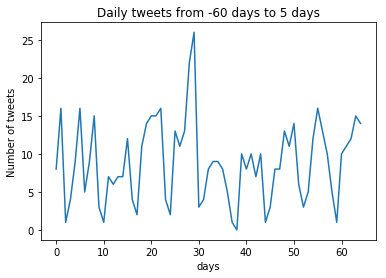





account_name: Wells Fargo event_date: 2008-02-29
start_date: 2007-12-31 end_date: 2008-03-05
Sum of tweets: 0
account_name: wetseal event_date: 2010-12-02
start_date: 2010-10-03 end_date: 2010-12-07
Sum of tweets: 110


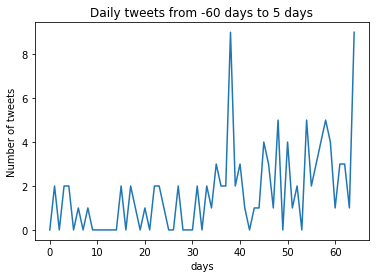





account_name: Wilhelmina event_date: 2012-05-15
start_date: 2012-03-16 end_date: 2012-05-20
Sum of tweets: 182


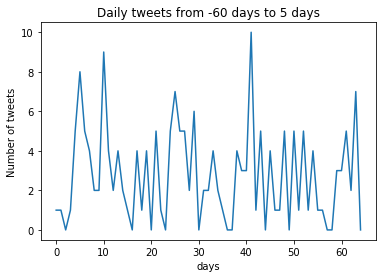





account_name: WilliamsUpdates event_date: 2010-10-28
start_date: 2010-08-29 end_date: 2010-11-02
Sum of tweets: 12
account_name: WilliamsUpdates event_date: 2012-05-01
start_date: 2012-03-02 end_date: 2012-05-06
Sum of tweets: 16
account_name: Wintrust event_date: 2010-08-16
start_date: 2010-06-17 end_date: 2010-08-21
Sum of tweets: 0
account_name: WPXEnergy event_date: 2012-02-28
start_date: 2011-12-30 end_date: 2012-03-04
Sum of tweets: 4
account_name: XylemInc event_date: 2011-08-22
start_date: 2011-06-23 end_date: 2011-08-27
Sum of tweets: 0
account_name: ZalesJewelers event_date: 2009-09-18
start_date: 2009-07-20 end_date: 2009-09-23
Sum of tweets: 210


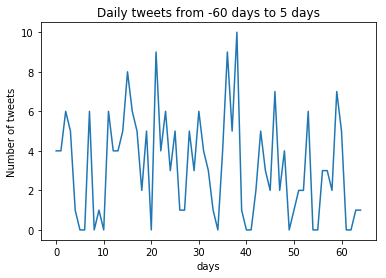





account_name: zoomgroupindia event_date: 2012-11-19
start_date: 2012-09-20 end_date: 2012-11-24
Sum of tweets: 129


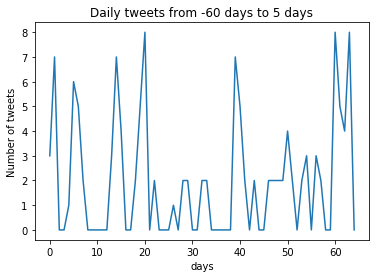





account_name: ZygoCorp event_date: 2010-05-11
start_date: 2010-03-12 end_date: 2010-05-16
Sum of tweets: 5
account_name: zynga event_date: 2011-08-11
start_date: 2011-06-12 end_date: 2011-08-16
Sum of tweets: 1862


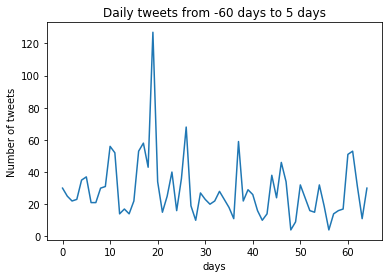

In [21]:
count_larger_100 = 0
count = dict()
count_company = dict()
count_other = dict()
x = range(65)

with open(input_file, encoding = "ISO-8859-1") as f:
    reader = csv.DictReader(f)
    for row in reader:
        date = row['eventDate']
        account_name = row['twitter_account_name'][1:]
        if not account_name:
            continue
        day, month, year = map(int, date.split('/'))
        year += 2000
        event_date = datetime.date(year, month, day)
        start_date = event_date + BEFORE_TIME_DELTA
        end_date = event_date + AFTER_TIME_DELTA
        print('account_name:', account_name, 'event_date:', event_date)
        print('start_date:', start_date, 'end_date:', end_date)
        result_file_name = 'res/{}_{}.csv'.format(account_name, event_date.strftime('%Y%m%d'))
        for i in x:
            cur_delta = datetime.timedelta(days=i)
            count[cur_delta] = 0
            count_company[cur_delta] = 0
            count_other[cur_delta] = 0
        with open(result_file_name) as result_f:
            next(result_f)
            for line in result_f:
                words = line.split(',')
                time, username = words[0], words[1]
                date = time.split()[0]
                year, month, day = map(int, date.split('-'))
                cur_date = datetime.date(year, month, day)
                cur_delta = cur_date - start_date
                count[cur_delta] += 1
                if username == account_name:
                    count_company[cur_delta] += 1
                else:
                    count_other[cur_delta] += 1
        print('Sum of tweets:', sum(count.values()))
        if sum(count.values()) < 100:
            continue
        count_larger_100 += 1
        y = [count[datetime.timedelta(days=i)] for i in x]
        y_company = [count_company[datetime.timedelta(days=i)] for i in x]
        y_other = [count_other[datetime.timedelta(days=i)] for i in x]
        plt.plot(x, y)
        plt.title('Daily tweets from -60 days to 5 days')
        plt.xlabel('days')
        plt.ylabel('Number of tweets')
        plt.show()
        print('\n\n\n')
# print(count_larger_100)